# Analysing Employee Attrition

According to the Society for Human Resource Management (SHRM), employee attrition (or churn) refers to a reduction in a company's workforce through employee retirement, resignation, death or elimination of positions without immediate replacement of the resulting vacancies. Attrition may refer to voluntary leave (including retirement as well as internal attrition, which occurs when an employee leaves their current position for another role within the company) or involuntary leave, meaning that the termination was initialized by the organization and therefore out of the control of the respective employee.

While the direct costs of replacing an employee can cost an organisation up to 60% of the respective employees annual salary, including indirect costs related to turnover (e.g., candidate interviews, new hire training, resources for internal or third party recruitment, loss of productivity) can add up to 90% - 200% of the employees annual salary (Cascio, 2006)

Desirably, a company should aim at keeping their attrition rate below 10% (SHRM). However, benchmarks may vary based on specific characteristics of an industry or the respective role.

Sources:

https://www.shrm.org/topics-tools/news/employee-relations/attrition-definition-types-causes-mitigation-tips

Cascio, W.F. 2006. Managing Human Resources: Productivity, Quality of Work Life, Profits (7th ed.). Burr Ridge, IL: Irwin/McGraw-Hill. Mitchell, T.R., Holtom, B.C., & Lee, T.W. 2001. How to keep your best employees: Developing an effective retention policy

## The Dataset

The IBM HR Analytics Employee Attrition & Performance dataset is fictional in the sense that it does not represent actual employees or real-world data collected from an organization. However, it simulates relationships that are commonly observed in employee attrition scenarios, making it useful for exemplifying how valuable information can be extracted out of a company's employee attrition data.

The Dataset ist available at: https://www.kaggle.com/datasets/pavansubhasht/ibm-hr-analytics-attrition-dataset

## Key-Questions:

1. **What demographic and job-related factors influence employee attrition?** Understanding the key drivers behind employee turnover helps identify at-risk groups and informs targeted retention strategies.

2. **How do organizational aspects like overtime, job satisfaction, and managerial relationships impact attrition?**
Analyzing these factors provides insights into workplace dynamics that contribute to employee decisions to stay or leave.

3. **Can we predict employee attrition using machine learning models?**
By building and evaluating classification models, we aim to accurately forecast attrition and prioritize at-risk employees for intervention.

4. **What actionable insights can be derived to mitigate attrition?**
Leveraging advanced tools like SHAP analysis, this study highlights specific, data-driven recommendations to reduce turnover and enhance workforce stability.

# Dataset Overview


## Importing Relevant Libraries

In [65]:
# --- Basic Libraries ---
import pandas as pd
import numpy as np
import os  # For file path and system operations
import warnings  # For suppressing warnings

%matplotlib inline

# --- Visualization Libraries ---
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
!pip install pywaffle
from pywaffle import Waffle

# --- Saving Images ---
from matplotlib.pyplot import savefig
from google.colab import files

# --- Scikit-learn (Machine Learning and Preprocessing) ---
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, fbeta_score,
    confusion_matrix, roc_curve, roc_auc_score, classification_report,
    precision_recall_curve
)
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier

# --- Statsmodels (Statistical Modeling and Diagnostics) ---
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# --- Imbalanced Data Handling ---
from imblearn.over_sampling import SMOTE, BorderlineSMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

# --- Advanced Machine Learning Libraries ---
!pip install catboost
from catboost import CatBoostClassifier, Pool
from xgboost import XGBClassifier, DMatrix
from lightgbm import LGBMClassifier, log_evaluation, early_stopping
import shap

# --- Suppress Warnings ---
warnings.filterwarnings("ignore")

## Loading the Dataset

In [66]:
# --- Google Colab Utilities (if working in Google Colab) ---
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Specify the path to CSV file in Google Drive
file_path = '/content/drive/MyDrive/HR_Employee_Attrition_DataScience/Data/IBM_HR_Employee_Attrition.csv'

# Read the CSV file into a pandas DataFrame
try:
  df = pd.read_csv(file_path)
  print(df.head()) # Display first few rows to verify
except FileNotFoundError:
  print(f"Error: File not found at {file_path}")
except pd.errors.ParserError:
  print(f"Error: Could not parse the CSV file at {file_path}. Check its format.")
except Exception as e:
  print(f"An unexpected error occurred: {e}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
   Age Attrition     BusinessTravel  DailyRate              Department  \
0   41       Yes      Travel_Rarely       1102                   Sales   
1   49        No  Travel_Frequently        279  Research & Development   
2   37       Yes      Travel_Rarely       1373  Research & Development   
3   33        No  Travel_Frequently       1392  Research & Development   
4   27        No      Travel_Rarely        591  Research & Development   

   DistanceFromHome  Education EducationField  EmployeeCount  EmployeeNumber  \
0                 1          2  Life Sciences              1               1   
1                 8          1  Life Sciences              1               2   
2                 2          2          Other              1               4   
3                 3          4  Life Sciences              1               5   
4                 2       

## Data Set Overview

In [76]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [77]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [78]:
df.describe(include='all')

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470,1470,1470.000000,1470,1470.000000,1470.000000,1470,1470.0,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
unique,NaN,2,3,NaN,3,NaN,NaN,6,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,No,Travel_Rarely,NaN,Research & Development,NaN,NaN,Life Sciences,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,1233,1043,NaN,961,NaN,NaN,606,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,36.923810,NaN,NaN,802.485714,NaN,9.192517,2.912925,NaN,1.0,1024.865306,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,NaN,NaN,403.509100,NaN,8.106864,1.024165,NaN,0.0,602.024335,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,NaN,NaN,102.000000,NaN,1.000000,1.000000,NaN,1.0,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,NaN,NaN,465.000000,NaN,2.000000,2.000000,NaN,1.0,491.250000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,NaN,NaN,802.000000,NaN,7.000000,3.000000,NaN,1.0,1020.500000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,NaN,NaN,1157.000000,NaN,14.000000,4.000000,NaN,1.0,1555.750000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000


In [79]:
# inspect for missing cases
null_counts = df.isnull().sum()
print(null_counts)

# inspect a few variables to decide whether they are informative or can be removed
print(df['EmployeeNumber'].head())
print(df['EmployeeCount'].describe())
print(df['Over18'].describe())
print(df['OverTime'].describe())
print(df['PercentSalaryHike'].describe())
print(df['StandardHours'].describe())

# Percent salary hike = the % change in salary from 2016 vs 2015.

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

### The Target: Attrition

In [80]:
# inspect categorical variables of interest to decide on encoding

# Group by 'Attrition' and get the size of each group
df_attrition = df.groupby('Attrition').size().reset_index(name='Count')

# Display the resulting DataFrame
df_attrition.head()

,Attrition,Count
0,No,1233
1,Yes,237


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

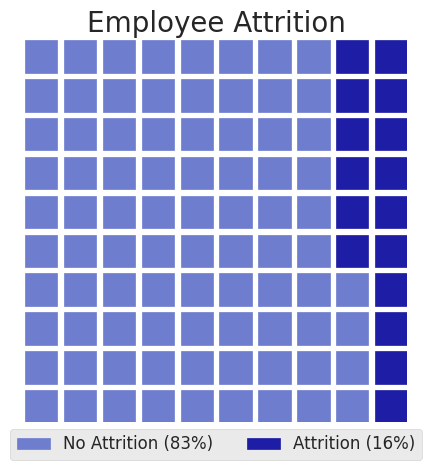

In [81]:
# dataframe to dictionary for displaying attrition in a waffle plot
wfl_attrition = df_attrition['Count'].to_dict()
wfl_attrition['No Attrition'] = wfl_attrition.pop(0)
wfl_attrition['Attrition'] = wfl_attrition.pop(1)

# Repartition for percentages
repartition = [f"{k} ({int(v / sum(wfl_attrition.values()) * 100)}%)" for k, v in wfl_attrition.items()]

# drawing the waffle plot
plt.figure(
  FigureClass=Waffle,
  rows=10,
  columns=10,
  values=wfl_attrition,
  colors = ['#6f7dce','#1d1da5'],
  icon_legend=True,
  title={'label': 'Employee Attrition', 'loc': 'center', 'fontdict': {'fontsize': 20}},
  labels = repartition,
  legend = {'loc': 'lower center',
            'bbox_to_anchor':(0.5,-0.12), # legend position
            'ncol': len(wfl_attrition),
            'fontsize': 12}
)

# saving and downloading the file
savefig('waffle_attrition.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("waffle_attrition.png")

plt.show()

## Dataset Description
The dataset contains 35 variables and 1470 entries.

Key takeaways from initial inspection:

* The Target is highly imbalanced, with only about 16% of the data reflecting attrition cases.
*   There are no missing values.
*   Categorical features are currently stored as objects (strings).
*   Numerical features vary greatly in their magnitude.
*   A few uninformative variables can be removed.



### Data Wrangling Tasks

*   Remove: EmployeeNumber (unrelevant), EmployeeCount (always equals 1), Over18 (always equals one), StandardHours (always equals 80)
*   Reformat categorical features appropriately (binary, one-hot encoding, etc...)
* Investigate distribution of numerical features.







## Working with Imbalanced Data

Class imbalance occurs when one class (majority) has significantly more samples than another (minority) in a dataset, leading to biased models that favour the majority class. This is especially problematic when the class of interest is the (less common) minority class. In our case, only roughly 16% of cases in the dataset are attrition cases, making employee attrition the minority class of interest.

**Consequences of Imbalance:**

+ Poor Generalisation: Models trained on imbalanced data struggle to generalise well to unseen data, particularly when encountering instances of the minority class.
+ Misleading Accuracy: A high accuracy score can be deceptive, as the model might be simply predicting the majority class most of the time.
+ Bias towards Majority Class: Models are prone to overfitting to the majority class and failing to learn the distinctive patterns of the minority class.

Imbalanced data can significantly impact model performance, leading to misleading accuracy scores while failing to adequately classify the minority class. This highlights the need for alternative evaluation metrics and techniques specifically designed to address class imbalance.

**Techniques for Handling Imbalance:**

+ Oversampling: Increasing the representation of the minority class by duplicating minority class instances. Potential drawback: Can introduce noise and lead to overfitting. (Used in the present project and further outlined below.)
+ Undersampling: Decreasing the representation of the majority class by removing instances from the majority class. Potential drawback: Loss of information, especially in smaller datasets. (As the present dataset only contains 1470 datapoints, undersampling was not considered.)
+ Utilising algorithms inherently robust to imbalance, such as Random Forest, or Gradient Boosting.
+ Threshold Adjustment: Improve and adjust the balance between recall and precision in adherence with project goals.
+ Using appropriate evaluation metrics:
  + Confusion Matrix: breaking down correct and incorrect predictions for both classes
  + Precision: Proportion of correctly identified cases of model prediction for one class
  + Recall: Proportion of correctly identfied cases of all actuall cases of one class
  + AUC-ROC: Measures the model's ability to distinguish between classes across thresholds, making it robust to imbalances.
  + F2 Score: Prioritizes recall over precision, thereby emphazising reduction of false negatives.

# Data Wrangling

+ Obtain an initial overview of target and feature distributions.
+ Investigate encoding for categorical and scaling for numerical features if there are large differences in magnitudes.

In [82]:
# removing uninformative variables
from os import remove

remove_cols = ['EmployeeNumber', 'EmployeeCount', 'Over18', 'StandardHours']
df.drop(remove_cols, axis=1, inplace=True)

## Wrangling Categorical Features
Decide whether to use binary or one-hot encoding for categorical variables.
+ Binary Encoding: Apply to binary categoricals, like Attrition (no|yes).
+ One-Hot Encoding: Apply to multi-class variables, like BusinessTravel (none, rarely, or frequently).

Variables to be inspected: Attrition, BusinessTravel, Department, EducationField, Gender, JobRole, MaritalStatus and OverTime.

### Business Travel

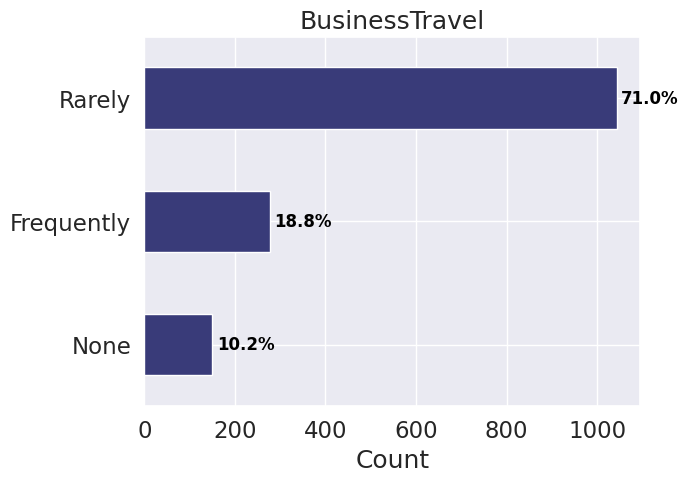

In [83]:
# set general theme for graphs
sns.set_theme(palette= 'tab20b', font_scale=1.5)

# inspect business travel
business_travel_counts = df.groupby('BusinessTravel').size().sort_values(ascending=True)
total_count = business_travel_counts.sum()
percentages = (business_travel_counts / total_count) * 100

ax = business_travel_counts.plot(kind='barh')
plt.title('BusinessTravel')
plt.ylabel(None)
plt.xlabel('Count')
current_yticks = plt.gca().get_yticks()
plt.yticks(current_yticks,  labels = ['None', 'Frequently', 'Rarely'])

# Add percentage labels above bars
for i, v in enumerate(business_travel_counts):
    ax.text(v+10,  # Adjust position
            i,  # y-coordinate for the text
            f'{percentages[i]:.1f}%',  # Format percentage with 1 decimal place
            ha='left', va='center', # Horizontal and vertical alignment
            color = 'black', fontsize = 12, fontweight = 'bold') # text style

# saving and downloading the file
savefig('bar_Btravel.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("bar_Btravel.png")

plt.show()

### Department

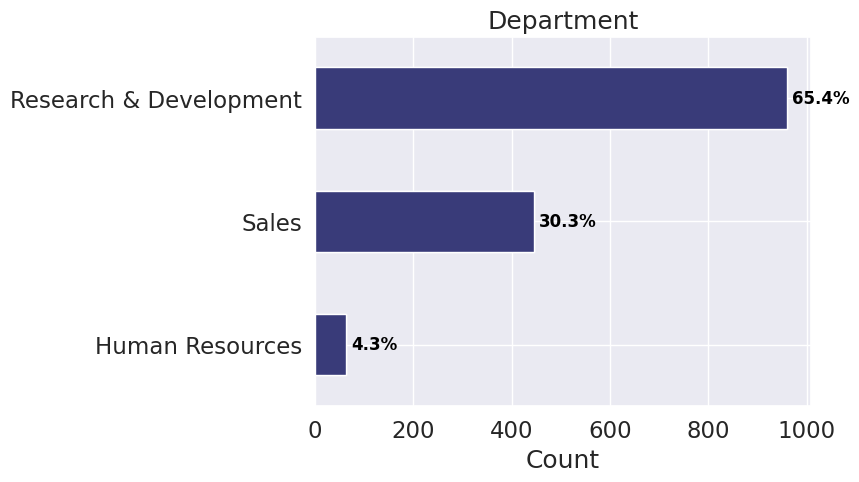

In [84]:
# inspect Department
# Calculate the sizes and sort
department_counts = df.groupby('Department').size().sort_values(ascending=True)
total_count = department_counts.sum()
percentages = (department_counts / total_count) * 100

ax = department_counts.plot(kind='barh')

# Create the bar plot
department_counts.plot(kind='barh')
plt.title('Department')
plt.ylabel(None)
plt.xlabel('Count')

# Add percentage labels above bars
for i, v in enumerate(department_counts):
    ax.text(v+10,  # Adjust position
            i,  # y-coordinate for the text
            f'{percentages[i]:.1f}%',  # Format percentage with 1 decimal place
            ha='left', va='center', # Horizontal and vertical alignment
            color = 'black', fontsize = 12, fontweight = 'bold') # text style

# saving and downloading the file
savefig('bar_Department.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("bar_Department.png")

plt.show()

### Education Field

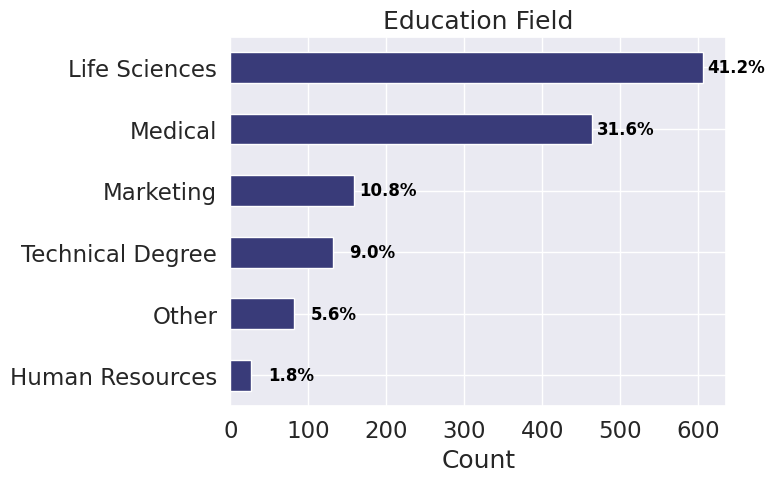

In [85]:
# inspect EducationField
# Calculate the sizes and sort
education_field_counts = df.groupby('EducationField').size().sort_values(ascending=True)
total_count = education_field_counts.sum()
percentages = (education_field_counts / total_count) * 100

# Create the bar plot
ax = education_field_counts.plot(kind='barh')
plt.title('Education Field')
plt.ylabel(None)
plt.xlabel('Count')

# Add percentage labels above bars
for i, v in enumerate(education_field_counts):
    ax.text(v+80,  # Adjust position
            i,  # y-coordinate for the text
            f'{percentages[i]:.1f}%',  # Format percentage with 1 decimal place
            ha='right', va='center', # Horizontal and vertical alignment
            color = 'black', fontsize = 12, fontweight = 'bold') # text style

# saving and downloading the file
savefig('bar_Edu.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("bar_Edu.png")

plt.show()

### Gender

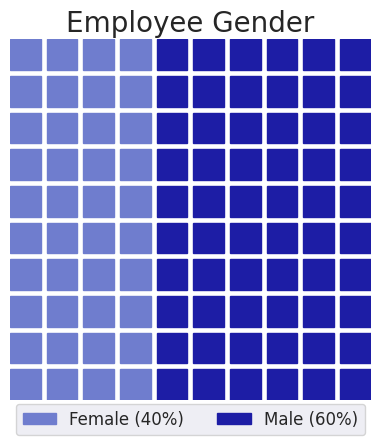

In [86]:
# Group by Gender and get the size of each group
df_gender = df.groupby('Gender').size().reset_index(name='Count')

# display the results in a waffle plot
wfl_gender = df_gender['Count'].to_dict()
wfl_gender['Female'] = wfl_gender.pop(0)
wfl_gender['Male'] = wfl_gender.pop(1)

# Repartition for percentages
repartition = [f"{k} ({int(v / sum(wfl_gender.values()) * 100)}%)" for k, v in wfl_gender.items()]

# drawing the waffle plot
plt.figure(
  FigureClass=Waffle,
  rows=10,
  columns=10,
  values=wfl_gender,
  colors = ['#6f7dce','#1d1da5'],
  icon_legend=True,
  title={'label': 'Employee Gender', 'loc': 'center', 'fontdict': {'fontsize': 20}},
  labels = repartition,
  legend = {'loc': 'lower center',
            'bbox_to_anchor':(0.5,-0.12), # legend position
            'ncol': len(wfl_gender),
            'fontsize': 12}
)

# saving and downloading the file
savefig('waffle_gender.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("waffle_gender.png")

plt.show()

### Job Role

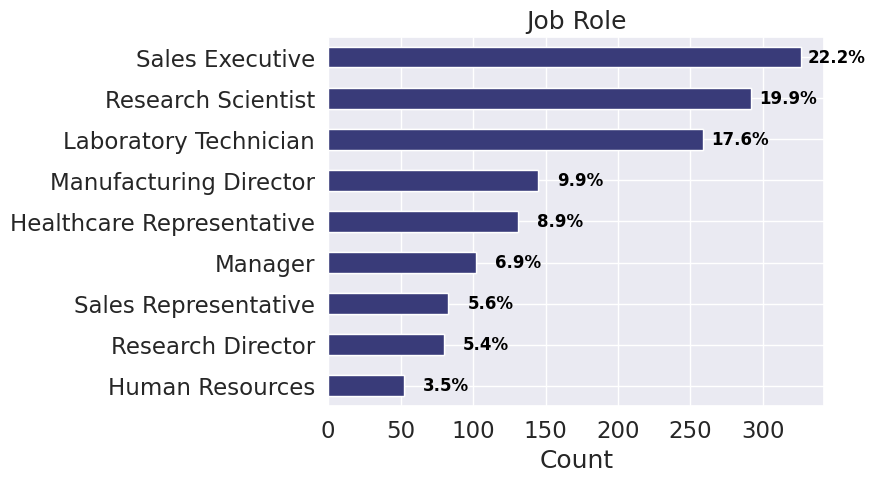

In [87]:
# inspect JobRole
# Calculate the sizes and sort
JobRole_counts = df.groupby('JobRole').size().sort_values(ascending=True)
total_count = JobRole_counts.sum()
percentages = (JobRole_counts / total_count) * 100

# Create the bar plot
ax = JobRole_counts.plot(kind='barh')
JobRole_counts.plot(kind='barh')
plt.title('Job Role')
plt.ylabel(None)
plt.xlabel('Count')

# Add percentage labels above bars
for i, v in enumerate(JobRole_counts):
    ax.text(v+45,  # Adjust position
            i,  # y-coordinate for the text
            f'{percentages[i]:.1f}%',  # Format percentage with 1 decimal place
            ha='right', va='center', # Horizontal and vertical alignment
            color = 'black', fontsize = 12, fontweight = 'bold') # text style

# saving and downloading the file
savefig('bar_Role.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("bar_Role.png")

plt.show()

### Marital Status

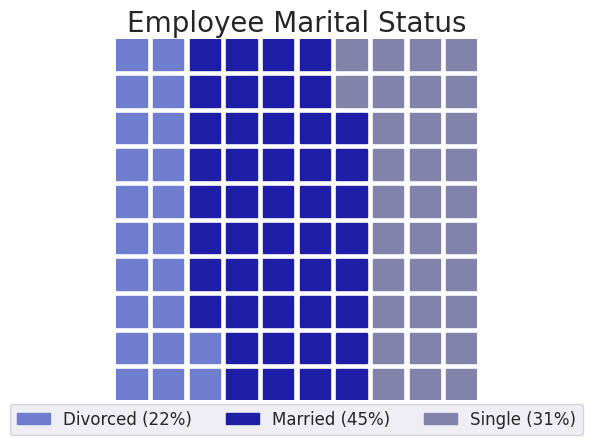

In [88]:
# Group by MaritalStatus and get the size of each group
df_MaritalStatus = df.groupby('MaritalStatus').size().reset_index(name='Count')

# display the results in a waffle plot
wfl_martial = df_MaritalStatus['Count'].to_dict()
wfl_martial['Divorced'] = wfl_martial.pop(0)
wfl_martial['Married'] = wfl_martial.pop(1)
wfl_martial['Single'] = wfl_martial.pop(2)

# Repartition for percentages
repartition = [f"{k} ({int(v / sum(wfl_martial.values()) * 100)}%)" for k, v in wfl_martial.items()]

# drawing the waffle plot
plt.figure(
  FigureClass=Waffle,
  rows=10,
  columns=10,
  values=wfl_martial,
  colors = ['#6f7dce','#1d1da5', '#8283aa'],
  icon_legend=True,
  title={'label': 'Employee Marital Status', 'loc': 'center', 'fontdict': {'fontsize': 20}},
  labels = repartition,
  legend = {'loc': 'lower center',
            'bbox_to_anchor':(0.5,-0.12), # legend position
            'ncol': len(wfl_martial),
            'fontsize': 12}
)

# saving and downloading the file
savefig('waffle_marital.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("waffle_marital.png")

plt.show()

### Working Overtime

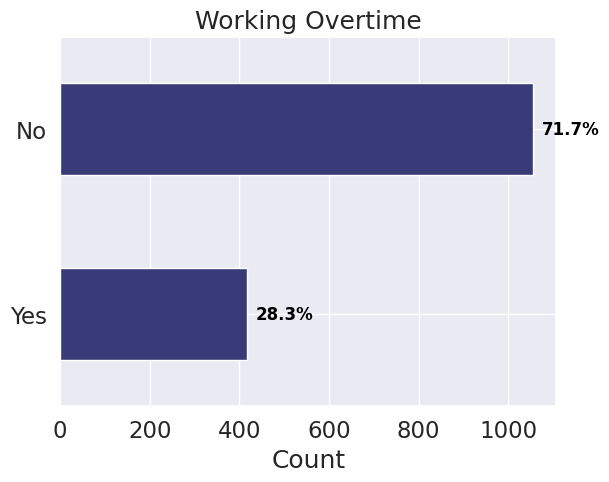

In [89]:
# inspect OverTime
# Calculate the sizes and sort
OverTime_counts = df.groupby('OverTime').size().sort_values(ascending=True)
total_count = OverTime_counts.sum()
percentages = (OverTime_counts / total_count) * 100

# Create the bar plot
ax = OverTime_counts.plot(kind='barh')
plt.title('Working Overtime')
plt.ylabel(None)
plt.xlabel('Count')

# Add percentage labels above bars
for i, v in enumerate(OverTime_counts):
    ax.text(v+150,  # Adjust position
            i,  # y-coordinate for the text
            f'{percentages[i]:.1f}%',  # Format percentage with 1 decimal place
            ha='right', va='center', # Horizontal and vertical alignment
            color = 'black', fontsize = 12, fontweight = 'bold') # text style


# saving and downloading the file
savefig('bar_overtime.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("bar_overtime.png")

plt.show()

### Summary: Inspection of Categorical Features

*   Attrition, Gender and OverTime can be binary coded.
*   BusinessTravel, Department, EducationFiled and JobRole can be reformatted with one-hot encoding.


In [90]:
# binary code Attrition [0 = no | 1 = yes], Gender [0 = female | male] and OverTime [0 = no | 1 = yes]
df['AttritionNum'] = np.where(df['Attrition'] == 'Yes', 1, 0)
df['GenderNum'] = np.where(df['Gender'] == 'Male', 1, 0)
df['OverTimeNum'] = np.where(df['OverTime'] == 'Yes', 1, 0)

In [91]:
# one-hot encode BusinessTravel, Department, EducationFiled and JobRole
business_travel_dummies = pd.get_dummies(df['BusinessTravel'], prefix='BusinessTravel')
department_dummies = pd.get_dummies(df['Department'], prefix='Department')
education_field_dummies = pd.get_dummies(df['EducationField'], prefix='EducationField')
job_role_dummies = pd.get_dummies(df['JobRole'], prefix='JobRole')
maritalStatus_dummies = pd.get_dummies(df['MaritalStatus'], prefix='MaritalStatus')

# Concatenate the dummy DataFrames with the original DataFrame
df = pd.concat([df, business_travel_dummies, department_dummies, education_field_dummies, job_role_dummies, maritalStatus_dummies], axis=1)

## Wrangling Numerical Features
Decide if numerical features can be binned meaninfully (in case of non-linear relationship whith the target) or be kept as ordinal categorical (e.g. JobSatisfaction).

### Features to be Inspected:

Potential Candidates for Binning:
+ Age (in HR context based in career seniority)
+ PercentSalaryHike
+ StockOptionLevel

Investigate Relationship of Rate and Income:
+ DailyRate
+ HourlyRate
+ MonthlyIncome
+ MonthlyRate  

Ensure These are Ordinal Categorical:
+ Education
+ EnvironmentSatisfaction
+ JobInvolvement
+ JobLevel
+ JobSatisfaction
+ NumCompaniesWorked
+ PerformanceRating
+ TotalWorkingYears
+ TrainingTimesLastYear
+ WorkLifeBalance
+ YearsAtCompany
+ YearsInCurrentRole
+ YearsSinceLastPromotion
+ YearsWithCurrManager

### Candidates for Binning
+ Age (in HR context based in career seniority)
+ PercentSalaryHike
+ StockOptionLevel

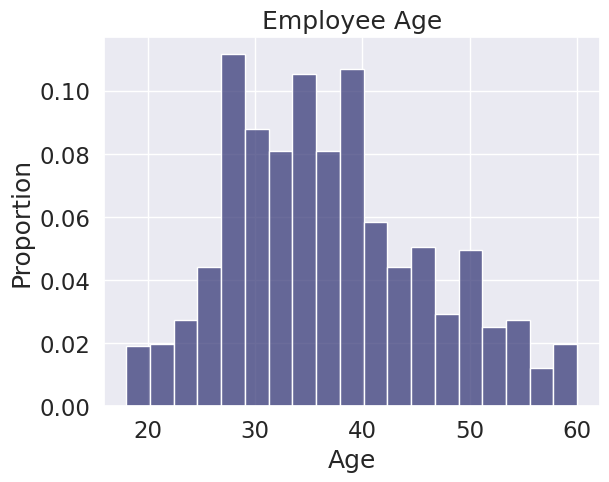

In [92]:
# inspect age distribtution

sns.histplot(x='Age', data=df, stat='proportion')
plt.xlabel('Age')
plt.ylabel('Proportion')
plt.title('Employee Age')

# saving and downloading the file
savefig('hist_age.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("hist_age.png")

plt.show()

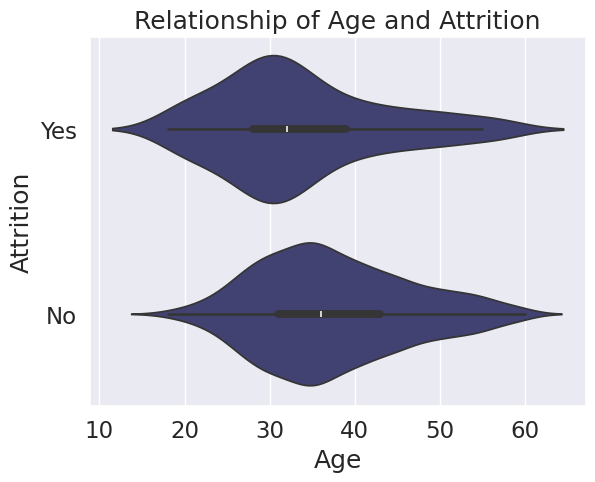

In [93]:
# show relationship of age with attrition
sns.violinplot(x='Age', y='Attrition', data=df)
plt.title('Relationship of Age and Attrition')
plt.show()

In [94]:
# use custom bins for age
#<25: Early Career
#25-45: Mid-Career
#45-65: Senior Career

# Define custom age bins and labels
bins = [0, 25, 45, 65]
labels = ['Early Career', 'Mid-Career', 'Senior Career']

# Create a new column 'CareerStages' with the categorized age groups
df['CareerStages'] = pd.cut(df['Age'], bins=bins, labels=labels, include_lowest=True)

# one-hot encode CareerStages
age_group_dummies = pd.get_dummies(df['CareerStages'], prefix='CareerStages')

# Concatenate the dummy DataFrames with the original DataFrame
df = pd.concat([df, age_group_dummies], axis=1)

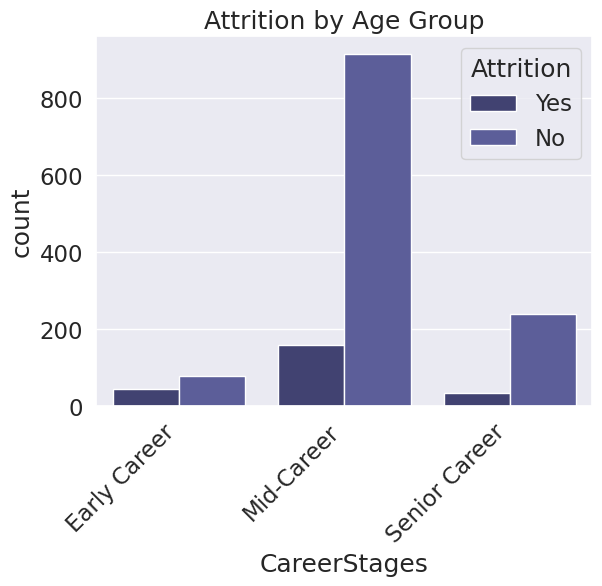

In [95]:
# show relationship of CareerStages with attrition
sns.countplot(x='CareerStages', hue='Attrition', data=df)
plt.title('Attrition by Age Group')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.show()

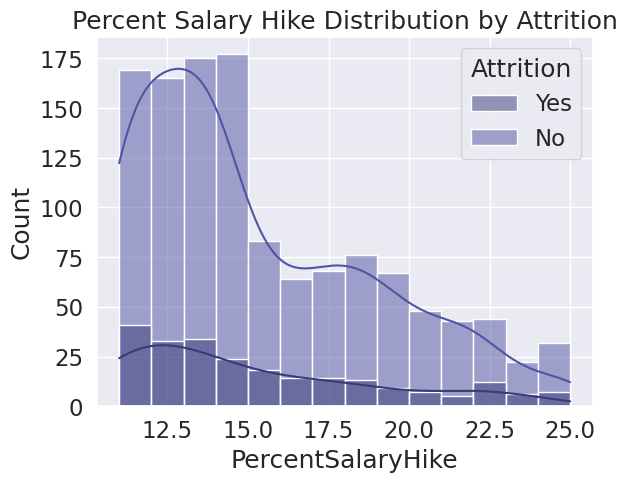

In [96]:
# visualize the relationship between PercentSalaryHike and Attrition
sns.histplot(x='PercentSalaryHike', hue='Attrition', data=df, kde=True)
plt.title('Percent Salary Hike Distribution by Attrition')
plt.show()

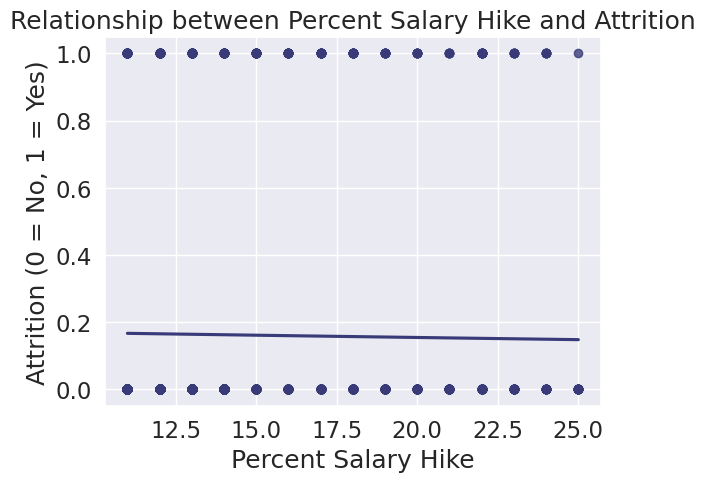

In [97]:
sns.regplot(x='PercentSalaryHike', y='AttritionNum', data=df, logistic=True, ci=None)
plt.title('Relationship between Percent Salary Hike and Attrition')
plt.xlabel('Percent Salary Hike')
plt.ylabel('Attrition (0 = No, 1 = Yes)')
plt.show()

Text(0.5, 1.0, 'Stock Option Level Distribution')

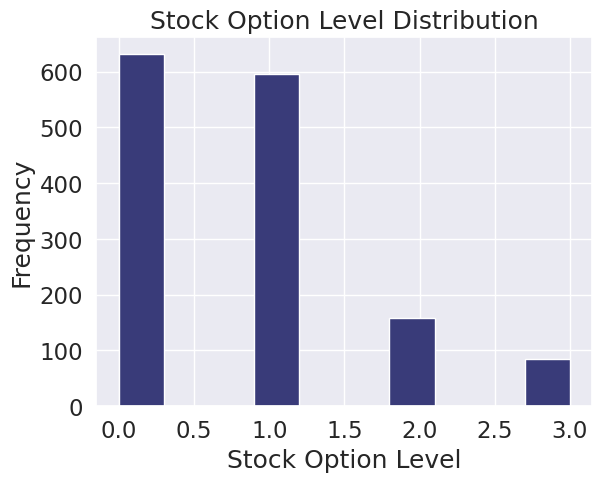

In [98]:
# visualize StockOptionLevel

plt.hist(df['StockOptionLevel'])
plt.xlabel('Stock Option Level')
plt.ylabel('Frequency')
plt.title('Stock Option Level Distribution')

Text(0.5, 1.0, 'Relationship between Stock Option Level and Attrition')

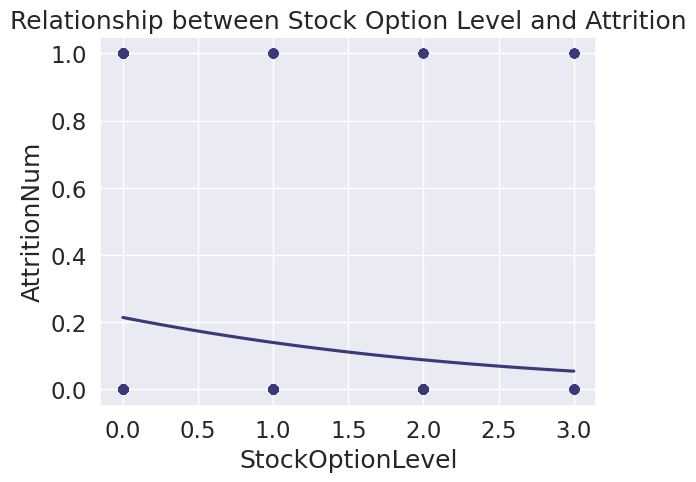

In [99]:
# visualize the relationship between StockOptionLevel and Attrition

sns.regplot(x='StockOptionLevel', y='AttritionNum', data=df, logistic=True, ci=None)
plt.title('Relationship between Stock Option Level and Attrition')

### Rates and Income

+ DailyRate
+ HourlyRate
+ MonthlyIncome
+ MonthlyRate


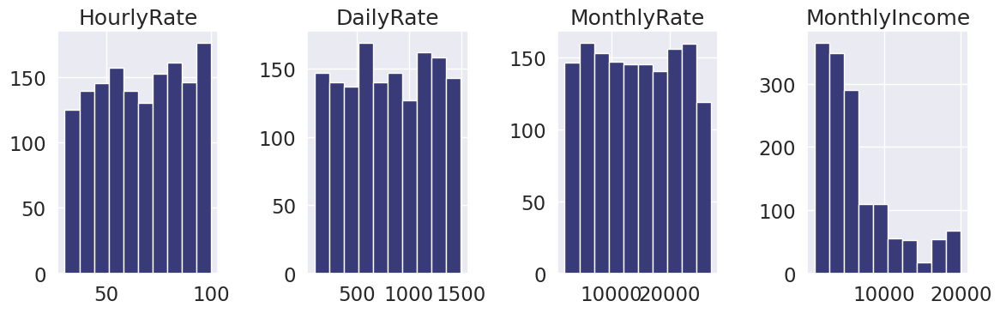

In [100]:
# Create a figure with 3 subplots arranged horizontally
fig, axes = plt.subplots(1, 4, figsize=(12, 4))

# Plot the histograms on each subplot
axes[0].hist(df['HourlyRate'])
axes[0].set_title('HourlyRate')
axes[1].hist(df['DailyRate'])
axes[1].set_title('DailyRate')
axes[2].hist(df['MonthlyRate'])
axes[2].set_title('MonthlyRate')
axes[3].hist(df['MonthlyIncome'])
axes[3].set_title('MonthlyIncome')


# Adjust spacing and display the plot
plt.tight_layout()
plt.show()

In [101]:
# drop rates
remove_cols = ['HourlyRate', 'DailyRate', 'MonthlyRate']
df.drop(remove_cols, axis=1, inplace=True)

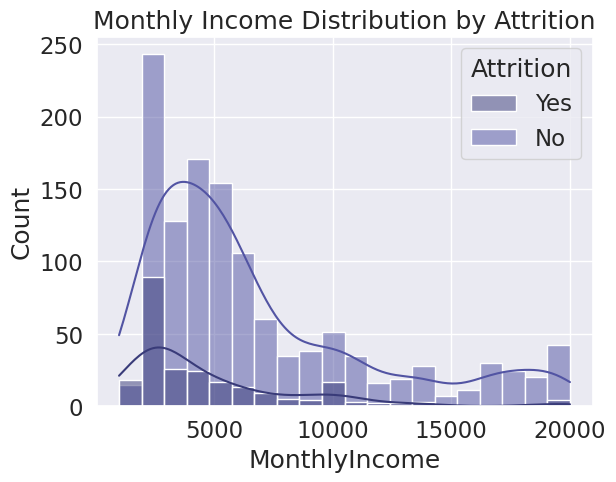

In [102]:
# focus on MonthlyIncome
sns.histplot(x='MonthlyIncome', hue='Attrition', data=df, kde=True)
plt.title('Monthly Income Distribution by Attrition')
plt.show()

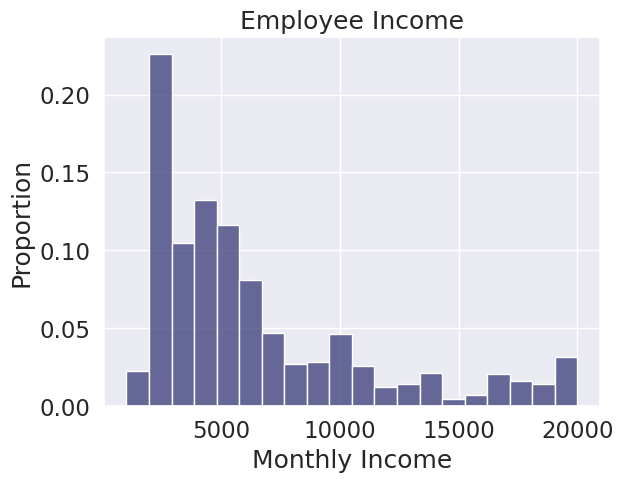

In [103]:
# focus on MonthlyIncome
sns.histplot(x='MonthlyIncome', data=df, stat='proportion')
plt.xlabel('Monthly Income')
plt.title('Employee Income')
plt.ylabel('Proportion')

# saving and downloading the file
savefig('hist_income.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("hist_income.png")

plt.show()

### Cadidates for Standardization

+ DistanceFromHome
+ YearsAtCompany
+ YearsInCurrentRole
+ YearsSinceLastPromotion
+ YearsWithCurrManager
+ TotalWorkingYears
+ TrainingTimesLastYear
+ NumCompaniesWorked

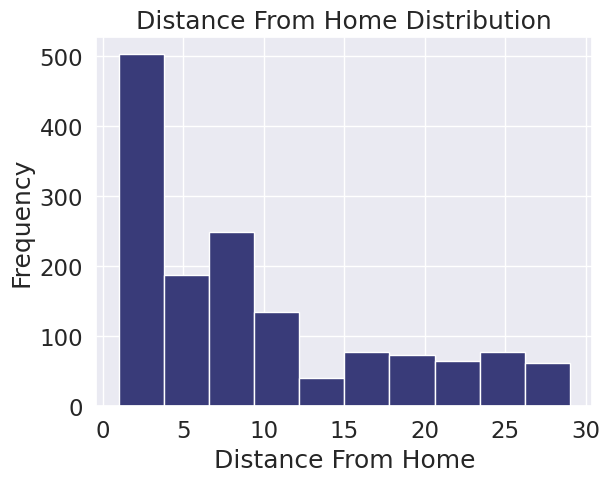

In [104]:
# visualize DistanceFromHome
plt.hist(df['DistanceFromHome'])
plt.xlabel('Distance From Home')
plt.ylabel('Frequency')
plt.title('Distance From Home Distribution')
plt.show()

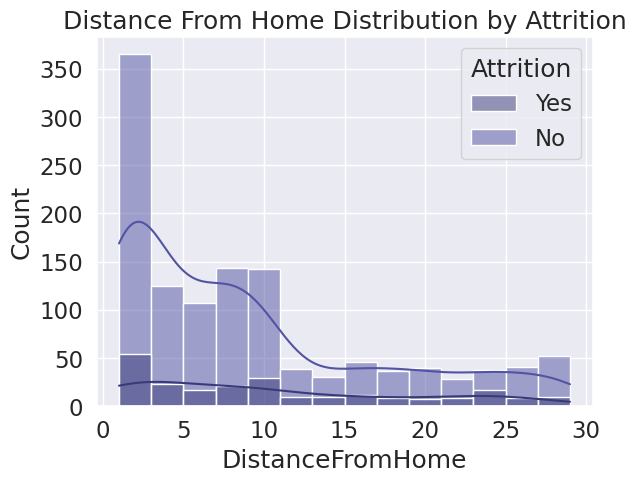

In [105]:
sns.histplot(x='DistanceFromHome', hue='Attrition', data=df, kde=True)
plt.title('Distance From Home Distribution by Attrition')
plt.show()

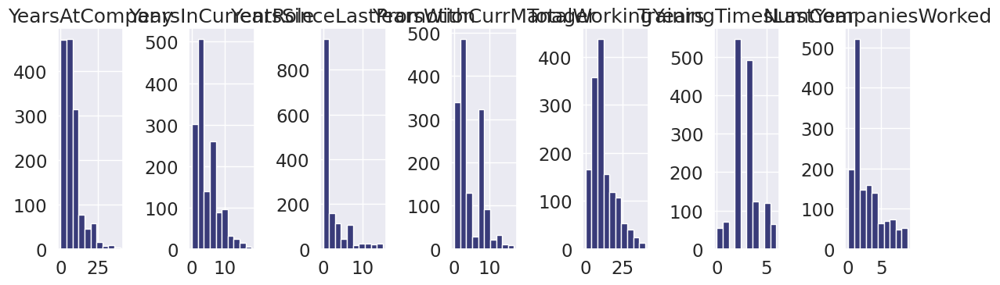

In [106]:
# Create a figure with 3 subplots arranged horizontally
fig, axes = plt.subplots(1, 7, figsize=(12, 4))

# Plot the histograms on each subplot
axes[0].hist(df['YearsAtCompany'])
axes[0].set_title('YearsAtCompany')
axes[1].hist(df['YearsInCurrentRole'])
axes[1].set_title('YearsInCurrentRole')
axes[2].hist(df['YearsSinceLastPromotion'])
axes[2].set_title('YearsSinceLastPromotion')
axes[3].hist(df['YearsWithCurrManager'])
axes[3].set_title('YearsWithCurrManager')
axes[4].hist(df['TotalWorkingYears'])
axes[4].set_title('TotalWorkingYears')
axes[5].hist(df['TrainingTimesLastYear'])
axes[5].set_title('TrainingTimesLastYear')
axes[6].hist(df['NumCompaniesWorked'])
axes[6].set_title('NumCompaniesWorked')

# Adjust spacing and display the plot
plt.tight_layout()
plt.show()

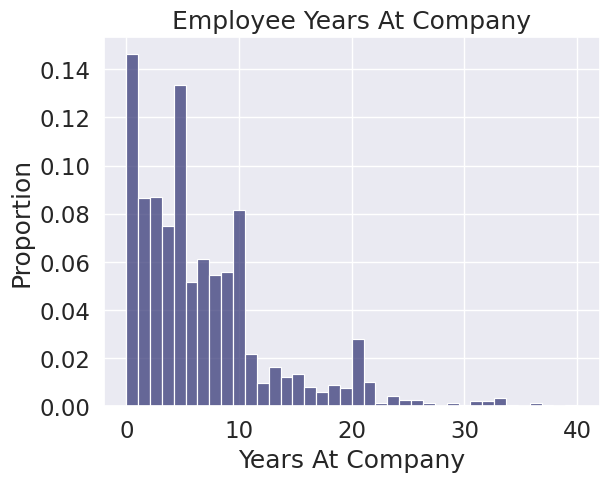

In [107]:
# inspect Years at company (for later visualization)
sns.histplot(x='YearsAtCompany', data=df, stat='proportion')
plt.xlabel('Years At Company')
plt.title('Employee Years At Company')
plt.ylabel('Proportion')

# saving and downloading the file
savefig('hist_years.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("hist_years.png")

plt.show()

In [108]:
# Generate table data of years at company for later visualization
# Specify desired years as bins
# Specify desired years as bins
bins = [5, 10, 20, 30, 40]  # Example bins

# Get histogram with raw counts (density=False is the default)
hist, bins = np.histogram(df['YearsAtCompany'], bins=bins)

# Calculate percentages
percentages = (hist / hist.sum()) * 100

# Create a DataFrame for the table (use hist directly for counts)
df_counts = pd.DataFrame({'YearsAtCompany Range': bins[:-1],
                         'Count': hist,
                         'Percentage': percentages})

# Display the table
print(df_counts)

   YearsAtCompany Range  Count  Percentage
0                     5    524   58.876404
1                    10    273   30.674157
2                    20     76    8.539326
3                    30     17    1.910112


### Ordinal Categorical Features

+ Education
+ EnvironmentSatisfaction
+ RelationshipSatisfaction
+ JobInvolvement
+ JobLevel
+ JobSatisfaction
+ PerformanceRating
+ WorkLifeBalance

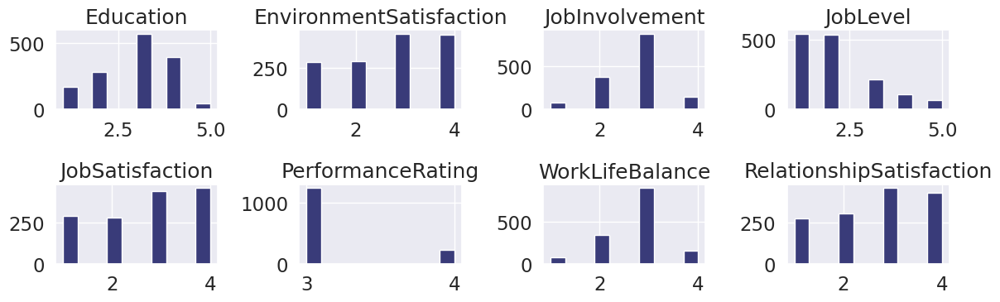

In [109]:
# Create a figure with 3 subplots arranged horizontally
fig, axes = plt.subplots(2, 4, figsize=(12, 4))

# Plot the histograms on each subplot
axes[0,0].hist(df['Education'])
axes[0,0].set_title('Education')
axes[0,1].hist(df['EnvironmentSatisfaction'])
axes[0,1].set_title('EnvironmentSatisfaction')
axes[0,2].hist(df['JobInvolvement'])
axes[0,2].set_title('JobInvolvement')
axes[0,3].hist(df['JobLevel'])
axes[0,3].set_title('JobLevel')
axes[1,0].hist(df['JobSatisfaction'])
axes[1,0].set_title('JobSatisfaction')
axes[1,1].hist(df['PerformanceRating'])
axes[1,1].set_title('PerformanceRating')
axes[1,2].hist(df['WorkLifeBalance'])
axes[1,2].set_title('WorkLifeBalance')
axes[1,3].hist(df['RelationshipSatisfaction'])
axes[1,3].set_title('RelationshipSatisfaction')

# Adjust spacing and display the plot
plt.tight_layout()
plt.show()

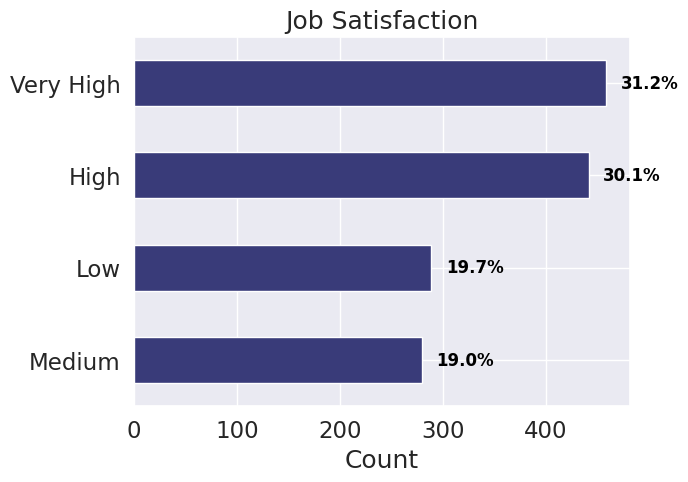

In [110]:
# inspect Job Satisfaction (for later visualization)
# Calculate the sizes and sort
Satisfaction_counts = df.groupby('JobSatisfaction').size().sort_values(ascending=True)
total_count = Satisfaction_counts.sum()
percentages = (Satisfaction_counts / total_count) * 100

# Create the bar plot
ax = Satisfaction_counts.plot(kind='barh')
plt.title('Job Satisfaction')
plt.ylabel(None)
plt.xlabel('Count')
current_yticks = plt.gca().get_yticks()
plt.yticks(current_yticks,  labels = ['Medium', 'Low', 'High', 'Very High'])

# Add percentage labels above bars
for index, value in enumerate(Satisfaction_counts.index):
    ax.text(Satisfaction_counts[value]+70,  # Adjust position
            index,  # y-coordinate for the text
            f'{percentages[value]:.1f}%',  # Format percentage with 1 decimal place
            ha='right', va='center', # Horizontal and vertical alignment
            color = 'black', fontsize = 12, fontweight = 'bold') # text style


# saving and downloading the file
savefig('bar_satis.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("bar_satis.png")

plt.show()

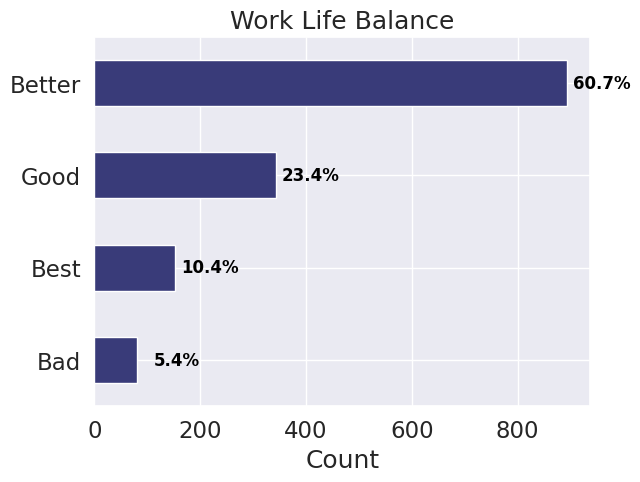

In [111]:
# inspect Work Life Balance (for later visualization)
# Calculate the sizes and sort
balance_counts = df.groupby('WorkLifeBalance').size().sort_values(ascending=True)
total_count = balance_counts.sum()
percentages = (balance_counts / total_count) * 100

# Create the bar plot
ax = balance_counts.plot(kind='barh')
plt.title('Work Life Balance')
plt.ylabel(None)
plt.xlabel('Count')
current_yticks = plt.gca().get_yticks()
plt.yticks(current_yticks,  labels = ['Bad', 'Best', 'Good', 'Better'])

# Add percentage labels above bars
for index, value in enumerate(balance_counts.index):
    ax.text(balance_counts[value]+120,  # Adjust position
            index,  # y-coordinate for the text
            f'{percentages[value]:.1f}%',  # Format percentage with 1 decimal place
            ha='right', va='center', # Horizontal and vertical alignment
            color = 'black', fontsize = 12, fontweight = 'bold') # text style


# saving and downloading the file
savefig('bar_balance.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("bar_balance.png")

plt.show()

### Summary: Inspection of Numerical Variables

+ Bin Age for high interpretability of the results (early, mid and senior career). (*Note: Later decided to keep age as is for more predictive power. Binned age is still valuable for visualization.*)
+ PercentSalaryHike will be kept as is, the relationship appears to be linear and the range of the features is not exorbitant.
+ StockOptionLevel is ordinal categorical and will be therefore kept as is.
+ Drop HourlyRate, DailyRate and MonthlyRate as their meaning is unclear. As these features should highly correlate with monthly income anyways, this will not result in great information loss.
+ As ranges for numerical variables differ greatly, StandardScaler will be used to improve compatibility with machine learning algorithms.
+ Features with an inherent order will be treated as ordinal categorical variables, retaining their ranking while encoding them numerically.

# Exploratory Data Analysis

Investigate relationships of the target and features to further understand the dataset’s structure, identify patterns, and detect potential issues such as missing values or outliers.

Visualization will be used to uncover relationships between features and the target variable to guide feature engineering and model selection.

## Inspecting Categorical Features

In [112]:
# Select only categorical features
categorical_features = df.select_dtypes(include=['object','category'])

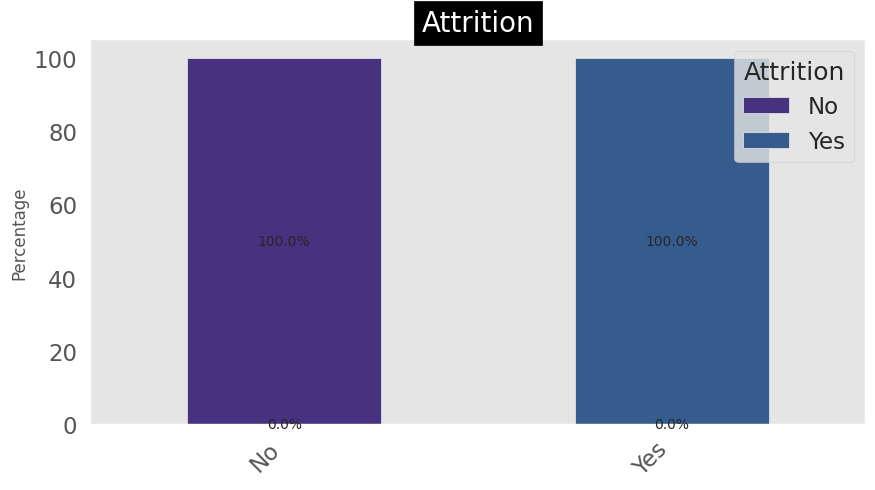

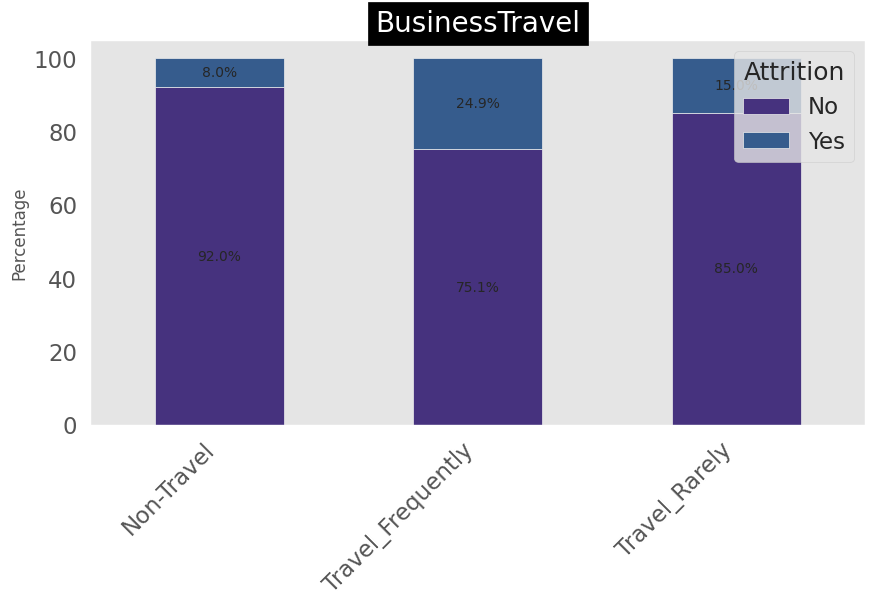

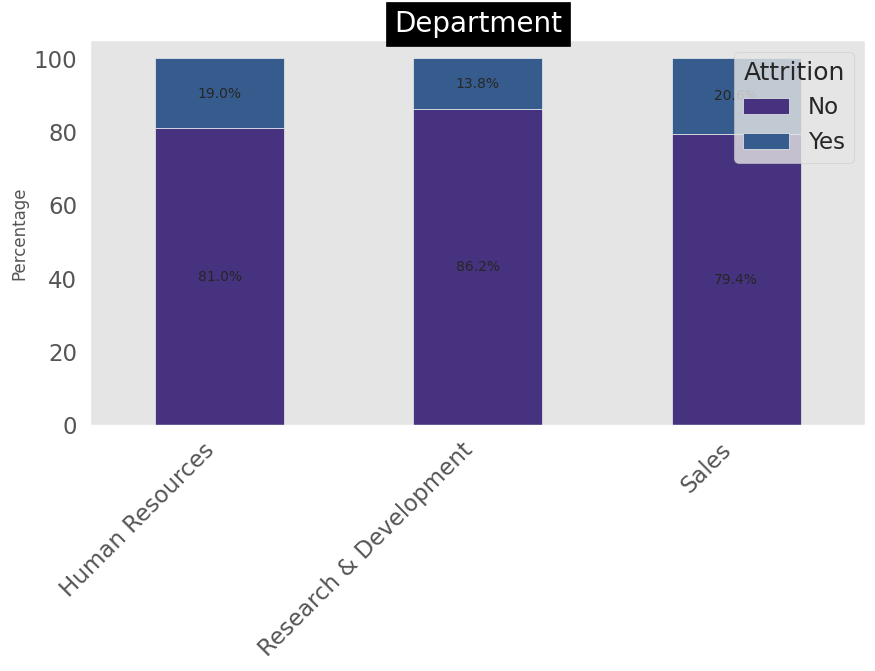

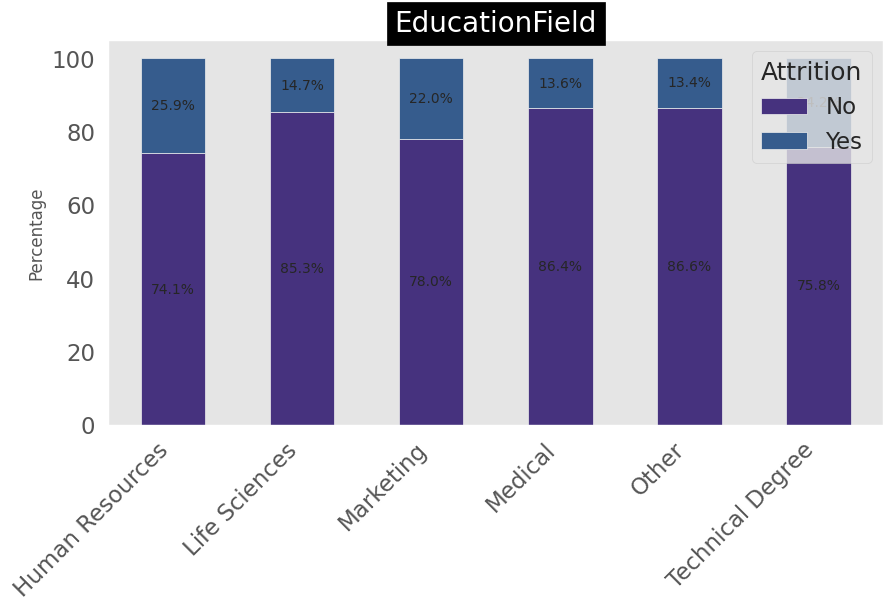

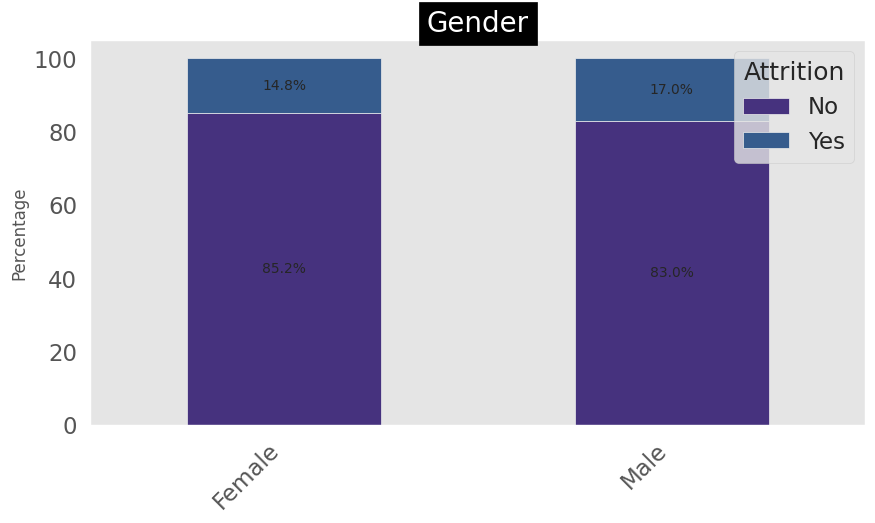

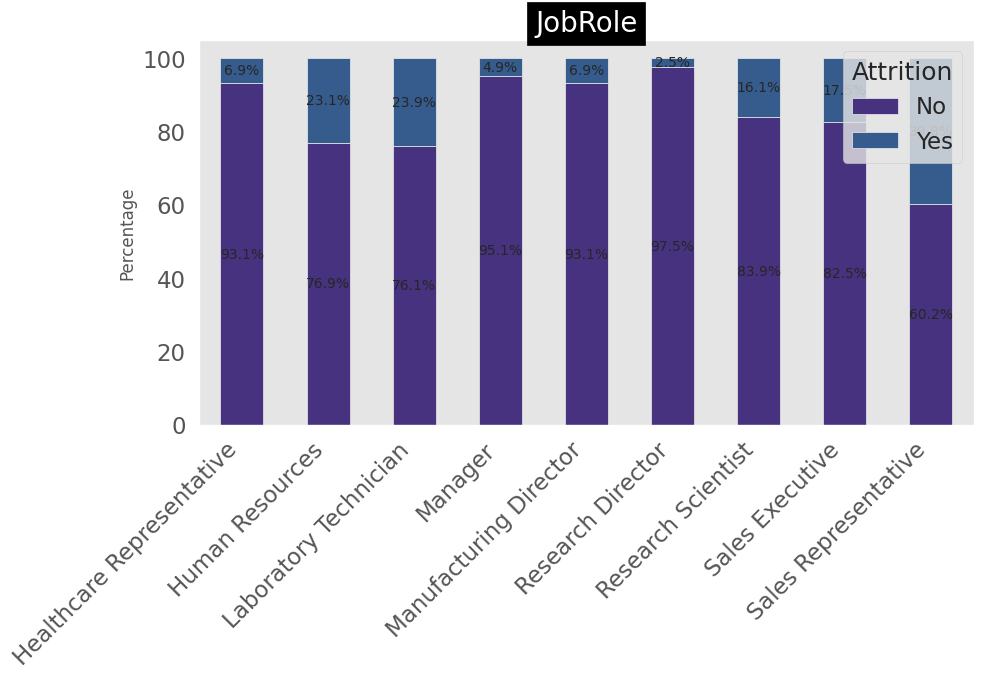

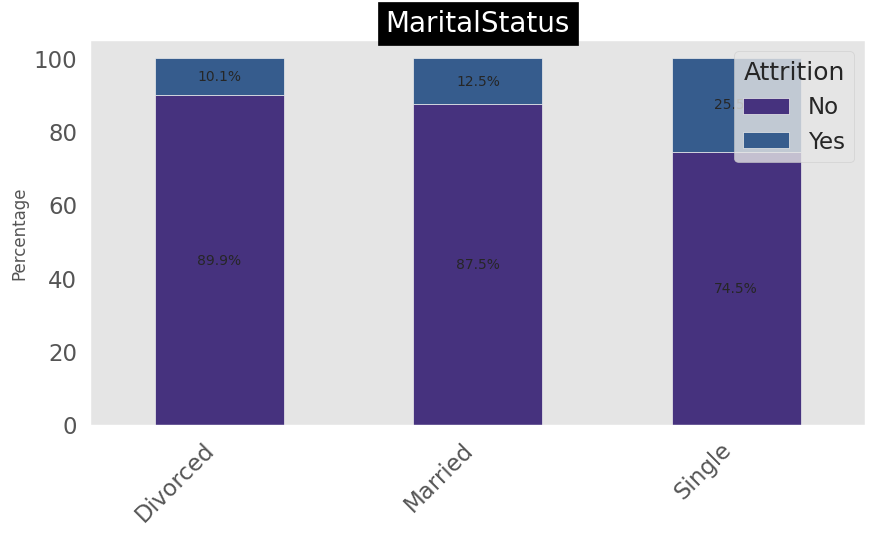

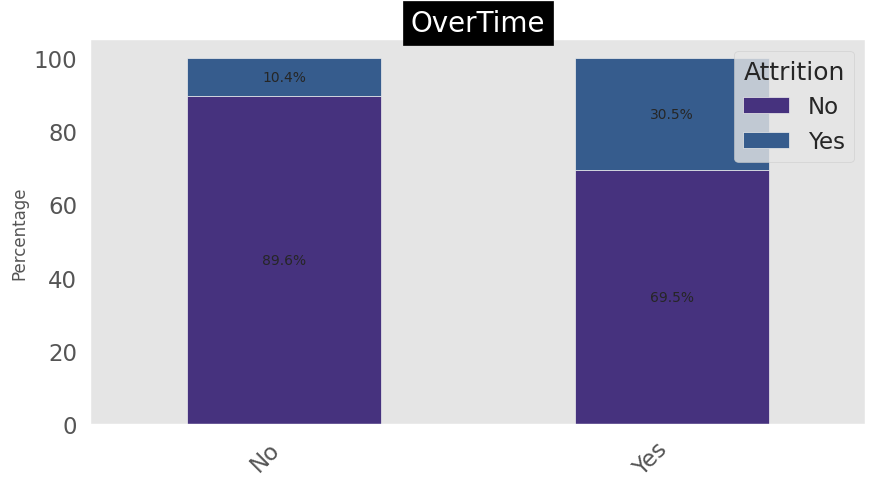

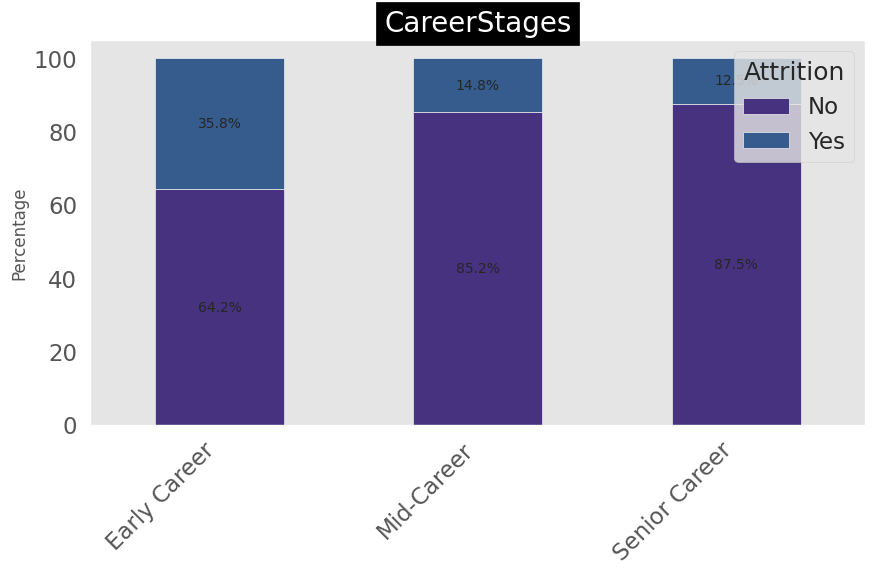

In [113]:
plt.style.use('ggplot')

for column in categorical_features:
    plt.figure(figsize=(10, 5))

    # Create a cross-tabulation to get counts for each category and attrition level
    cross_tab = pd.crosstab(df[column], df['Attrition'], normalize='index') * 100

    # Create a stacked bar plot using the cross-tabulation data
    ax = cross_tab.plot(kind='bar', stacked=True, ax=plt.gca(), color=sns.palettes.mpl_palette('viridis'))

    # Add percentage labels to the bars
    for p in ax.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy()
        ax.text(x + width / 2,
                y + height / 2,
                f'{height:.1f}%',
                ha='center', va='center', fontsize=10)

    plt.title(column, backgroundcolor='black', color='white', fontsize=20)
    plt.xticks(rotation=45, ha='right')
    plt.xlabel(None)
    plt.ylabel('Percentage')
    plt.grid()
    plt.legend(title='Attrition', loc='upper right')
    plt.show()

### Insights From Initial Inspection

+ Comparably **higher attrition for employees who travel frequently** for business compared to rarely or non-travel. **Employees who do not travel for bussiness show the lowest attrition rates.** Additional demographics like gender or marital status, or aspects of the employment (e.g. job role or salary) could be of interest.

+ **Attrition is highest in the Sales Department followed by Human Resources and Research & Development.** Further investigate JobRoles and overall Jobquality in these departments.

+ **Attrition differs by Education Field**, and is comparably higher for Human Resources, Marketing and Employees with a technical Degree. Investigate how this feature might correlate with Department.

+ **Attrition is higher for male** compared to female employees.

+ The jobroles **Sales Representative, Laboratory Technician and Human Resources display the highest attrition rates**. This is partly in line with the findings for Department and Education Field. How these features correlate/interact might be of interest.

+ **Attrition is highest for single employees** and lowest for divorced.

+ **A greater proportion of employees indicating to work overtime leave the company** compared to those who indicate to not work overtime.

+ **Attrition rates are higher for employees at the beginning of their career**, compared to both mid- and senior-career employees.

### Further analyses
+ BusinessTravel: Does it interact with demographic employee features?
+ Department, EducationField and JobRoles: Investigate their relationship with each other.
+ OverTime: Are some employees/specific roles more likely to leave when working overtime?
+ Do certain demographic features interact with each other?

### Business Travel & Demographics


In [114]:
df_treemap = df[['BusinessTravel', 'MaritalStatus', 'AttritionNum']].groupby(['BusinessTravel', 'MaritalStatus']).agg({'AttritionNum': ['count', 'sum']}).reset_index()
df_treemap.columns = ['BusinessTravel', 'MaritalStatus', 'total_count', 'attrition_count']

# Calculate percentage based on categorization
df_treemap['percentage'] = (df_treemap['attrition_count'] / df_treemap['total_count']) * 100

df_treemap.head(10)

# Create treemap
fig = px.treemap(df_treemap,
                 path=['BusinessTravel', 'MaritalStatus'],
                 values='total_count',  # Use total_count for box size
                 color='percentage',
                 hover_data={'percentage': True},
                 color_continuous_scale='RdBu',
                 color_continuous_midpoint=df_treemap['percentage'].mean())

fig.update_traces(texttemplate='%{label}<br>Attrition: %{customdata[0]:.1f}%',
                  textfont_size=12,
                  textfont_color='black')

fig.update_layout(title_text='Attrition Percentage by Marital Status and Business Travel',
                  title_x=0.5,
                  margin=dict(t=50, l=25, r=25, b=25))

fig.show()

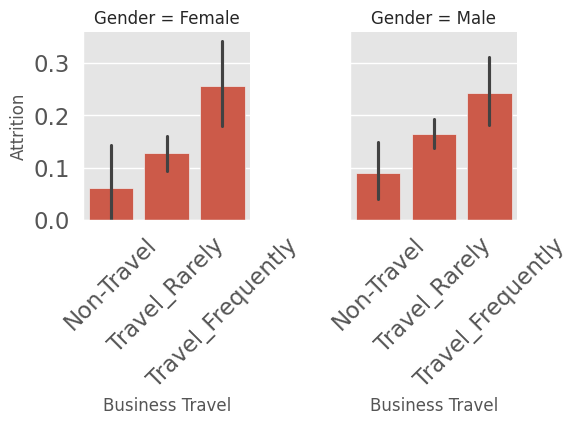

In [115]:
g = sns.FacetGrid(df, col='Gender')
g.map(sns.barplot, 'BusinessTravel', 'AttritionNum', order=["Non-Travel", "Travel_Rarely", "Travel_Frequently"])
g.set_xticklabels(rotation=45)
g.set_axis_labels("Business Travel", "Attrition")
plt.show()

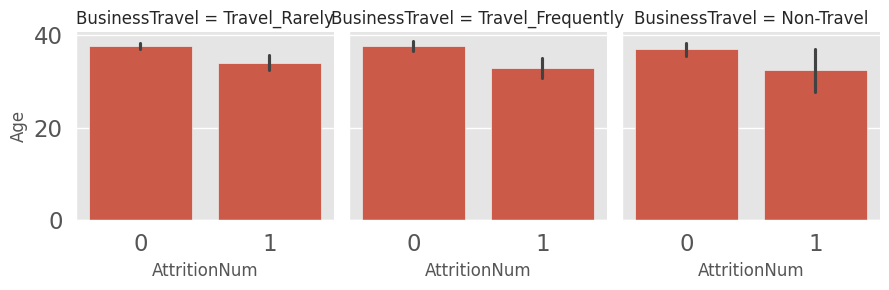

In [116]:
g = sns.FacetGrid(df, col = 'BusinessTravel')
g.map(sns.barplot, 'AttritionNum', 'Age')

plt.show()

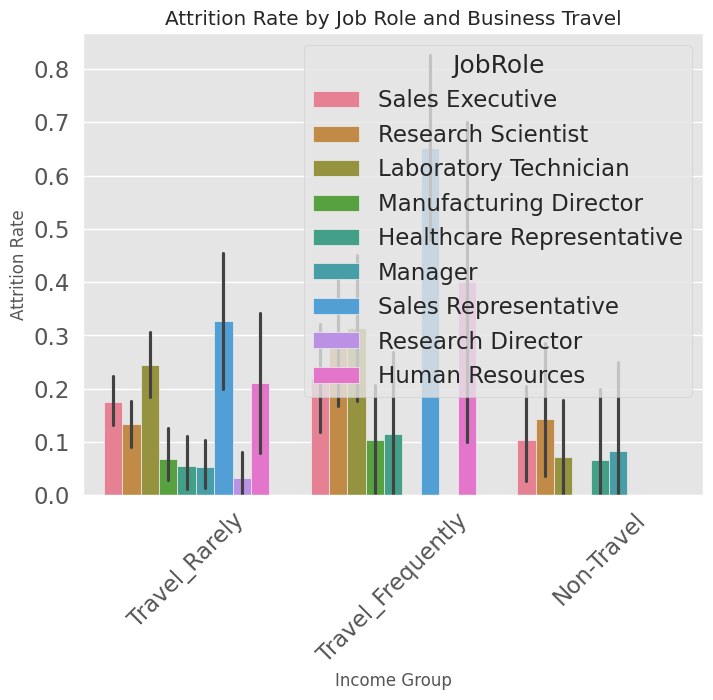

In [117]:
plt.figure(figsize=(8, 6))
sns.barplot(x='BusinessTravel', y='AttritionNum', hue='JobRole', data=df)
plt.title('Attrition Rate by Job Role and Business Travel')
plt.xlabel('Income Group')
plt.ylabel('Attrition Rate')
plt.xticks(rotation=45)
plt.show()

Business Travel:
+ Single employees traveling frequently are the most likely to leave the company. Married and divorced employees exhibit lower attrition rates, even with frequent travel.
+ Gender and age do not show a strong interaction with business travel in influencing attrition, but younger employees and males traveling frequently exhibit slightly higher turnover tendencies.
+ Business Travel affects attrition rates for certain job roles more than for others. Sales Representatives as well as HR employees who travel frequently compared to rarely are more prone to leave the company. For job roles like manufacturing director, healthcare representative or manager, business travel does not greatly affect attrition rates.



### Department, Education and Job Roles



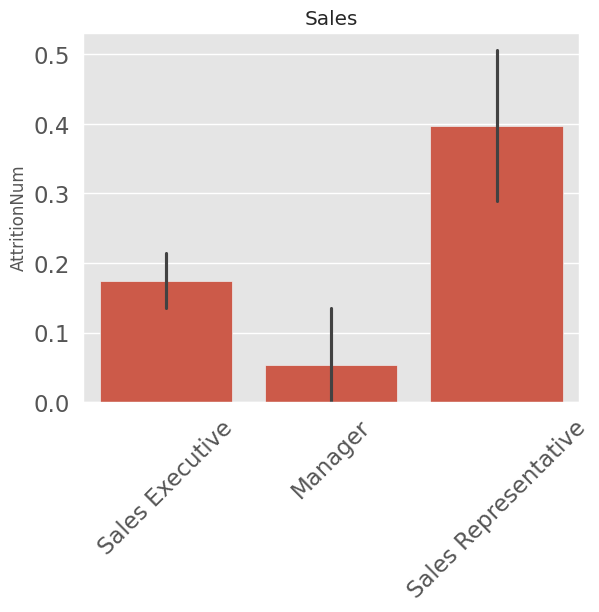

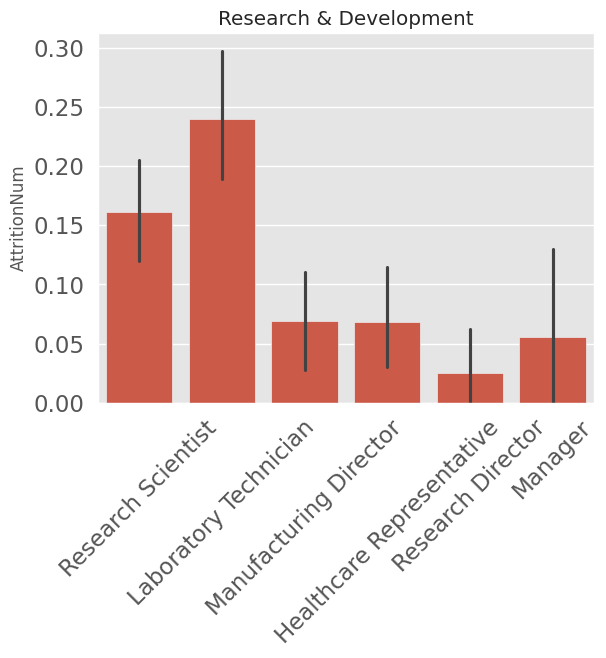

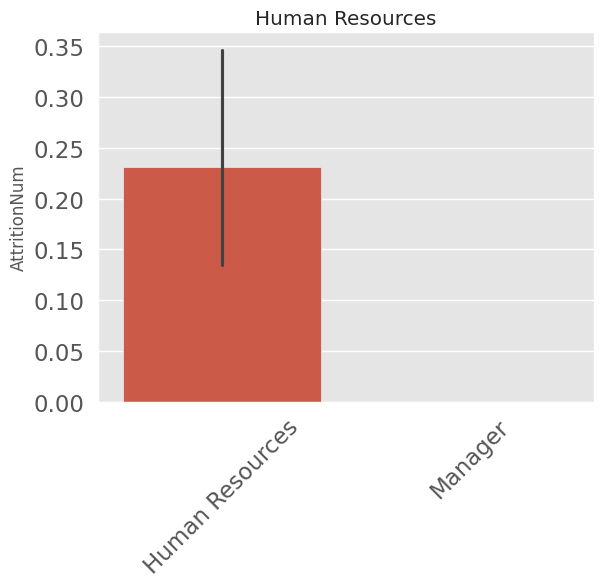

In [118]:
for department in df['Department'].unique():
  sns.barplot(x = 'JobRole', y = 'AttritionNum', data = df[df['Department'] == department])
  plt.title(department)
  plt.xticks(rotation=45)
  plt.xlabel(None)
  plt.show()

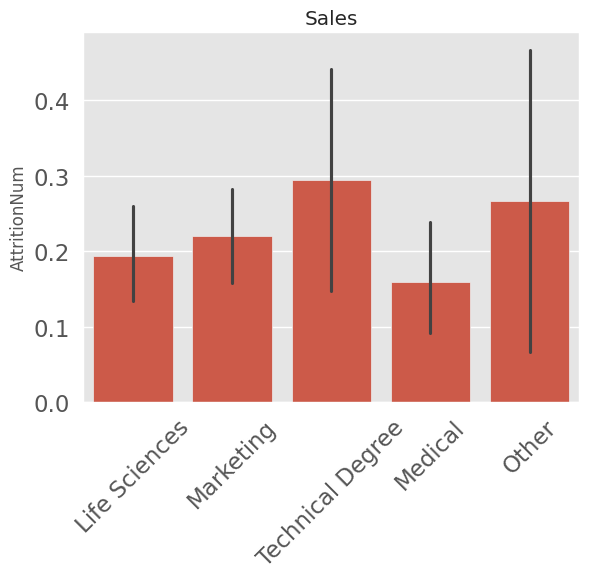

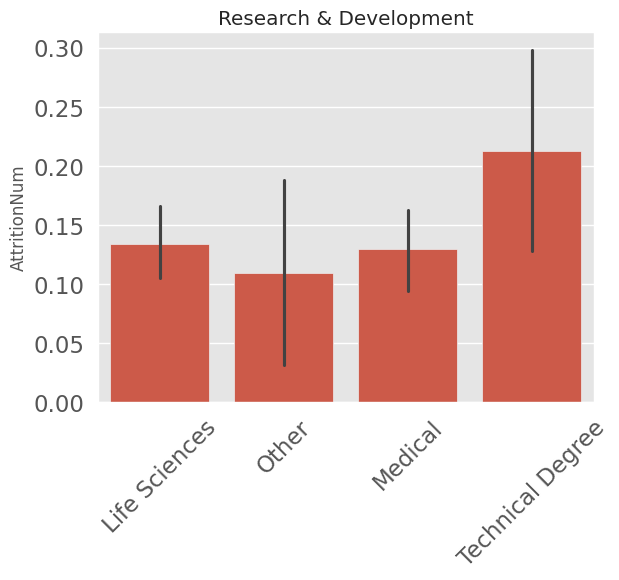

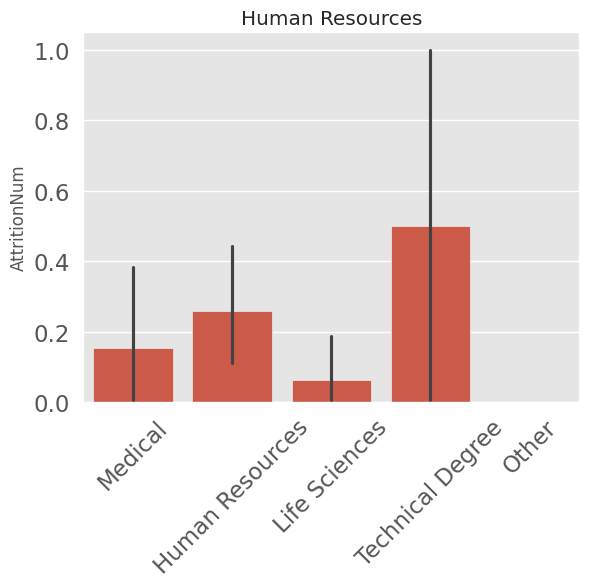

In [119]:
for department in df['Department'].unique():
  sns.barplot(x = 'EducationField', y = 'AttritionNum', data = df[df['Department'] == department])
  plt.title(department)
  plt.xticks(rotation=45)
  plt.xlabel(None)
  plt.show()

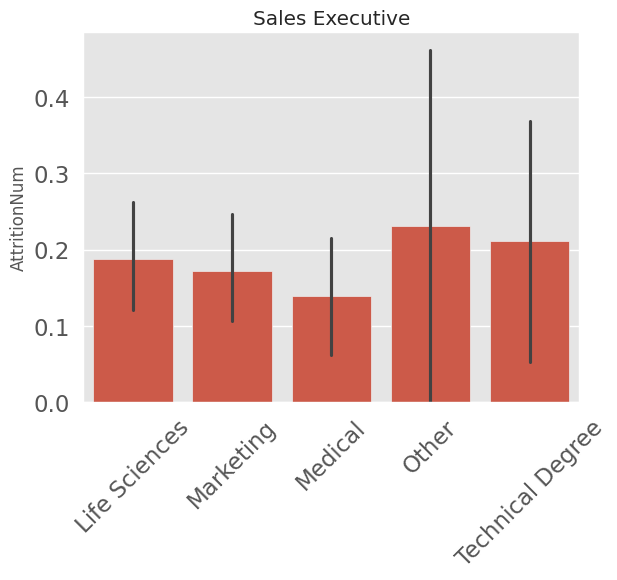

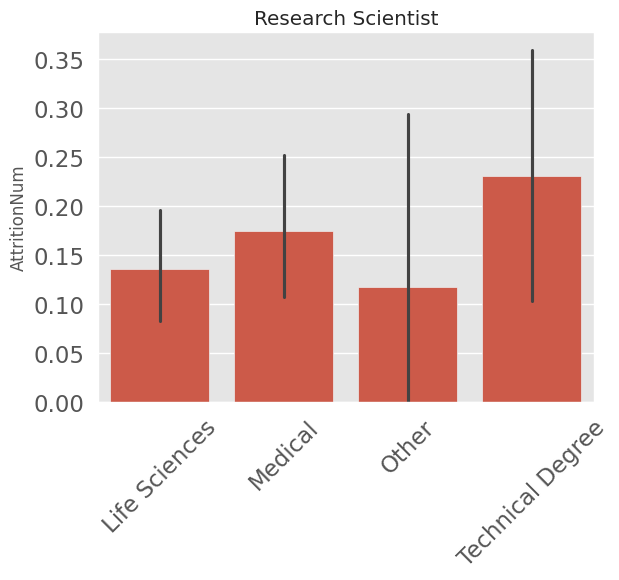

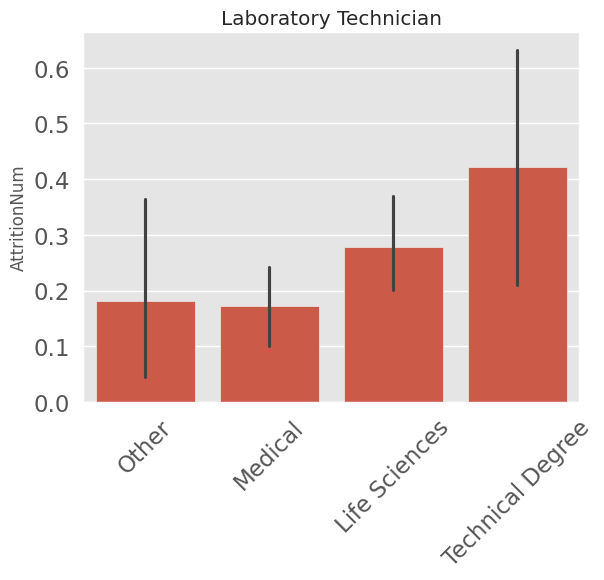

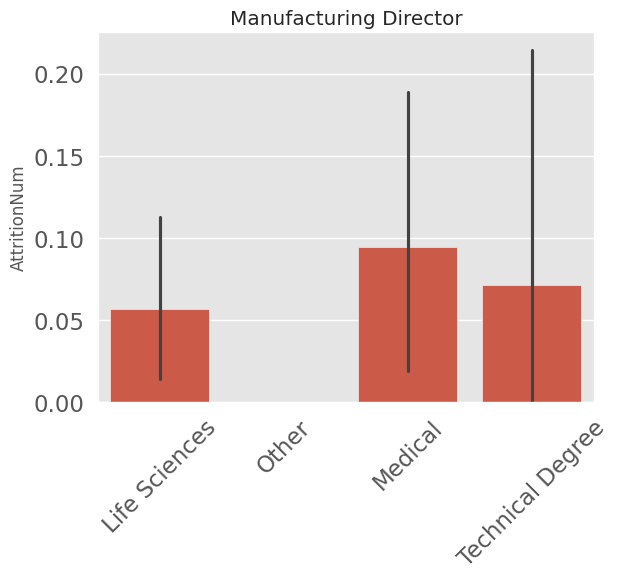

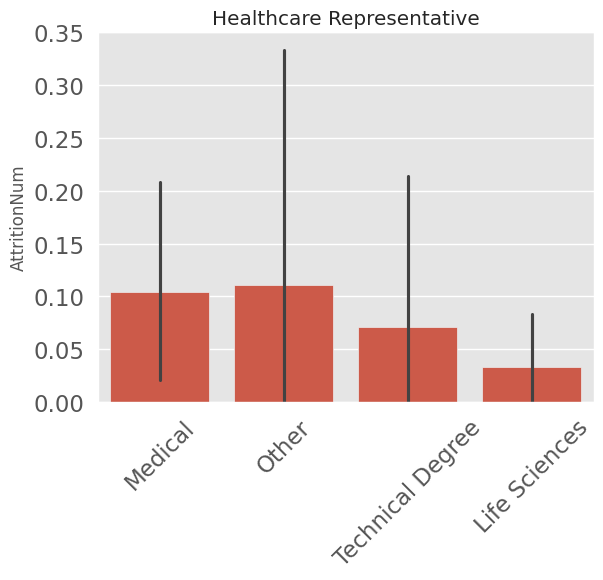

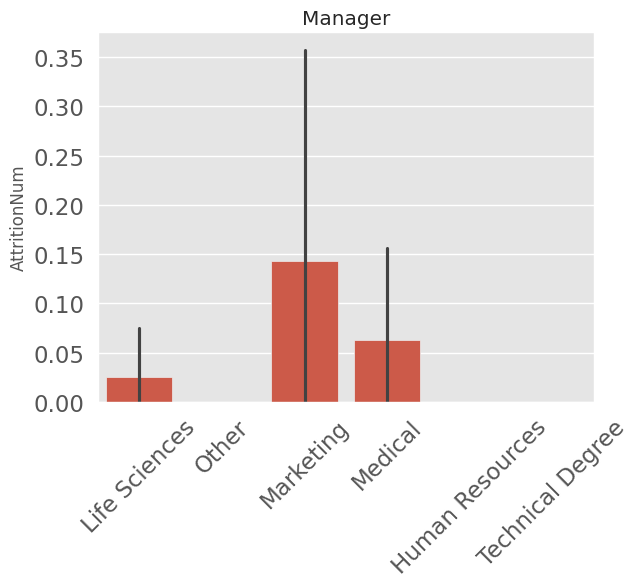

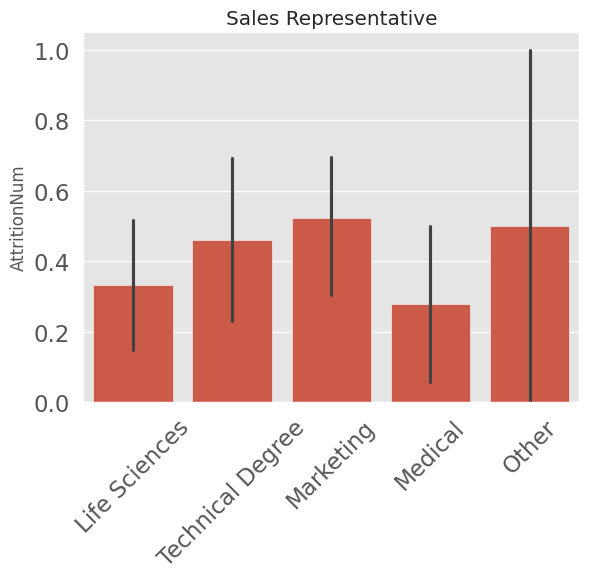

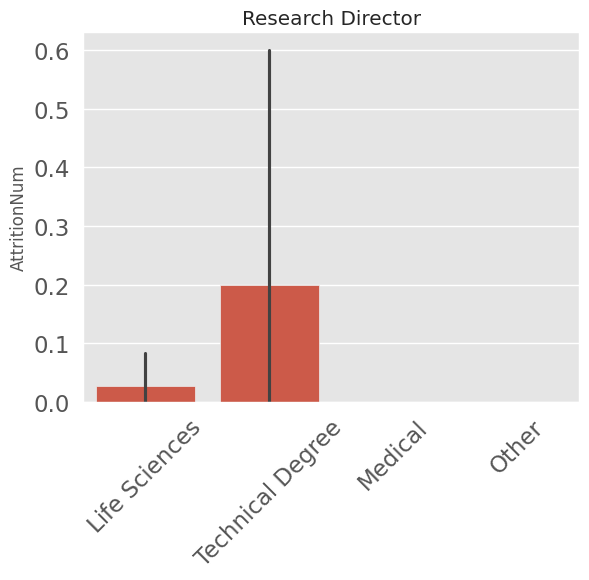

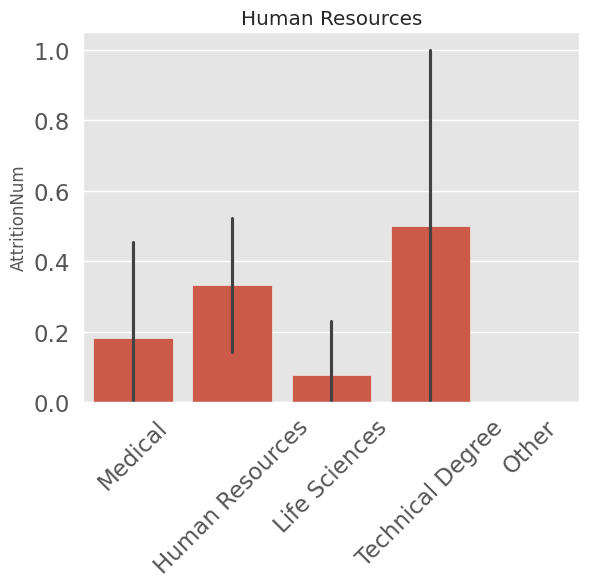

In [120]:
for department in df['JobRole'].unique():
  sns.barplot(x = 'EducationField', y = 'AttritionNum', data = df[df['JobRole'] == department])
  plt.title(department)
  plt.xticks(rotation=45)
  plt.xlabel(None)
  plt.show()

Attrition rates by educational fiel show high fluctuations within job roles. Overall, the variation of attrition rate by job role seems to be of greater interest compared to educational field.

Departments, Education Fields, and Job Roles:

+ Attrition is highest in the Sales Department, followed by Human Resources and Research & Development. Attition rate varies within department based on job role. Overall, non-manager and non-executive roles display higher attrition rates.
+ Employees with a technical degree have the highest attrition rate compared to other fields across departments. However, this category also displays high variablity in mean attrition rate (see error bars).
+ Attrition rates by educational fiel show high fluctuations within job roles. Overall, the variation of attrition rate by job role seems to be of greater interest compared to educational field.

### Working Overtime, Demographics and Job Characteristics

In [121]:
# Group data and calculate attrition percentages
df_stacked = df.groupby(['Gender', 'OverTime', 'Attrition'])['Attrition'].count().reset_index(name='count')
df_stacked['percentage'] = df_stacked['count'] / df_stacked.groupby(['Gender', 'OverTime'])['count'].transform('sum') * 100

# Create stacked bar chart
fig = px.bar(df_stacked,
             x='Gender',
             y='percentage',
             color='Attrition',
             barmode='stack',  # Stack the bars
             facet_col='OverTime',  # Create separate charts for OverTime
             text='percentage',  # Display percentage values on bars
             text_auto='.1f%',  # Format percentage values
             title='Attrition by Gender and OverTime')

fig.update_layout(yaxis_title='Attrition Percentage',
                  xaxis_title='Gender',
                  legend_title='Attrition')

fig.show()

In [122]:
# Group data and calculate attrition percentages
df_stacked = df.groupby(['JobRole', 'OverTime', 'Attrition'])['Attrition'].count().reset_index(name='count')
df_stacked['percentage'] = df_stacked['count'] / df_stacked.groupby(['JobRole', 'OverTime'])['count'].transform('sum') * 100

# Create stacked bar chart
fig = px.bar(df_stacked,
             x='JobRole',
             y='percentage',
             color='Attrition',
             barmode='stack',  # Stack the bars
             facet_col='OverTime',  # Create separate charts for OverTime
             text='percentage',  # Display percentage values on bars
             text_auto='.1f%',  # Format percentage values
             title='Attrition by Job Role and OverTime')

fig.update_layout(yaxis_title='Attrition Percentage',
                  xaxis_title='Job Role',
                  legend_title='Attrition')

fig.update_xaxes(tickangle=45)

fig.show()

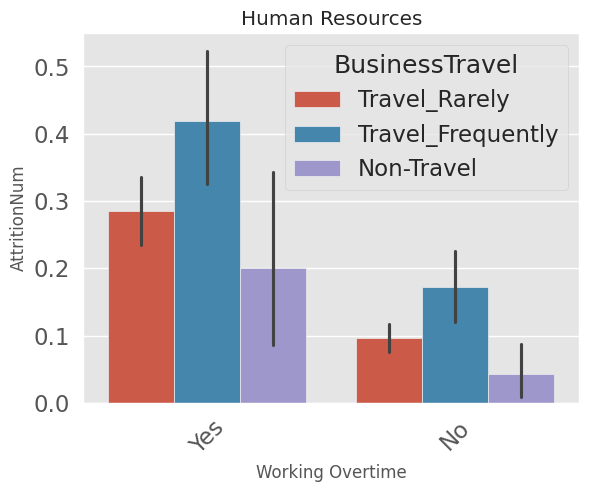

In [123]:
sns.barplot(x = 'OverTime', y = 'AttritionNum', hue = 'BusinessTravel', data = df)
plt.title(department)
plt.xticks(rotation=45)
plt.xlabel('Working Overtime')
plt.show()

Investigating Overtime:
+ For employees working overtime, male employees display higher attrition rates.
+ For overtime and jobroles, there is a great amount of variation in attrition, with laboratory technicians and sales representatives displaing the highest attrition rates when working overtime.
+ Working overtime and business travel interact positively, with employees working overtime and traveling frequently displaying the highest attrition rates.

### Relationship of Demographics

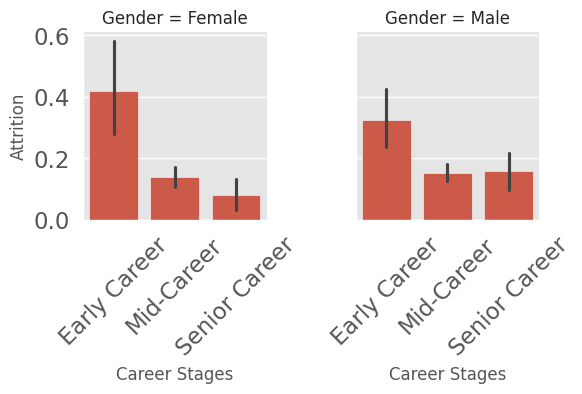

In [124]:
g = sns.FacetGrid(df, col='Gender')
g.map(sns.barplot, 'CareerStages', 'AttritionNum', order=["Early Career", "Mid-Career", "Senior Career"])
g.set_xticklabels(rotation=45)
g.set_axis_labels("Career Stages", "Attrition")
plt.show()

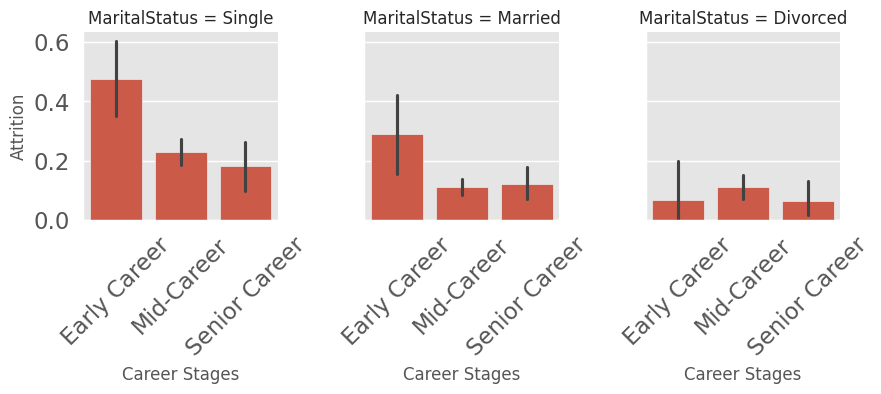

In [125]:
g = sns.FacetGrid(df, col='MaritalStatus')
g.map(sns.barplot, 'CareerStages', 'AttritionNum', order=["Early Career", "Mid-Career", "Senior Career"])
g.set_xticklabels(rotation=45)
g.set_axis_labels("Career Stages", "Attrition")
plt.show()

Investigating Demographics:
+ Attrition is slightly higher for female employees in early career stages (i.e., younger employees) than for male employees. However, across age, male employees display higher attrion rates.
+ Marital Status affects attrition in early career stages differently, with attrition rates being higher for single and married employees compared to divorced employees. Most likely to leave are young single employees.


## Inspecting Numerical Features

In [126]:
# Select only numerical features
numerical_features = df[0:30].select_dtypes(include=['int64'])

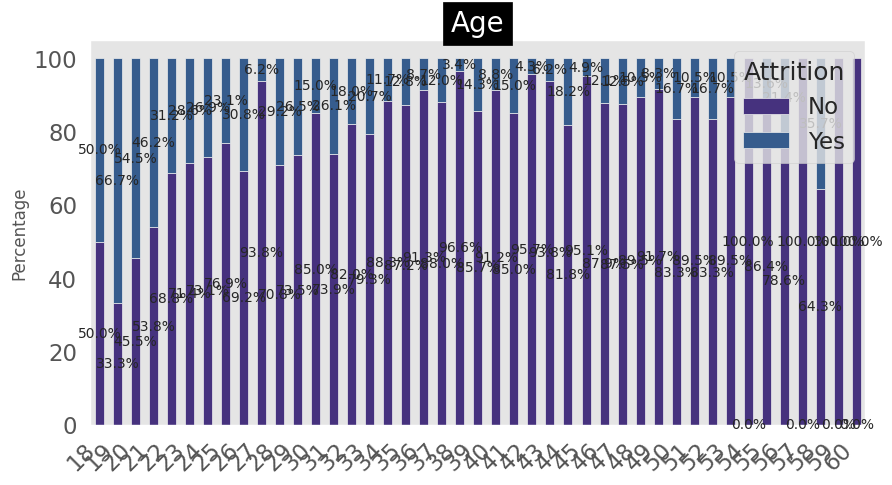

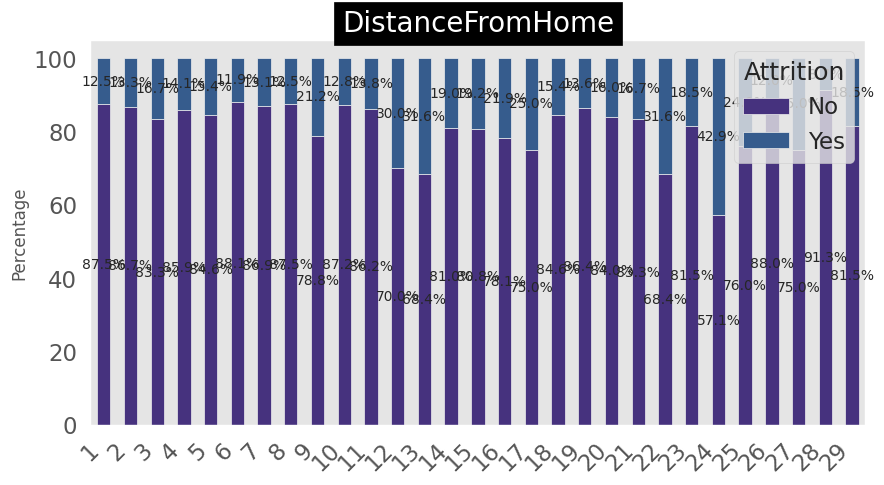

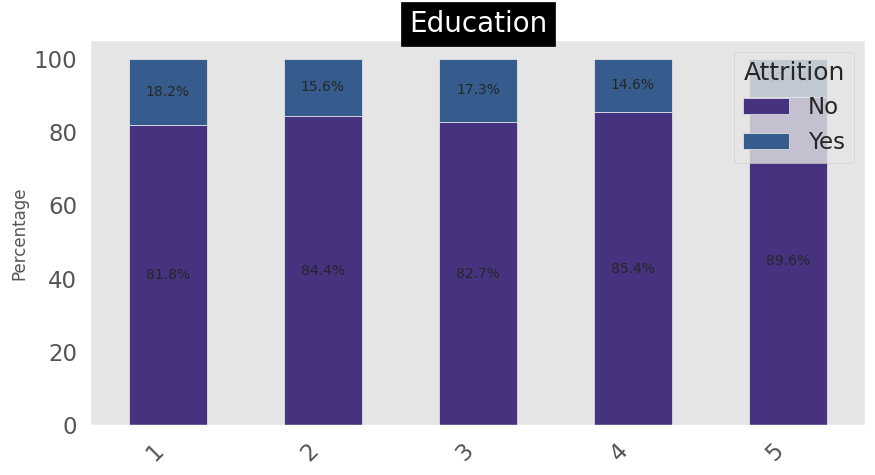

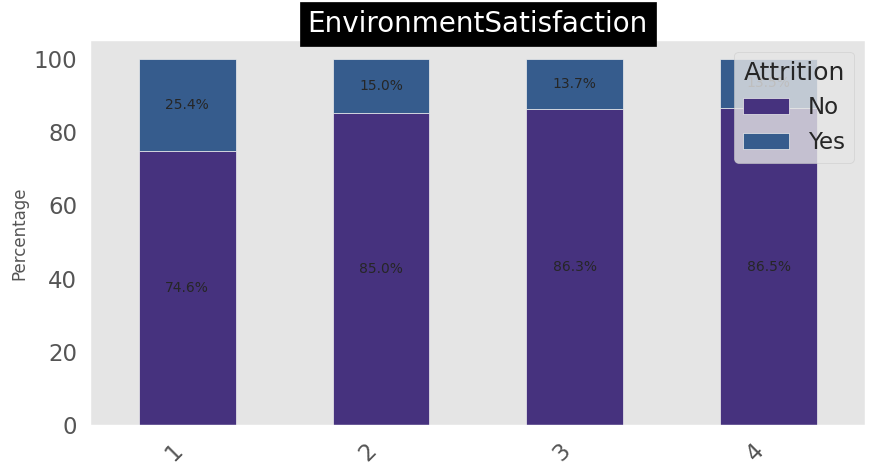

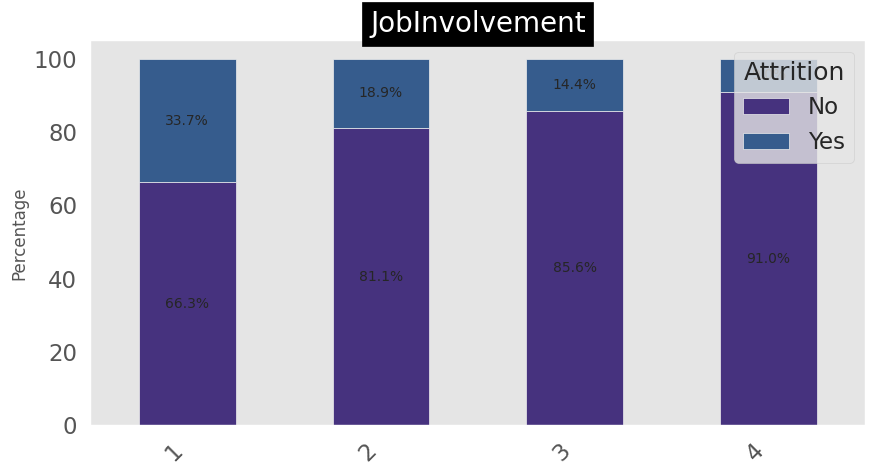

...

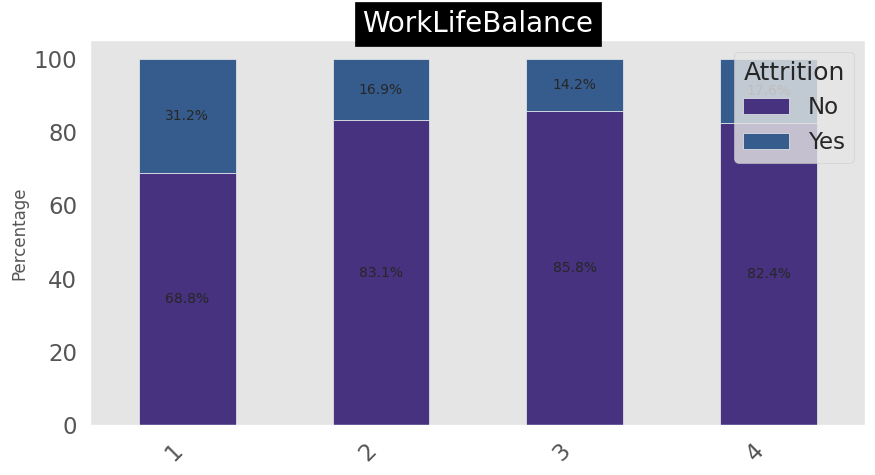

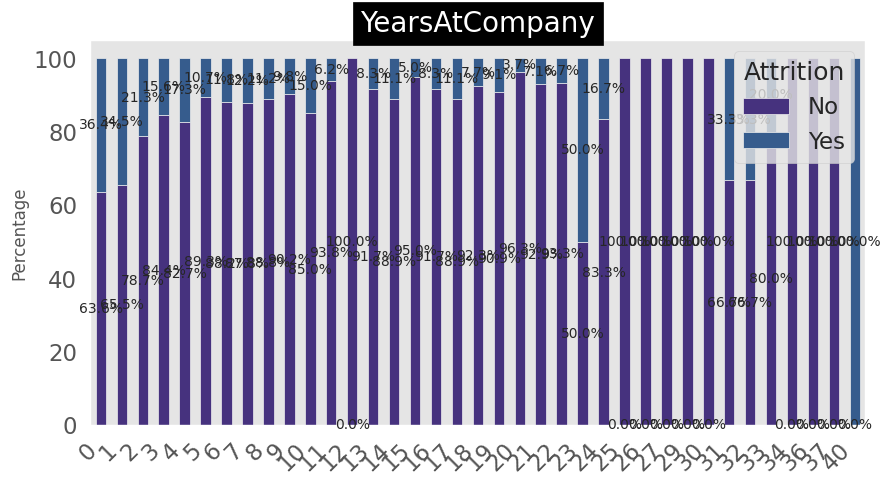

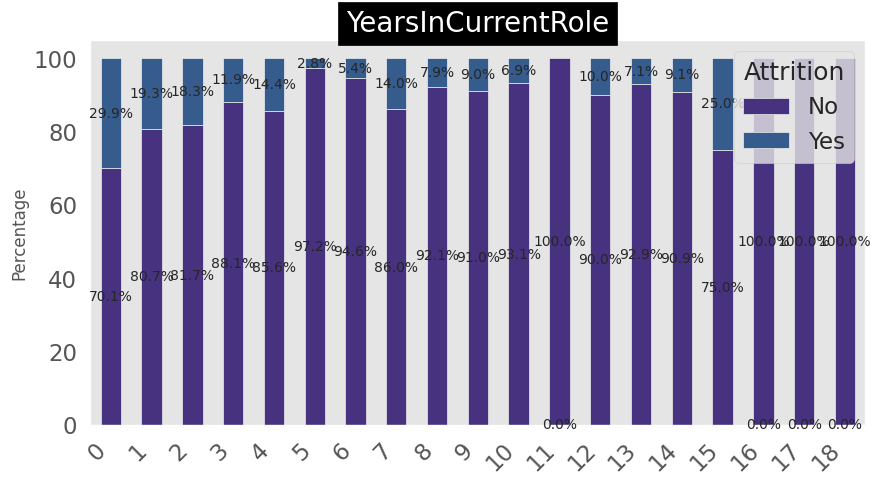

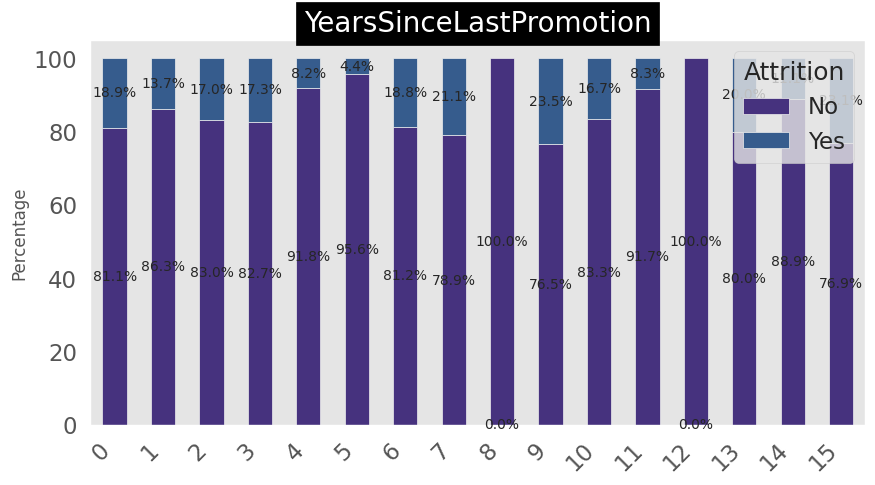

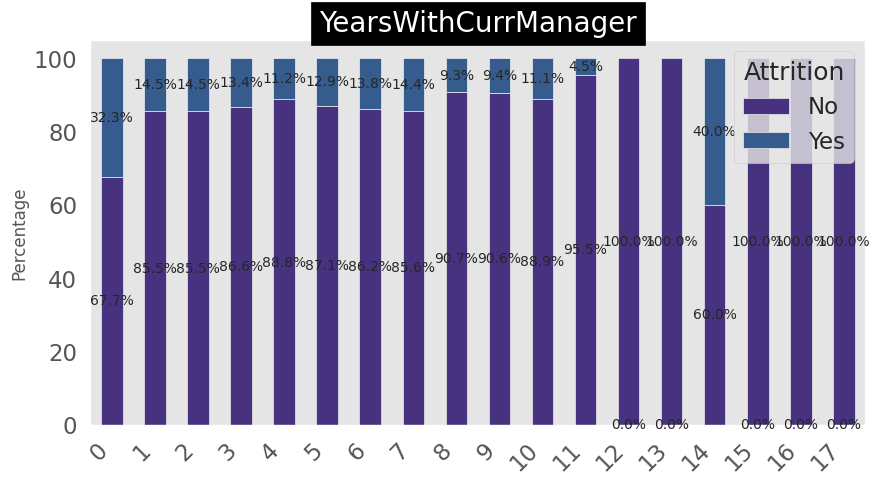

In [127]:
plt.style.use('ggplot')

numerical_features_cnt = numerical_features.drop(columns=['AttritionNum','GenderNum','OverTimeNum'])

for column in numerical_features_cnt:
    plt.figure(figsize=(10, 5))

    # Create a cross-tabulation to get counts for each category and attrition level
    cross_tab = pd.crosstab(df[column], df['Attrition'], normalize='index') * 100

    # Create a stacked bar plot using the cross-tabulation data
    ax = cross_tab.plot(kind='bar', stacked=True, ax=plt.gca(), color=sns.palettes.mpl_palette('viridis'))

    # Add percentage labels to the bars
    for p in ax.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy()
        ax.text(x + width / 2,
                y + height / 2,
                f'{height:.1f}%',
                ha='center', va='center', fontsize=10)

    plt.title(column, backgroundcolor='black', color='white', fontsize=20)
    plt.xticks(rotation=45, ha='right')
    plt.xlabel(None)
    plt.ylabel('Percentage')
    plt.grid()
    plt.legend(title='Attrition', loc='upper right')
    plt.show()

[[ 3611.54080522]
 [16744.08465608]
 [ 8496.32872928]]
  IncomeGroup  AttritionNum
0         Low      0.195415
1     Average      0.131507
2        High      0.052910


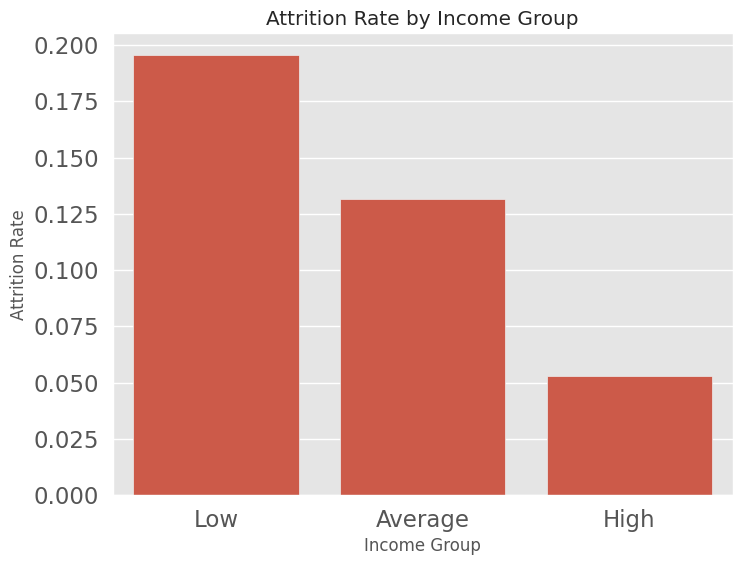

In [128]:
kmeans = KMeans(n_clusters=3, random_state=42)  # 3 clusters
df['IncomeGroup'] = kmeans.fit_predict(df[['MonthlyIncome']])

cluster_centers = kmeans.cluster_centers_
print(cluster_centers)

label_mapping = {
    0: 'Low',
    2: 'Average',
    1: 'High'
}

df['IncomeGroup'] = df['IncomeGroup'].map(label_mapping)

ordered_categories = ['Low', 'Average', 'High']

df['IncomeGroup'] = pd.Categorical(df['IncomeGroup'], categories=ordered_categories, ordered=True)

df_incomeInfo = df.groupby('IncomeGroup')['MonthlyIncome'].agg(['max', 'size'])
df_incomeInfo.rename(columns={'may': 'MaxIncome', 'size': 'Proportion'}, inplace=True)
df_incomeInfo['Proportion'] = df_incomeInfo['Proportion'] / len(df)
df_incomeInfo

# Group by 'IncomeGroup' and calculate attrition rates
attrition_by_income = df.groupby('IncomeGroup')['AttritionNum'].mean().reset_index()

# Display the attrition rates per income group
print(attrition_by_income)

# Visualize attrition rates by income group using a bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x='IncomeGroup', y='AttritionNum', data=attrition_by_income)
plt.title('Attrition Rate by Income Group')
plt.xlabel('Income Group')
plt.ylabel('Attrition Rate')
plt.show()

### Insights From Initial Inspection

+ **Increase in attrition for the age range 18 - 35**, indicating that younger employees at the beginning of their career are more inclined to leave the company.
+ **Slight increase in attrition for employees working greater distances from home.** However, attrition rates vary greatly even for higher distances.
+ **Lowest rate of attrition for employees who obtained a doctorate** compared to all other degrees.
+ **Employees with a low work environment satisfaction are more prone to leave** compated to others.
+ **Attrition rates are highest for employees with low job involvement** and decrease the higher invovlement gets.
+ **Greater proportion of attrition for lower Joblevels**, which relates to greater attrition in young age.
+ **Attrition rates are highest for employees with low job satisfaction** and decrease the higher satisfaction gets.
+ **Greater attrition rates in employees who worked for at least more than 5 other companies**.
+ **Employees receiving are greater increase in salary across two years are more prone to leave** compared to smaller salary increases.
+ **No difference in attrition rates between employees with an excellent or outstanding performance rating.** Other ratings not available in the dataset.
+ **Employees with a low relationship satisfaction are more likely to leave** compared to higher ratings of relationship satisfaction.
+ **Employees not owning company stocks are more likely to leave** compared to employees who own company stocks. However, employees who own three stocks display higher attrition rates compared to employees owning one or two stocks.
+ **Greater attrition in employees within the first working years, first years at the company as well as first years in their current role**, again reflecting increased chance of employee attrition in young employees at the beginning of their career.
+ **Employees who did not receive a training wihtin the last year show higher rates of attrition** compared to employees who received at least one training.
+ **Employees who rate their work-life balance as bad display higher rates of attrition** compared to employees who rate their work-life balance at least good.
+ No clear indication of a relationship between years since last promotion and attrition rates.
+ **Higher attrition rates for employees within their first year with a current manager**. However, large increase in attrition for employees within ther 15th year with their current manager, which just might indicate an imbalance in datapoints available.
+ **Higher attrition for low income employees** compared to average and high earners.



### Correlation of Numerical Features with Attrition

Correlations are explored to investigate possible linear relationships between numerical features and attrition. Correlations < 0.10 are not described.

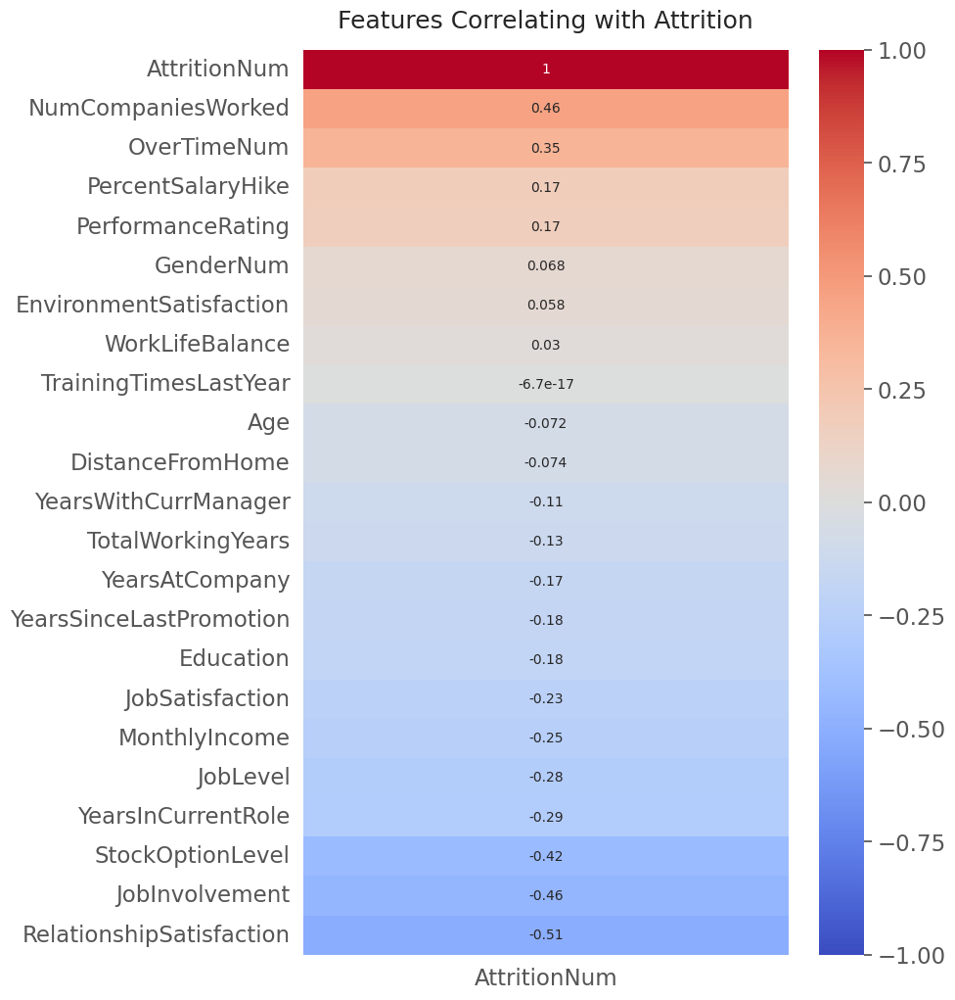

In [129]:
num_feat_corr_target = numerical_features.corr()[['AttritionNum']].sort_values(by='AttritionNum', ascending=False)

plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(num_feat_corr_target, vmin=-1, vmax=1, annot=True, cmap='coolwarm')
heatmap.set_title('Features Correlating with Attrition', fontdict={'fontsize':18}, pad=16);


Key Insights:

+ **Features increasing attrition**: The number of companies an employee has worked for as well as employees working overtime show a moderate correaltion with attrition. Of low effect are the percentage of salary hike and performance rating, indicating that these affect attrition positively to a low degree.
+ **Features decreasing attrition** *kursiver Text*: Relationship satisfaction shows a strong negative relationship, indicating that higher relationship satisfaction ratings decrease the likelihood of attrition. Greater job involvement as well as owning company stocks display a moderate negative relationship with attrition, meaning that the more and employee is invovled as well as the more stocks an employee owns the lower attrition likehood becomes. Several other variables of interest show weak negative correlations with attrition: Years in current role, job level, monthly income, jab satisfaction rating, education, years since last promotion, years at company, total working years, and years with current manager.

Notably, there are more **numerical features display a negative relationship with attrition**, indicating that there is more information in the dataset about features that decrease attrition compared to what increases attrition. This is in line with the fact that attrition is heavily imbalances, with only 16% of cases being attrition compared to non-attrition cases.

### Correlations Between Numerical Features

Correlations between features are explored to investigate possible linear relationships between features that either need to be adressed prior to analyses or could be informative. Correlations < 0.30 are not described.

Text(0.5, 1.0, 'Correlation Matrix of Numerical Features')

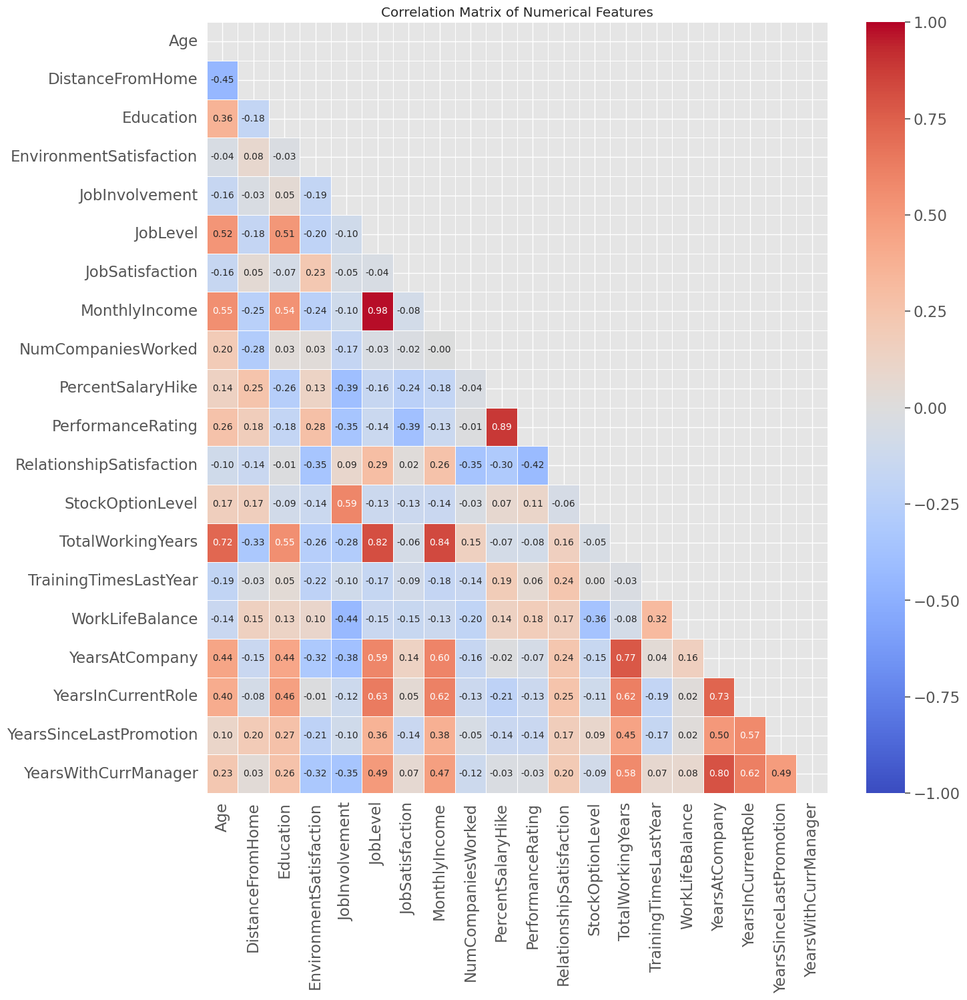

In [130]:
num_feat_corr = numerical_features_cnt.corr()

mask = np.triu(np.ones_like(num_feat_corr, dtype=bool))

plt.figure(figsize = (15,15))

sns.heatmap(num_feat_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, vmin=-1, vmax=1, mask=mask)
plt.title('Correlation Matrix of Numerical Features')

Key Insights:

**Strong positive correlations:**

+ As job level increases, monthly income also increases. This is expected in most hierarchical organizations where higher positions are associated with higher pay.
+ Employees with more years of experience (total working years) tend to earn more (monthly income), likely due to promotions and accumulated expertise.
+ Employees who have been with the company longer (years at company) are more likely to have spent more time in their current role (years in current role).
+ Higher total working years strongly correlates with higher job levels, indicating experience plays a significant role in promotions.
+ Employees who have been in their current role longer also tend to have worked with their current manager for longer periods.

**Moderate negative correlations:**

+ Younger employees (age) live farther from work (distance from home), than older employees.
+ Employees with many total working years experience fewer recent promotions (years since last promotion).
+ Employees who have been with the company longer (years at company) perceive worse work-life balance.
+ Employees with more total working years tend to receive smaller percentage salary hikes.
+ Longer periods without a promotion (years since last promotion) are associated with lower performance ratings.

## Joined Effects of Top Categorical and Numerical Features

Based on the insights so far, the following relationships and their impact on attrition are explored to gain a deeper understanding of patterns within the data.

+ **Business Travel:**
  + Does monthly Income mitigate the risk of frequent business travel on attrition?
  + Does owning company stock mitigate the risk of frequent business travel on attrition?
+ **Marital Status:**
  + Does monthly income moderate the effect of marital status on attrition?
  + Does relationship satisfaction mitigate the risk of single employees leaving?
+ **OverTime:**
  + Does job satisfaction mitigate overtime-related risks.
  + Does job involvement & work life balance amplify or mitigate overtime-related risks.
+ **Years with Current Manager:**
  + Job Satisfaction to see if managerial influence interacts with perceived job quality.
  + Relationship satisfaction to see if there is a trend in spend time with a manager and perceived relationship quality.

### Business Travel and Financial Reward

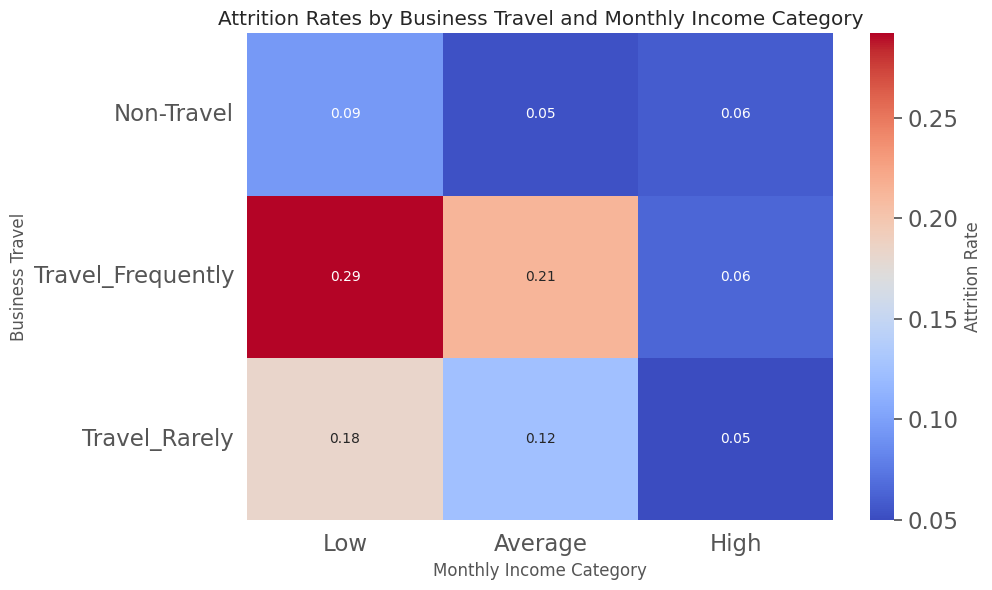

In [131]:
# Calculate attrition rates by BusinessTravel and IncomeGroup
attrition_rates = df.groupby(['BusinessTravel', 'IncomeGroup'])['AttritionNum'].mean().unstack()

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(attrition_rates, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Attrition Rate'})
plt.title('Attrition Rates by Business Travel and Monthly Income Category')
plt.xlabel('Monthly Income Category')
plt.ylabel('Business Travel')
plt.tight_layout()
plt.show()

Employees in the low monthly income group have the highest attrition rates within all business travel categories, and this is especially pronounced for frequently traveling employees. As income increases, attrition rates drop significantly wihtin all business travel groups, suggesting that higher income mitigates the risk of attrition, even for frequent travelers.

Employees in the non-travel group consistently have lower attrition rates across all income categories, indicating that business travel adds an additional layer of risk. **Employees who travel frequently exhibit the highest attrition risk for low income, as well as the sharpest decrease in attrition as income rises, confirming that income is a crucial mitigating factor for frequent travelers.**

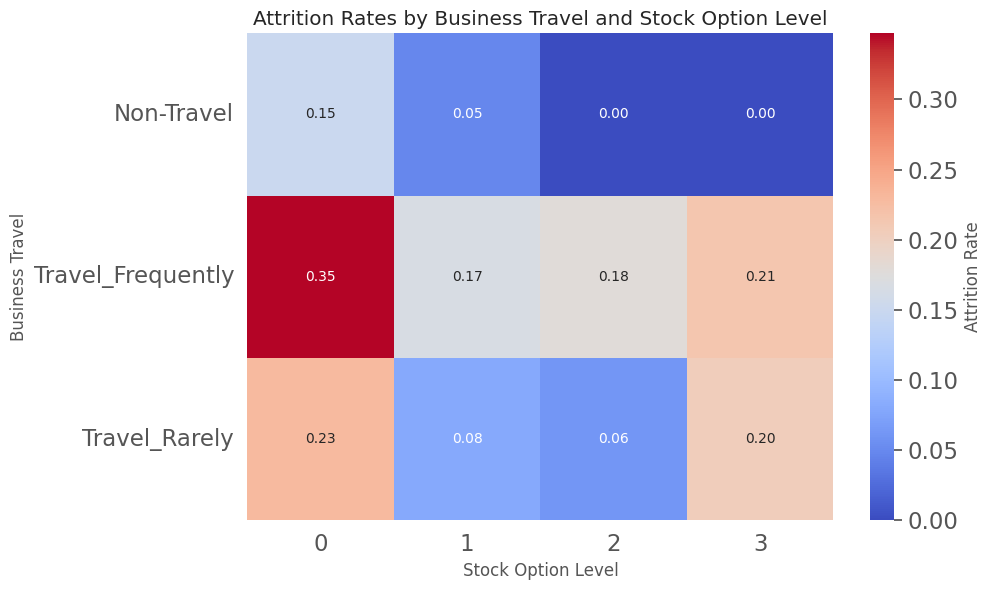

In [132]:
# Calculate attrition rates by BusinessTravel and IncomeGroup
attrition_rates = df.groupby(['BusinessTravel', 'StockOptionLevel'])['AttritionNum'].mean().unstack()

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(attrition_rates, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Attrition Rate'})
plt.title('Attrition Rates by Business Travel and Stock Option Level')
plt.xlabel('Stock Option Level')
plt.ylabel('Business Travel')
plt.tight_layout()
plt.show()

Employees without stock options display the highest attrition rates within business travel groups, with attrition rates being especially high for frequent travelers.

**For Non-Travelers, higher stock option levels are consistently associated with the lowest attrition rates**, indicating that stock options are  effective at retaining employees who don't travel for business.

**For frequent and rare travelers average stock option levels (1 and 2) correspond to lower attrition rates** compared to not owning company stocks. However, at the highest stock option level, attrition rates increase again, meaning that **high stock option levels lose their retention power for frequent and rare travelers**.

### Marital Status, Monthly Income and Relationship Satisfaction

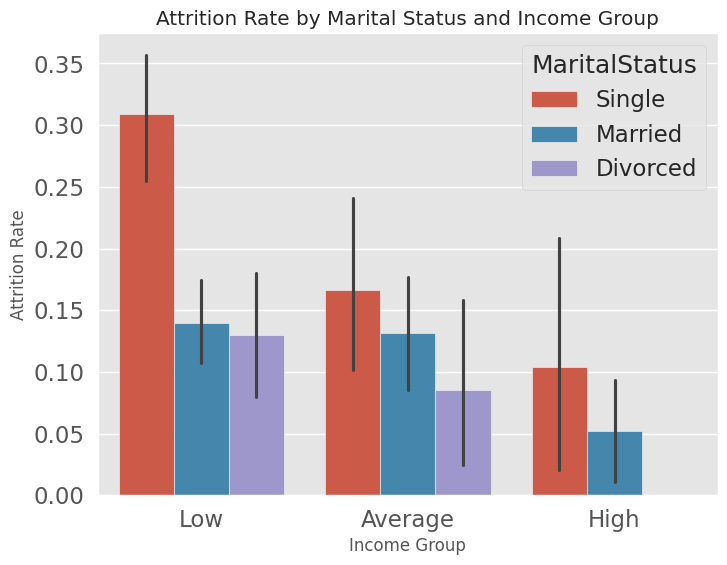

In [133]:
plt.figure(figsize=(8, 6))
sns.barplot(x='IncomeGroup', y='AttritionNum', hue='MaritalStatus', data=df)
plt.title('Attrition Rate by Marital Status and Income Group')
plt.xlabel('Income Group')
plt.ylabel('Attrition Rate')
plt.show()

Single employees in the low-income group experience the highest attrition rates compared to other marital statuses and income levels. **Attrition rates for single employees decrease as income increases, indicating that high income can mitigate attrition risk for single employees.** Still, attrition rates remain higher than for married or divorced employees.

Married and divorced employees consistently show lower attrition rates, which similarly decrease with higher income.

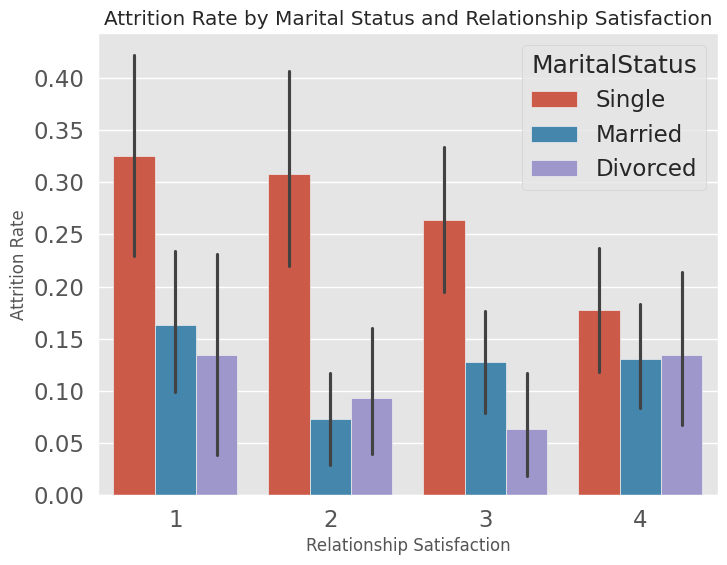

In [134]:
plt.figure(figsize=(8, 6))
sns.barplot(x='RelationshipSatisfaction', y='AttritionNum', hue='MaritalStatus', data=df)
plt.title('Attrition Rate by Marital Status and Relationship Satisfaction')
plt.xlabel('Relationship Satisfaction')
plt.ylabel('Attrition Rate')
plt.show()

**Relationship satisfaction plays a role in mitigating attrition for single employees, especially for single employees who rate their relationship satisfaction to be very high.** However, even though attrition rates decrease for single employees as relationship satisfaction increases, their attrition rates remain  higher than those of married or divorced employees.

The relationship between relationship satisfaction and attrition rates is less straightforward for married and divorced employees, suggesting that relationship satisfaction affects these employees to a lesser degree compared to single employees.

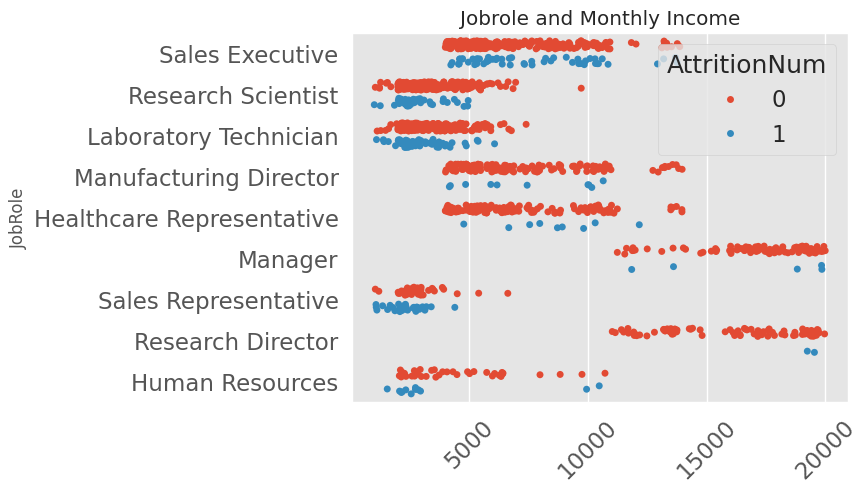

In [135]:
sns.stripplot(x='MonthlyIncome', y='JobRole', hue='AttritionNum', data=df, jitter=0.2, dodge=True)
plt.title('Jobrole and Monthly Income')
plt.xticks(rotation=45)
plt.xlabel(None)
plt.show()

Overall, the varying attrition rate by jobrole in departments can be explained by differences in monthly salary. An exception to this pattern is the Job Role Sales Executive, which displays even rates of attrition across salary range, whereas salary range is similar to those of Manufactoring Director and Healthcare Representatives.

### Overtime, Job Satisfaction & Involvement and Work-Life Balance

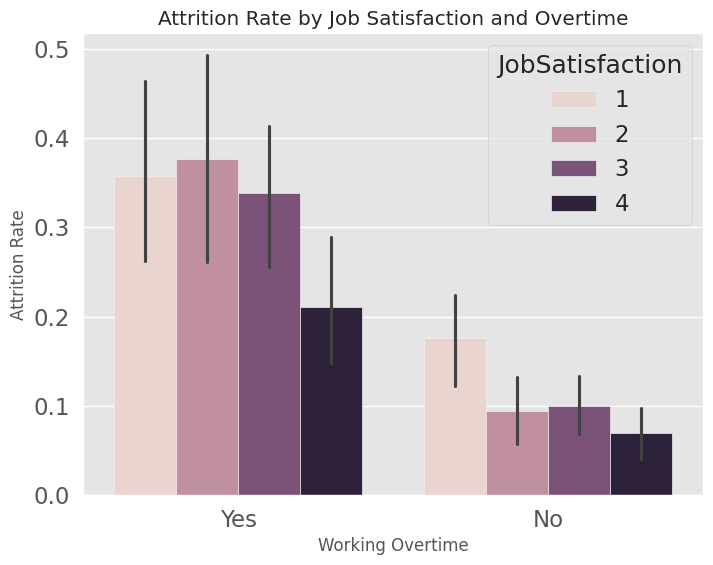

In [136]:
plt.figure(figsize=(8, 6))
sns.barplot(x='OverTime', y='AttritionNum', hue='JobSatisfaction', data=df)
plt.title('Attrition Rate by Job Satisfaction and Overtime')
plt.xlabel('Working Overtime')
plt.ylabel('Attrition Rate')
plt.show()

Employees working overtime display higher attrition rates overall, with **only employees working overtime who rate their job satisfaction to be very high displaying comparably lower attrition rates**.

Employees not working overtime consistently show lower attrition rates, which are only comparably elevated for employees that rate their job satisfaction to be low.


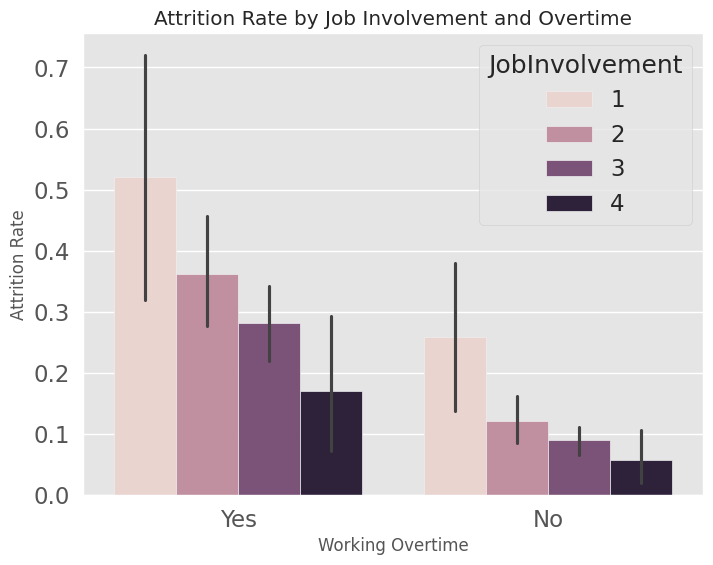

In [137]:
plt.figure(figsize=(8, 6))
sns.barplot(x='OverTime', y='AttritionNum', hue='JobInvolvement', data=df)
plt.title('Attrition Rate by Job Involvement and Overtime')
plt.xlabel('Working Overtime')
plt.ylabel('Attrition Rate')
plt.show()

Overall, employees working overtime display higher attrition rates compared to employees not working overtime. Also, employees with low job involvement exhibit the highest attrition rates independent of overtime. The two factors affect each other negatively, with **employees with low job involvement displaying the highest attrition rates when working overtime**.



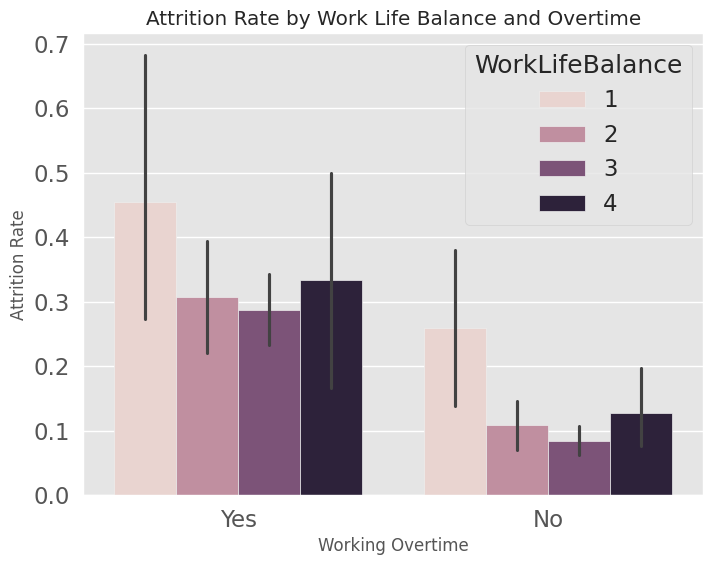

In [138]:
plt.figure(figsize=(8, 6))
sns.barplot(x='OverTime', y='AttritionNum', hue='WorkLifeBalance', data=df)
plt.title('Attrition Rate by Work Life Balance and Overtime')
plt.xlabel('Working Overtime')
plt.ylabel('Attrition Rate')
plt.show()

**For employees working overtime, work-life balance is not a strong protective factor against attrition.** Poor work-life balance exacerbates attrition risks for employees not working overtime, while good work-life balance significantly mitigates these risks.

### Years with Current Manager, Job & Relationship Satisfaction

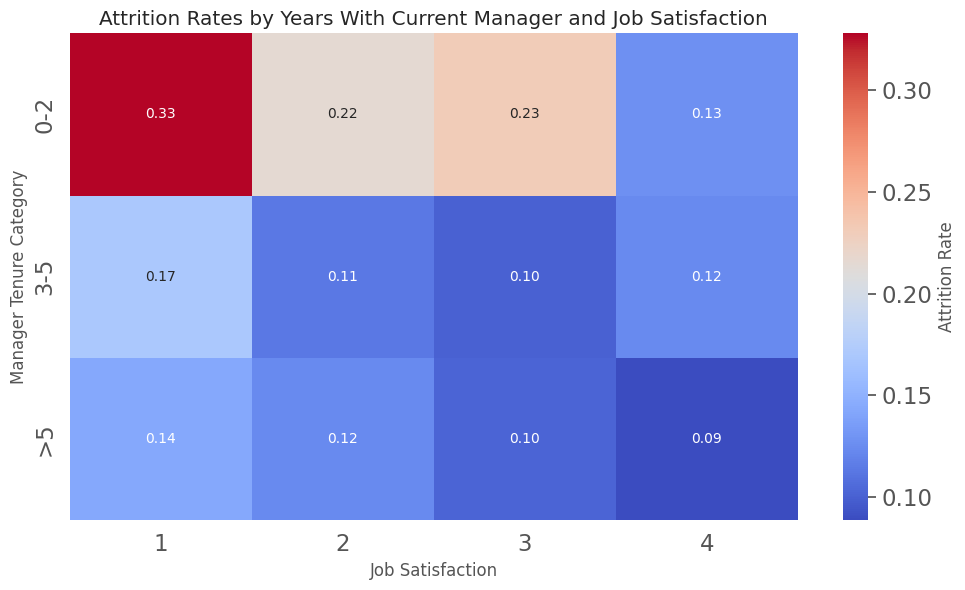

In [139]:
# Example categorization of "Years with Current Manager"
df['ManagerTenureCategory'] = pd.cut(df['YearsWithCurrManager'],
                                       bins=[-1, 2, 5, float('inf')],
                                       labels=['0-2', '3-5', '>5'])

# Calculate attrition rates by Years With Current Manager and Job Satisfaction
attrition_rates = df.groupby(['ManagerTenureCategory','JobSatisfaction'])['AttritionNum'].mean().unstack()

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(attrition_rates, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Attrition Rate'})
plt.title('Attrition Rates by Years With Current Manager and Job Satisfaction')
plt.xlabel('Job Satisfaction')
plt.ylabel('Manager Tenure Category')
plt.tight_layout()
plt.show()

Employees who are 0–2 years with their current manager have the highest attrition rates overall, especially at low job satisfaction levels. As job satisfaction increases, attrition rates drop significantly for this group, indicating that **job satisfaction is a mitigating factor for employees new to their manager relationship**.

Attrition rates stabilize in the 3–5 year category, with a noticeable reduction in risk across all satisfaction levels. Employees in the >5 year category consistently exhibit the lowest attrition rates, regardless of satisfaction level.

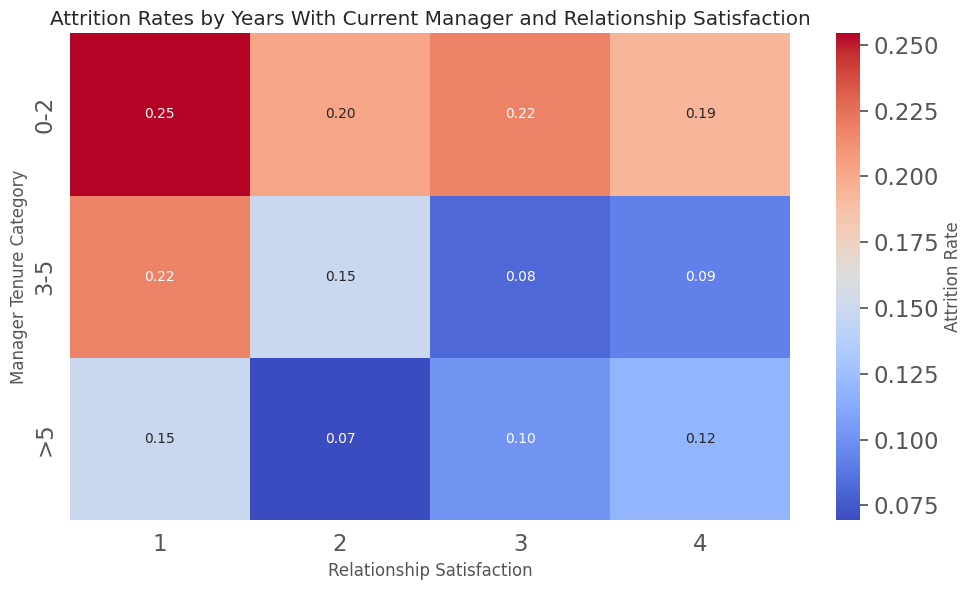

In [140]:
# Calculate attrition rates by Years With Current Manager and Relationship Satisfaction
attrition_rates = df.groupby(['ManagerTenureCategory','RelationshipSatisfaction'])['AttritionNum'].mean().unstack()

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(attrition_rates, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Attrition Rate'})
plt.title('Attrition Rates by Years With Current Manager and Relationship Satisfaction')
plt.xlabel('Relationship Satisfaction')
plt.ylabel('Manager Tenure Category')
plt.tight_layout()
plt.show()

**Attrition rates are highest in the 0–2 year category, especially with low relationship satisfaction.** Across all tenure categories, higher relationship satisfaction correlates with lower attrition rates. The 3–5 year group benefits the most from improved satisfaction, showing a sharp decline in attrition rates as satisfaction increases.

# Data Preparation for Training and Testing

This section focuses on preparing the dataset for machine learning by applying the necessary preprocessing steps. Key tasks include cleaning the data, encoding categorical variables, investingating possible issues with multicollinearity and selecting relevant predictors based on exploratory analysis.


## Select Key Features Based on EDA

Feature selection is guided by insights derived from the Exploratory Data Analysis (EDA). Variables that demonstrate strong relationships with the target variable (Attrition) or are hypothesized to have predictive value are retained.

By focusing on these features, the dataset is optimized to balance predictive accuracy and computational efficiency while leveraging the most informative variables.

In [141]:
# Select Key Features
df_key = df.drop(columns=['Attrition','BusinessTravel','Department','EducationField','Gender','JobRole','MaritalStatus','OverTime','CareerStages','CareerStages_Early Career','CareerStages_Mid-Career','CareerStages_Senior Career','IncomeGroup','ManagerTenureCategory'])

df_key.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 47 columns):
 #   Column                             Non-Null Count  Dtype
---  ------                             --------------  -----
 0   Age                                1470 non-null   int64
 1   DistanceFromHome                   1470 non-null   int64
 2   Education                          1470 non-null   int64
 3   EnvironmentSatisfaction            1470 non-null   int64
 4   JobInvolvement                     1470 non-null   int64
 5   JobLevel                           1470 non-null   int64
 6   JobSatisfaction                    1470 non-null   int64
 7   MonthlyIncome                      1470 non-null   int64
 8   NumCompaniesWorked                 1470 non-null   int64
 9   PercentSalaryHike                  1470 non-null   int64
 10  PerformanceRating                  1470 non-null   int64
 11  RelationshipSatisfaction           1470 non-null   int64
 12  StockOptionLevel    

## Inspect High Correlations & Multicollinearity

The presence of high correlations and multicollinearity among numerical features can negatively impact model performance by introducing redundancy and instability in coefficient estimates. To address this, a correlation matrix and Variance Inflation Factor (VIF) analysis will be performed to identify and mitigate such issues.


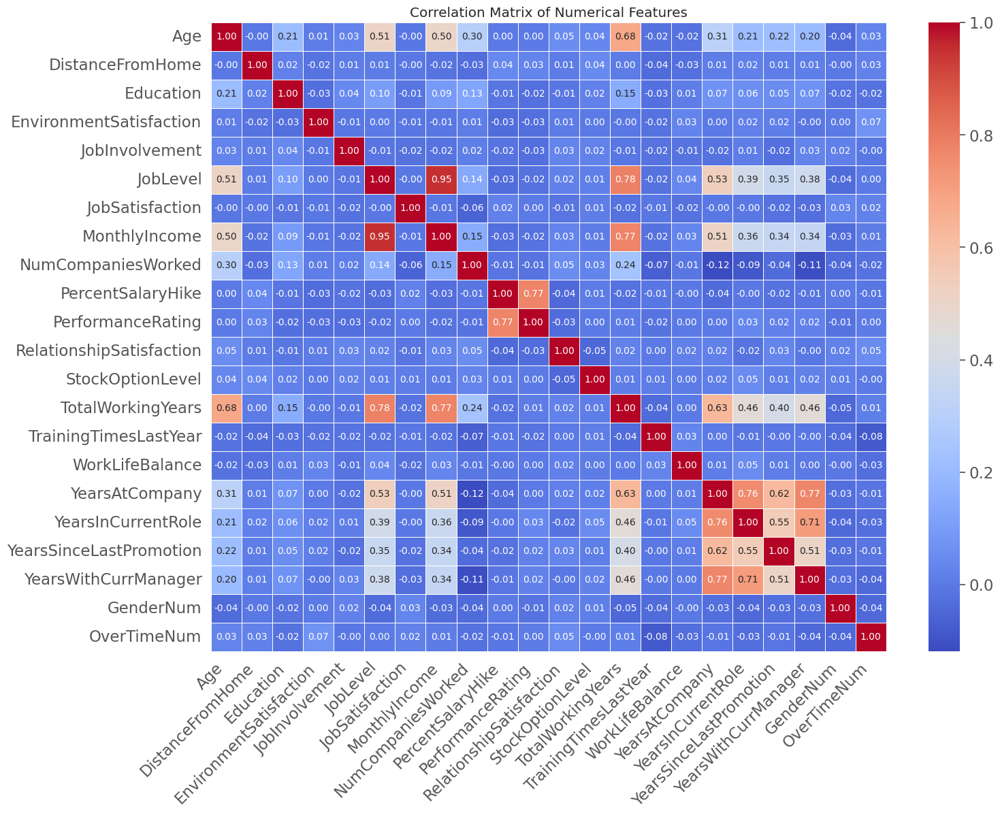

In [142]:
# drop target for inspection of high correlation between features
numerical_key_features = df_key.select_dtypes(include=['int64']).drop(columns = ['AttritionNum'])

# Calculate the correlation matrix
correlation_matrix = numerical_key_features.corr()

# Create a heatmap using seaborn
plt.figure(figsize=(16, 12))  # Adjust figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Numerical Features')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.yticks(rotation=0)  # Keep y-axis labels vertical
plt.show()

Inspection of High Correlations:
+ JobLevel and MonthlyIncome (0.95): Remove JobLevel
+ TotalWorkingYears and MonthlyIncome (0.85): Remove TotalWorkingYears
+ YearsAtCompany and YearsInCurrentRole (0.76): Remove YearsAtCompany
+ YearsAtCompany and YearsWithCurrManager (0.62): -
+ PercentSalaryHike and PerformanceRating (0.77): Remove PerformanceRating
+ YearsSinceLastPromotion and TotalWorkingYears (0.63): -
+ YearsInCurrentRole and YearsWithCurrManager (0.71): YearsInCurrentRole

Features to be dropped:

+ JobLevel: Dropped in favor of MonthlyIncome, which provides richer granularity.
+ TotalWorkingYears: Removed due to overlap with YearsAtCompany and MonthlyIncome.
+ YearsAtCompany and YearsInCurrentRole: Removed in favor of YearsWithCurrManager for specificity.
+ PerformanceRating: Limited variability and high correlation with PercentSalaryHike.


In [143]:
df_cleaned = df_key.drop(columns = ['JobLevel','TotalWorkingYears','YearsAtCompany','PerformanceRating', 'YearsInCurrentRole'])
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 42 columns):
 #   Column                             Non-Null Count  Dtype
---  ------                             --------------  -----
 0   Age                                1470 non-null   int64
 1   DistanceFromHome                   1470 non-null   int64
 2   Education                          1470 non-null   int64
 3   EnvironmentSatisfaction            1470 non-null   int64
 4   JobInvolvement                     1470 non-null   int64
 5   JobSatisfaction                    1470 non-null   int64
 6   MonthlyIncome                      1470 non-null   int64
 7   NumCompaniesWorked                 1470 non-null   int64
 8   PercentSalaryHike                  1470 non-null   int64
 9   RelationshipSatisfaction           1470 non-null   int64
 10  StockOptionLevel                   1470 non-null   int64
 11  TrainingTimesLastYear              1470 non-null   int64
 12  WorkLifeBalance     

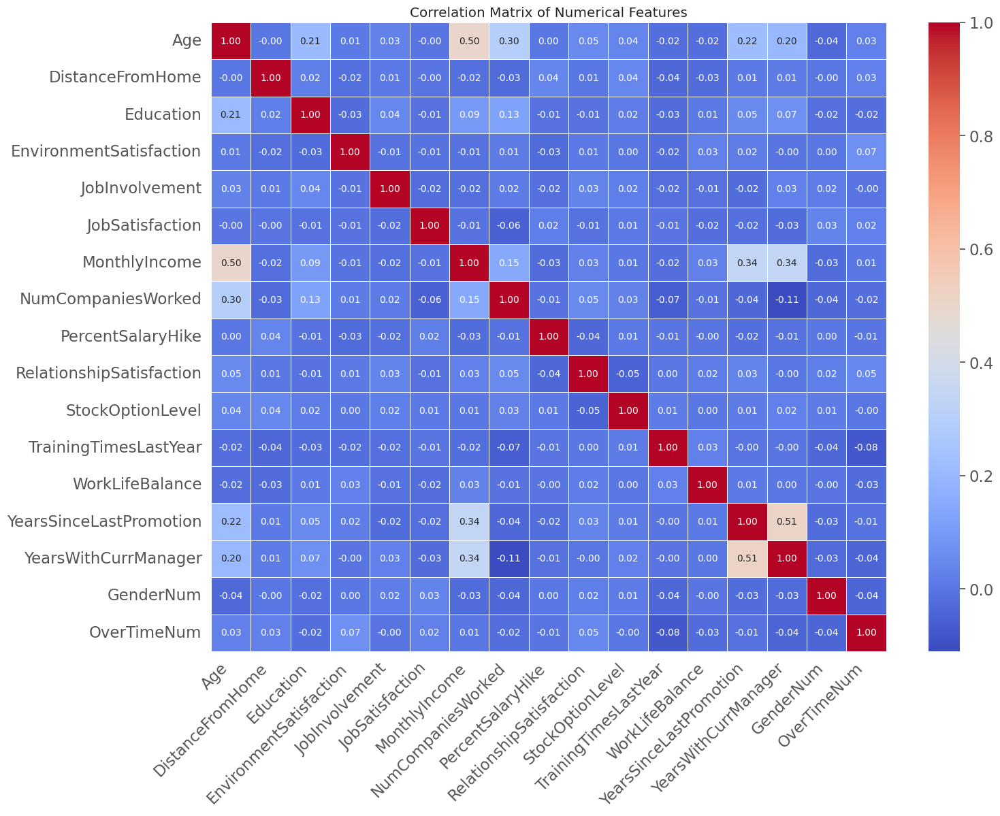

In [144]:
# drop target for inspection of high correlation between features
numerical_cleaned_features = df_cleaned.select_dtypes(include=['int64']).drop(columns = ['AttritionNum'])

# Calculate the correlation matrix
correlation_matrix = numerical_cleaned_features.corr()

# Create a heatmap using seaborn
plt.figure(figsize=(16, 12))  # Adjust figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Numerical Features')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.yticks(rotation=0)  # Keep y-axis labels vertical
plt.show()

In [145]:
# Add a constant column for VIF calculation
X = sm.add_constant(numerical_cleaned_features)

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF values
print(vif_data)

# Set a threshold for VIF (e.g., 5 or 10)
vif_threshold = 5

# Identify features with high VIF
high_vif_features = vif_data[vif_data["VIF"] > vif_threshold]["feature"].tolist()

                     feature        VIF
0                      const  97.314913
1                        Age   1.492275
2           DistanceFromHome   1.008876
3                  Education   1.057388
4    EnvironmentSatisfaction   1.009289
5             JobInvolvement   1.009335
6            JobSatisfaction   1.007836
7              MonthlyIncome   1.505509
8         NumCompaniesWorked   1.165370
9          PercentSalaryHike   1.006622
10  RelationshipSatisfaction   1.015335
11          StockOptionLevel   1.008515
12     TrainingTimesLastYear   1.016769
13           WorkLifeBalance   1.007113
14   YearsSinceLastPromotion   1.423741
15      YearsWithCurrManager   1.462476
16                 GenderNum   1.009771
17               OverTimeNum   1.023418


There where no issues with mulicollinearity (no feature displaying VIF > 5).

In [146]:
#S pecify path to save cleaned data ready for modeling
file_path = '/content/drive/MyDrive/HR_Employee_Attrition_DataScience/Data/IBM_HR_Employee_Attrition_cleaned.csv'

# safe cleaned file
df_cleaned.to_csv(file_path, index=False)

# Model Training & Testing

To predict employee attrition effectively, a range of machine learning techniques will be employed and compared. Each method was selected for its specific strengths and suitability for addressing the problem's challenges, such as class imbalance and the interplay between categorical and numerical features.

### 1. Logistic Regression
  + Suitable for binary classification tasks like attrition prediction.
  + Provides insights into feature importance through coefficients.
  + Class imbalance will be adressed using weighted logistic regression and threshold optimization.

### 2. Decision Tree-Based Models: Random Forest
  + Combines multiple decision trees to improve robustness and reduce overfitting.
  + Useful for identifying feature importance in high-dimensional data.

### 3. Decision Tree-Based Models: Gradient Boosting (CatBoost, XGBoost, LightGBM)
  + Employed for their superior handling of complex interactions between features.

### Resampling Techniques: Used for Logistic Regression and Random Forest
+ SMOTE (Synthetic Minority Oversampling Technique): Used to balance the dataset by generating synthetic samples for the minority class.
+ Borderline-SMOTE: Focused on generating samples near the decision boundary to address class imbalance more effectively.
+ ADASYN (Adaptive Synthetic Sampling): Adaptively generates samples for harder-to-classify minority instances, further enhancing model sensitivity.

*Note: Synthetic oversampling techniques like SMOTE can introduce noise by creating synthetic data points, which might lead to overfitting, especially in algorithms like gradient boosting. Therefore, resampling techniques were not used for gradient boosting algorithms. Instead, model weights were applied based on the minority class proportion.*

### Evaluation Techniques
+ Grid Search and Hyperparameter Tuning: Fine-tune parameters for algorithms like logistic regression, gradient boosting, and random forests to optimize performance.
+ Class Imbalance Solutions: Adjust class weights based on class proportion for models like logistic regression. Decision threshold optimization for better recall of minority class (attrition).

### Focus of Model Evaluation
The evaluation process prioritized the trade-off between precision and recall, with a specific focus on minimizing false negatives. In the context of employee attrition, false negatives—failing to identify employees at risk of leaving—are considered more costly than false positives.

Therefore, optimizing the decision threshold will be done with a focus on the F2-score, which prioritzes recall over precision, meaning that it is more important to minimize false negatives (failing to identify positive cases/attrition) than false positives (incorrectly idenfifying negative/non-attrition cases as attrition cases). Manual threshold optimization will be applied to fine tune precision and recall for both classes.

After the final model is selected, cross-validation will be utilized to validate its generalizability.

## Logistic Regression

In [150]:
# 1. Define features (X) and target (y)
# Select features for the model (excluding the target variable and unnecessary columns)
features = [col for col in df_cleaned.columns if col not in ['AttritionNum']]
x = df_cleaned[features]

# Target variable
y = df_cleaned['AttritionNum']

# 2. Split data into train, validation and test sets
X_train, X_temp, y_train, y_temp = train_test_split(x, y, test_size=0.3, random_state=42, stratify=y)  # 70% train, 30% temp
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp) # 15% validation, 15% test

# scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_val_scaled = scaler.transform(X_val)

### Weighted Logistic Regression

In [151]:
# Define stratified cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define the model
model_grid = LogisticRegression(max_iter=1000)

# Define hyperparameter grid
hyperparam_grid = {
    "class_weight": [{0: 30, 1: 70}, {0: 25, 1: 75}, {0: 20, 1: 80}, {0: 15, 1: 85}]
}

# Define GridSearchCV with stratified cross-validation
grid = GridSearchCV(
    estimator=model_grid,
    param_grid=hyperparam_grid,
    scoring="roc_auc",
    cv=skf,  # Use StratifiedKFold here
    n_jobs=-1,
    refit=True
)

# Fit the model
grid.fit(X_val_scaled, y_val)

# Print the best score and parameters
print(f'Best score: {grid.best_score_} with param: {grid.best_params_}')

Best score: 0.694980694980695 with param: {'class_weight': {0: 25, 1: 75}}


In [152]:
# Create and train the logistic regression model
w = {0: 25, 1: 75}
model_wgt = LogisticRegression(class_weight= w, max_iter=1000)  # Adjust hyperparameters as needed
model_wgt.fit(X_train_scaled, y_train)

# Make predictions on the validation set
y_pred_log_wgt = model_wgt.predict(X_val_scaled)

# Evaluate the model
print("Accuracy:", accuracy_score(y_val, y_pred_log_wgt))
print("Precision:", precision_score(y_val, y_pred_log_wgt))
print("Recall:", recall_score(y_val, y_pred_log_wgt))
print("F1-score:", f1_score(y_val, y_pred_log_wgt))
print('Area Under Curve:', roc_auc_score(y_val, y_pred_log_wgt))
print("Confusion matrix:\n", confusion_matrix(y_val, y_pred_log_wgt))
print(classification_report(y_val, y_pred_log_wgt))

Accuracy: 0.85
Precision: 0.53125
Recall: 0.4857142857142857
F1-score: 0.5074626865671642
Area Under Curve: 0.7023166023166023
Confusion matrix:
 [[170  15]
 [ 18  17]]
              precision    recall  f1-score   support

           0       0.90      0.92      0.91       185
           1       0.53      0.49      0.51        35

    accuracy                           0.85       220
   macro avg       0.72      0.70      0.71       220
weighted avg       0.84      0.85      0.85       220



<function matplotlib.pyplot.show(close=None, block=None)>

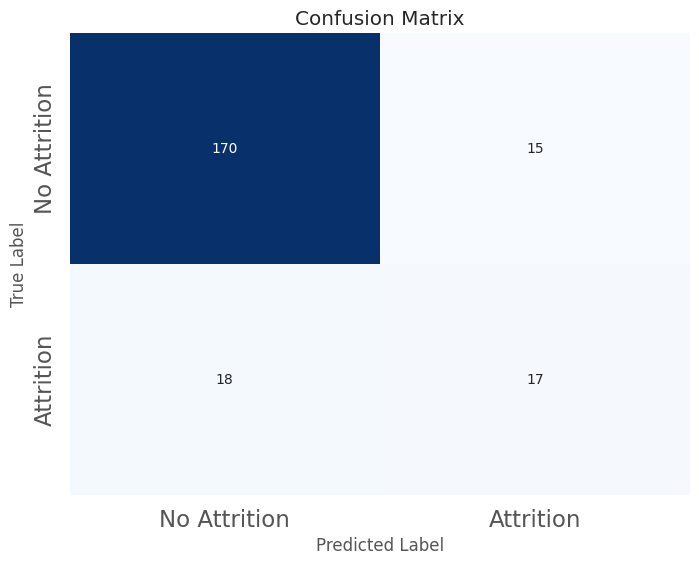

In [153]:
# Create confusion matrix
cm = confusion_matrix(y_val, y_pred_log_wgt)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks([0.5, 1.5], ['No Attrition', 'Attrition'])  # Adjust labels if needed
plt.yticks([0.5, 1.5], ['No Attrition', 'Attrition'])  # Adjust labels if needed
plt.show

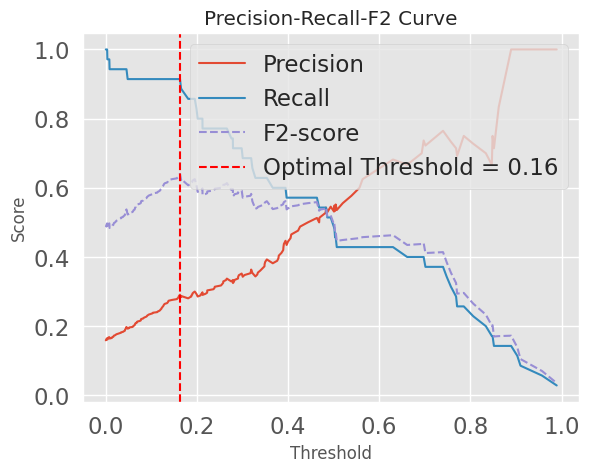

In [154]:
# adjusting the decision threshold
y_proba_wgt = model_wgt.predict_proba(X_val_scaled)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_val, y_proba_wgt)

# Plot Precision, Recall, and F2-Score
f2_scores = (1 + 2**2) * (precision[:-1] * recall[:-1]) / (2**2 * precision[:-1] + recall[:-1])
optimal_threshold_wgt = thresholds[np.argmax(f2_scores)]

plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.plot(thresholds, f2_scores, label="F2-score", linestyle='--')

plt.axvline(x=optimal_threshold_wgt, color='r', linestyle='--', label=f'Optimal Threshold = {optimal_threshold_wgt:.2f}')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.legend()
plt.title("Precision-Recall-F2 Curve")
plt.show()

In [155]:
# Get probabilities for the test set
y_proba_test_wgt = model_wgt.predict_proba(X_test_scaled)[:, 1]

# Apply the optimal threshold (obtained from validation set)
y_pred_optimal_wgt = (y_proba_test_wgt >= optimal_threshold_wgt).astype(int)


# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_wgt))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_wgt))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_wgt))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_wgt))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_wgt, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_wgt))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_wgt))
print(classification_report(y_test, y_pred_optimal_wgt))

Accuracy (optimal threshold): 0.6244343891402715
Precision (optimal threshold): 0.2882882882882883
Recall (optimal threshold): 0.8888888888888888
F1-score (optimal threshold): 0.43537414965986393
F2-score (optimal threshold): 0.6274509803921569
Area Under Curve (optimal threshold): 0.7309309309309309
Confusion matrix (optimal threshold):
 [[106  79]
 [  4  32]]
              precision    recall  f1-score   support

           0       0.96      0.57      0.72       185
           1       0.29      0.89      0.44        36

    accuracy                           0.62       221
   macro avg       0.63      0.73      0.58       221
weighted avg       0.85      0.62      0.67       221



In [156]:
# Get probabilities for the test set
y_proba_test_wgt = model_wgt.predict_proba(X_test_scaled)[:, 1]

# Apply the optimal threshold (obtained from validation set)
y_pred_optimal_wgt = (y_proba_test_wgt >= 0.25).astype(int)


# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_wgt))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_wgt))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_wgt))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_wgt))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_wgt, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_wgt))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_wgt))
print(classification_report(y_test, y_pred_optimal_wgt))

Accuracy (optimal threshold): 0.7149321266968326
Precision (optimal threshold): 0.3411764705882353
Recall (optimal threshold): 0.8055555555555556
F1-score (optimal threshold): 0.4793388429752066
F2-score (optimal threshold): 0.6331877729257642
Area Under Curve (optimal threshold): 0.7514264264264264
Confusion matrix (optimal threshold):
 [[129  56]
 [  7  29]]
              precision    recall  f1-score   support

           0       0.95      0.70      0.80       185
           1       0.34      0.81      0.48        36

    accuracy                           0.71       221
   macro avg       0.64      0.75      0.64       221
weighted avg       0.85      0.71      0.75       221



<function matplotlib.pyplot.show(close=None, block=None)>

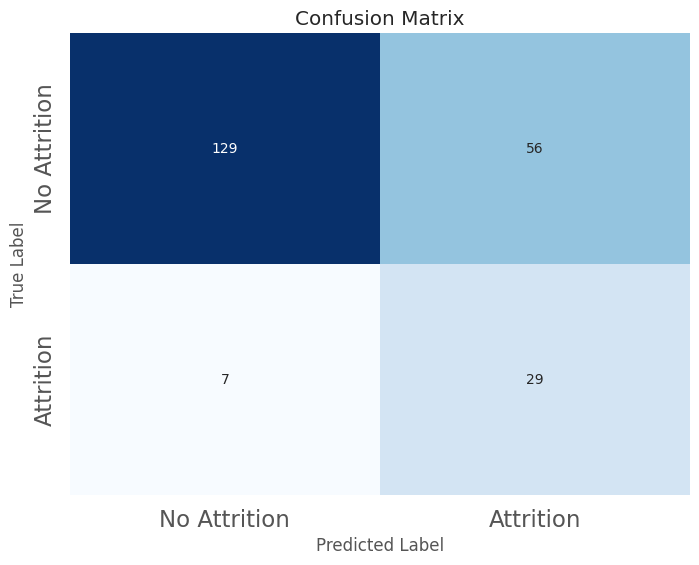

In [157]:
# Create confusion matrix
cm = confusion_matrix(y_test, y_pred_optimal_wgt)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks([0.5, 1.5], ['No Attrition', 'Attrition'])  # Adjust labels if needed
plt.yticks([0.5, 1.5], ['No Attrition', 'Attrition'])  # Adjust labels if needed
plt.show

### SMOTE

In [158]:
# Apply SMOTE to the training set
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

In [159]:
# Get class distribution counts after SMOTE
class_counts = y_train_smote.value_counts()
print(class_counts)

AttritionNum
0    863
1    863
Name: count, dtype: int64


In [160]:
# scale features
scaler = StandardScaler()
X_train_smote_scaled = scaler.fit_transform(X_train_smote)

model_smt = LogisticRegression(random_state=42)
model_smt.fit(X_train_smote_scaled, y_train_smote)

# Make predictions on the test set
y_pred_log_smt = model_smt.predict(X_val_scaled)

# Evaluate the model
print("Accuracy:", accuracy_score(y_val, y_pred_log_smt))
print("Precision:", precision_score(y_val, y_pred_log_smt))
print("Recall:", recall_score(y_val, y_pred_log_smt))
print("F1-score:", f1_score(y_val, y_pred_log_smt))
print('Area Under Curve:', roc_auc_score(y_val, y_pred_log_smt))
print("Confusion matrix:\n", confusion_matrix(y_val, y_pred_log_smt))
print(classification_report(y_val, y_pred_log_smt))

Accuracy: 0.33636363636363636
Precision: 0.1864406779661017
Recall: 0.9428571428571428
F1-score: 0.3113207547169811
Area Under Curve: 0.5822393822393822
Confusion matrix:
 [[ 41 144]
 [  2  33]]
              precision    recall  f1-score   support

           0       0.95      0.22      0.36       185
           1       0.19      0.94      0.31        35

    accuracy                           0.34       220
   macro avg       0.57      0.58      0.34       220
weighted avg       0.83      0.34      0.35       220



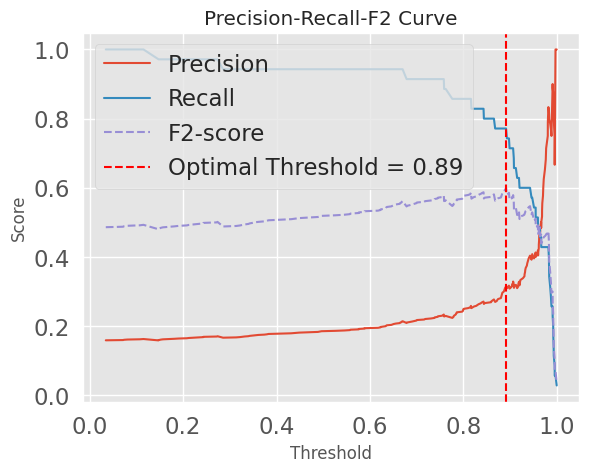

In [161]:
# adjusting the decision threshold
y_proba_smt = model_smt.predict_proba(X_val_scaled)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_val, y_proba_smt)

# Plot Precision, Recall, and F2-Score
f2_scores = (1 + 2**2) * (precision[:-1] * recall[:-1]) / (2**2 * precision[:-1] + recall[:-1])
optimal_threshold_smt = thresholds[np.argmax(f2_scores)]

plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.plot(thresholds, f2_scores, label="F2-score", linestyle='--')

plt.axvline(x=optimal_threshold_smt, color='r', linestyle='--', label=f'Optimal Threshold = {optimal_threshold_smt:.2f}')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.legend()
plt.title("Precision-Recall-F2 Curve")
plt.show()

In [162]:
# Get probabilities for the test set
y_proba_test_smt = model_smt.predict_proba(X_test_scaled)[:, 1]

# Apply the optimal threshold
y_pred_optimal_smt = (y_proba_test_smt >= optimal_threshold_smt).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_smt))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_smt))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_smt))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_smt))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_smt, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_smt))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_smt))
print(classification_report(y_test, y_pred_optimal_smt))

Accuracy (optimal threshold): 0.6742081447963801
Precision (optimal threshold): 0.30851063829787234
Recall (optimal threshold): 0.8055555555555556
F1-score (optimal threshold): 0.4461538461538462
F2-score (optimal threshold): 0.6092436974789915
Area Under Curve (optimal threshold): 0.7271021021021021
Confusion matrix (optimal threshold):
 [[120  65]
 [  7  29]]
              precision    recall  f1-score   support

           0       0.94      0.65      0.77       185
           1       0.31      0.81      0.45        36

    accuracy                           0.67       221
   macro avg       0.63      0.73      0.61       221
weighted avg       0.84      0.67      0.72       221



<function matplotlib.pyplot.show(close=None, block=None)>

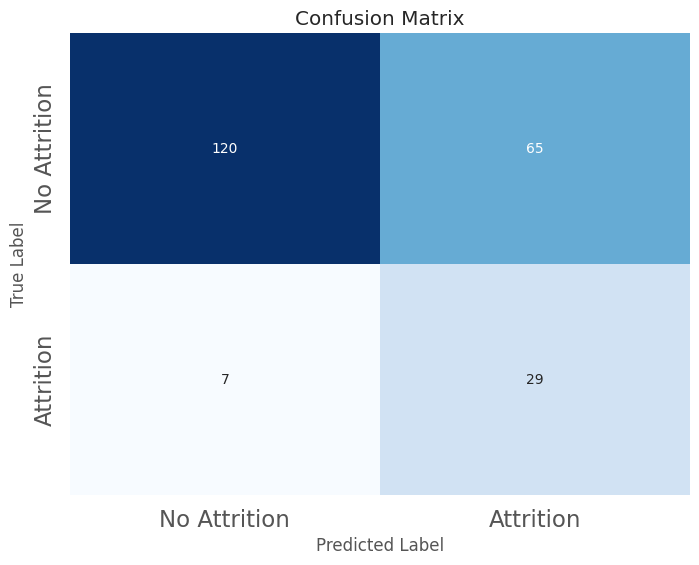

In [163]:
# Create confusion matrix
cm = confusion_matrix(y_test, y_pred_optimal_smt)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks([0.5, 1.5], ['No Attrition', 'Attrition'])  # Adjust labels if needed
plt.yticks([0.5, 1.5], ['No Attrition', 'Attrition'])  # Adjust labels if needed
plt.show

###Borderline-SMOTE

Borderline-SMOTE: Creates synthetic samples only for minority class instances near the decision boundary.

In [164]:
smote = BorderlineSMOTE(random_state=42, kind="borderline-1")  # or kind="borderline-2"
X_train_bsmote, y_train_bsmote = smote.fit_resample(X_train, y_train)

In [165]:
# scale features
scaler = StandardScaler()
X_train_bsmote_scaled = scaler.fit_transform(X_train_bsmote)

model_bsmt = LogisticRegression(class_weight='balanced', random_state=42)
model_bsmt.fit(X_train_bsmote_scaled, y_train_bsmote)
y_pred_log_bsmt = model_bsmt.predict(X_val_scaled)

# Evaluate the model
print("Accuracy:", accuracy_score(y_val, y_pred_log_bsmt))
print("Precision:", precision_score(y_val, y_pred_log_bsmt))
print("Recall:", recall_score(y_val, y_pred_log_bsmt))
print("F1-score:", f1_score(y_val, y_pred_log_bsmt))
print('Area Under Curve:', roc_auc_score(y_val, y_pred_log_bsmt))
print("Confusion matrix:\n", confusion_matrix(y_val, y_pred_log_bsmt))
print(classification_report(y_val, y_pred_log_bsmt))

Accuracy: 0.35
Precision: 0.1896551724137931
Recall: 0.9428571428571428
F1-score: 0.3157894736842105
Area Under Curve: 0.5903474903474903
Confusion matrix:
 [[ 44 141]
 [  2  33]]
              precision    recall  f1-score   support

           0       0.96      0.24      0.38       185
           1       0.19      0.94      0.32        35

    accuracy                           0.35       220
   macro avg       0.57      0.59      0.35       220
weighted avg       0.83      0.35      0.37       220



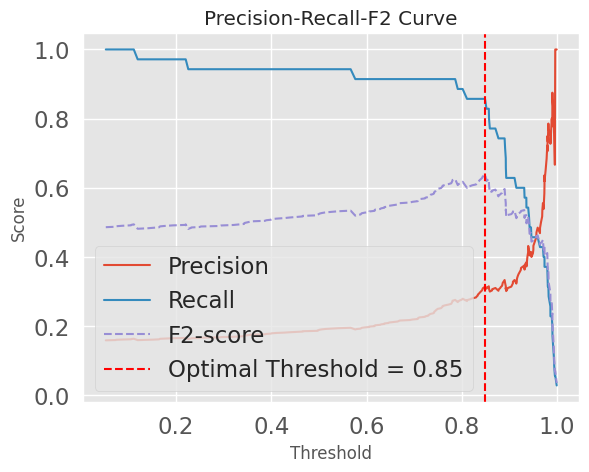

In [166]:
# adjusting the decision threshold
y_proba_bsmt = model_bsmt.predict_proba(X_val_scaled)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_val, y_proba_bsmt)

# Plot Precision, Recall, and F2-Score
f2_scores = (1 + 2**2) * (precision[:-1] * recall[:-1]) / (2**2 * precision[:-1] + recall[:-1])
optimal_threshold_bsmt = thresholds[np.argmax(f2_scores)]

plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.plot(thresholds, f2_scores, label="F2-score", linestyle='--')

plt.axvline(x=optimal_threshold_bsmt, color='r', linestyle='--', label=f'Optimal Threshold = {optimal_threshold_bsmt:.2f}')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.legend()
plt.title("Precision-Recall-F2 Curve")
plt.show()

In [167]:
# Get probabilities for the test set
y_proba_test_bsmt = model_smt.predict_proba(X_test_scaled)[:, 1]

# Apply the optimal threshold
y_pred_optimal_bsmt = (y_proba_test_bsmt >= optimal_threshold_bsmt).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_bsmt))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_bsmt))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_bsmt))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_bsmt))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_bsmt, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_bsmt))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_bsmt))
print(classification_report(y_test, y_pred_optimal_bsmt))

Accuracy (optimal threshold): 0.6199095022624435
Precision (optimal threshold): 0.2777777777777778
Recall (optimal threshold): 0.8333333333333334
F1-score (optimal threshold): 0.4166666666666667
F2-score (optimal threshold): 0.5952380952380952
Area Under Curve (optimal threshold): 0.7058558558558559
Confusion matrix (optimal threshold):
 [[107  78]
 [  6  30]]
              precision    recall  f1-score   support

           0       0.95      0.58      0.72       185
           1       0.28      0.83      0.42        36

    accuracy                           0.62       221
   macro avg       0.61      0.71      0.57       221
weighted avg       0.84      0.62      0.67       221



In [168]:
# Get probabilities for the test set
y_proba_test_bsmt = model_smt.predict_proba(X_test_scaled)[:, 1]

# Apply the optimal threshold
y_pred_optimal_bsmt = (y_proba_test_bsmt >= 0.93).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_bsmt))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_bsmt))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_bsmt))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_bsmt))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_bsmt, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_bsmt))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_bsmt))
print(classification_report(y_test, y_pred_optimal_bsmt))

Accuracy (optimal threshold): 0.7692307692307693
Precision (optimal threshold): 0.39436619718309857
Recall (optimal threshold): 0.7777777777777778
F1-score (optimal threshold): 0.5233644859813084
F2-score (optimal threshold): 0.6511627906976745
Area Under Curve (optimal threshold): 0.7726726726726726
Confusion matrix (optimal threshold):
 [[142  43]
 [  8  28]]
              precision    recall  f1-score   support

           0       0.95      0.77      0.85       185
           1       0.39      0.78      0.52        36

    accuracy                           0.77       221
   macro avg       0.67      0.77      0.69       221
weighted avg       0.86      0.77      0.79       221



<function matplotlib.pyplot.show(close=None, block=None)>

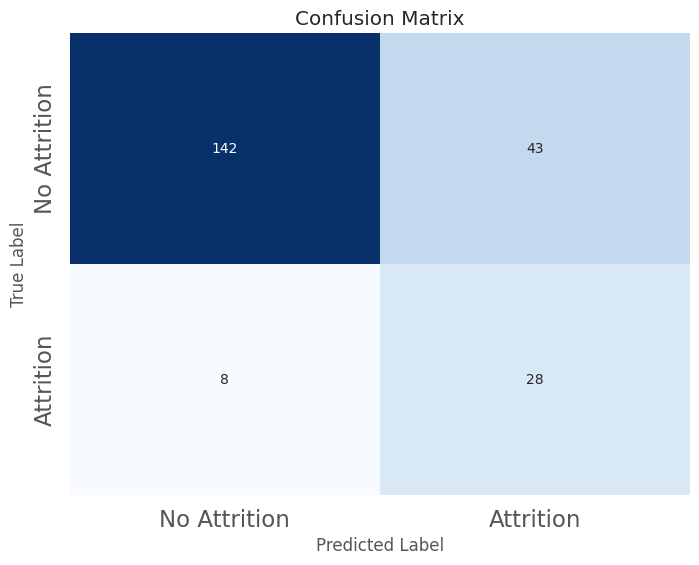

In [169]:
# Create confusion matrix
cm = confusion_matrix(y_test, y_pred_optimal_bsmt)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks([0.5, 1.5], ['No Attrition', 'Attrition'])  # Adjust labels if needed
plt.yticks([0.5, 1.5], ['No Attrition', 'Attrition'])  # Adjust labels if needed
plt.show

###ADAYSN

ADASYN (Adaptive Synthetic Sampling): Similar to SMOTE but focuses on creating synthetic samples near minority class samples that are harder to classify.

In [170]:
# Apply ADASYN
adasyn = ADASYN(random_state=42)
X_train_ada, y_train_ada = adasyn.fit_resample(X_train, y_train)

In [171]:
# scale features
scaler = StandardScaler()
X_train_ada_scaled = scaler.fit_transform(X_train_ada)

model_ada = LogisticRegression(class_weight='balanced', random_state=42)
model_ada.fit(X_train_ada_scaled, y_train_ada)
y_pred_log_ada = model_ada.predict(X_val_scaled)

# Evaluate the model
print("Accuracy:", accuracy_score(y_val, y_pred_log_ada))
print("Precision:", precision_score(y_val, y_pred_log_ada))
print("Recall:", recall_score(y_val, y_pred_log_ada))
print("F1-score:", f1_score(y_val, y_pred_log_ada))
print('Area Under Curve:', roc_auc_score(y_val, y_pred_log_ada))
print("Confusion matrix:\n", confusion_matrix(y_val, y_pred_log_ada))
print(classification_report(y_val, y_pred_log_ada))

Accuracy: 0.34545454545454546
Precision: 0.18857142857142858
Recall: 0.9428571428571428
F1-score: 0.3142857142857143
Area Under Curve: 0.5876447876447877
Confusion matrix:
 [[ 43 142]
 [  2  33]]
              precision    recall  f1-score   support

           0       0.96      0.23      0.37       185
           1       0.19      0.94      0.31        35

    accuracy                           0.35       220
   macro avg       0.57      0.59      0.34       220
weighted avg       0.83      0.35      0.36       220



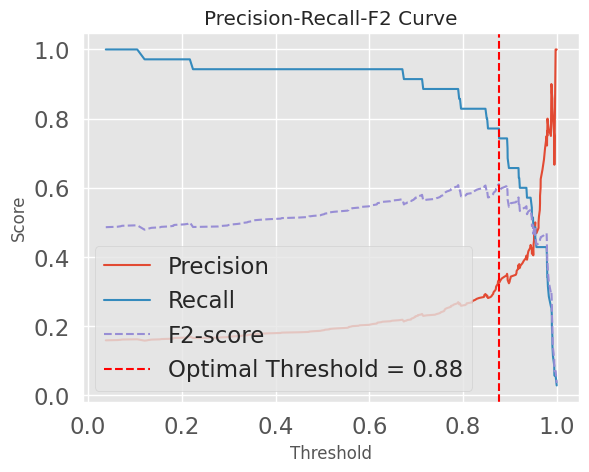

In [172]:
# adjusting the decision threshold
y_proba_ada = model_ada.predict_proba(X_val_scaled)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_val, y_proba_ada)

# Plot Precision, Recall, and F2-Score
f2_scores = (1 + 2**2) * (precision[:-1] * recall[:-1]) / (2**2 * precision[:-1] + recall[:-1])
optimal_threshold_ada = thresholds[np.argmax(f2_scores)]

plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.plot(thresholds, f2_scores, label="F2-score", linestyle='--')

plt.axvline(x=optimal_threshold_ada, color='r', linestyle='--', label=f'Optimal Threshold = {optimal_threshold_ada:.2f}')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.legend()
plt.title("Precision-Recall-F2 Curve")
plt.show()

In [173]:
# Get probabilities for the test set
y_proba_test_ada = model_ada.predict_proba(X_test_scaled)[:, 1]

# Apply the optimal threshold
y_pred_optimal_ada = (y_proba_test_ada >= optimal_threshold_ada).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_ada))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_ada))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_ada))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_ada))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_ada, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_ada))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_ada))
print(classification_report(y_test, y_pred_optimal_ada))

Accuracy (optimal threshold): 0.6832579185520362
Precision (optimal threshold): 0.31521739130434784
Recall (optimal threshold): 0.8055555555555556
F1-score (optimal threshold): 0.453125
F2-score (optimal threshold): 0.614406779661017
Area Under Curve (optimal threshold): 0.7325075075075075
Confusion matrix (optimal threshold):
 [[122  63]
 [  7  29]]
              precision    recall  f1-score   support

           0       0.95      0.66      0.78       185
           1       0.32      0.81      0.45        36

    accuracy                           0.68       221
   macro avg       0.63      0.73      0.62       221
weighted avg       0.84      0.68      0.72       221



In [174]:
# Get probabilities for the test set
y_proba_test_ada = model_ada.predict_proba(X_test_scaled)[:, 1]

# Apply the optimal threshold
y_pred_optimal_ada = (y_proba_test_ada >= 0.93).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_ada))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_ada))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_ada))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_ada))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_ada, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_ada))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_ada))
print(classification_report(y_test, y_pred_optimal_ada))

Accuracy (optimal threshold): 0.7737556561085973
Precision (optimal threshold): 0.39705882352941174
Recall (optimal threshold): 0.75
F1-score (optimal threshold): 0.5192307692307693
F2-score (optimal threshold): 0.6367924528301887
Area Under Curve (optimal threshold): 0.7641891891891892
Confusion matrix (optimal threshold):
 [[144  41]
 [  9  27]]
              precision    recall  f1-score   support

           0       0.94      0.78      0.85       185
           1       0.40      0.75      0.52        36

    accuracy                           0.77       221
   macro avg       0.67      0.76      0.69       221
weighted avg       0.85      0.77      0.80       221



###Comparing Regression Models



In [175]:
print('Weighted LogReg OptDecThresh')
print(classification_report(y_test, y_pred_optimal_wgt))
print('SMOTE LogReg OptDecThresh')
print(classification_report(y_test, y_pred_optimal_smt))
print('B-SMOTE LogReg OptDecThresh')
print(classification_report(y_test, y_pred_optimal_bsmt))
print('ADASYN LogReg OptDecThresh')
print(classification_report(y_test, y_pred_optimal_ada))

Weighted LogReg OptDecThresh
              precision    recall  f1-score   support

           0       0.95      0.70      0.80       185
           1       0.34      0.81      0.48        36

    accuracy                           0.71       221
   macro avg       0.64      0.75      0.64       221
weighted avg       0.85      0.71      0.75       221

SMOTE LogReg OptDecThresh
              precision    recall  f1-score   support

           0       0.94      0.65      0.77       185
           1       0.31      0.81      0.45        36

    accuracy                           0.67       221
   macro avg       0.63      0.73      0.61       221
weighted avg       0.84      0.67      0.72       221

B-SMOTE LogReg OptDecThresh
              precision    recall  f1-score   support

           0       0.95      0.77      0.85       185
           1       0.39      0.78      0.52        36

    accuracy                           0.77       221
   macro avg       0.67      0.77      0.69  

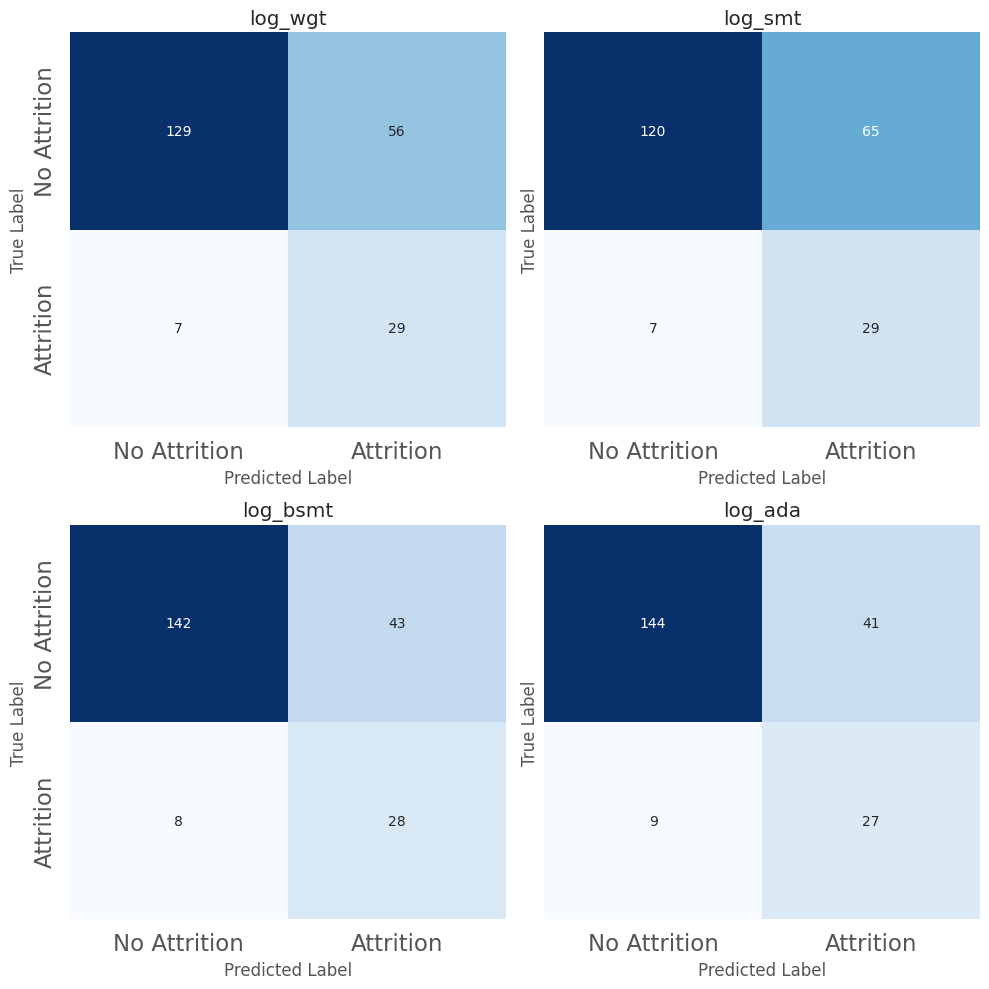

In [176]:
# Store predictions in a dictionary for easier access
predictions = {
    'log_wgt': y_pred_optimal_wgt,
    'log_smt': y_pred_optimal_smt,
    'log_bsmt': y_pred_optimal_bsmt,
    'log_ada': y_pred_optimal_ada,
}

# Create figure and axes for the 2x2 facet grid
fig, axes = plt.subplots(2, 2, figsize=(10, 10), sharey=True)  # 2 rows, 2 columns

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate through models and plot confusion matrices
for i, (model_name, y_pred) in enumerate(predictions.items()):
    cm = confusion_matrix(y_test, y_pred)  # Calculate confusion matrix using y_test and current model's predictions
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=axes[i])  # Plot heatmap
    axes[i].set_title(model_name)  # Set subplot title
    axes[i].set_xlabel('Predicted Label')  # Set x-axis label
    axes[i].set_ylabel('True Label')  # Set y-axis label
    axes[i].set_xticklabels(['No Attrition', 'Attrition'])
    axes[i].set_yticklabels(['No Attrition', 'Attrition'])

plt.tight_layout()  # Adjust subplot spacing
plt.show()  # Display the plot

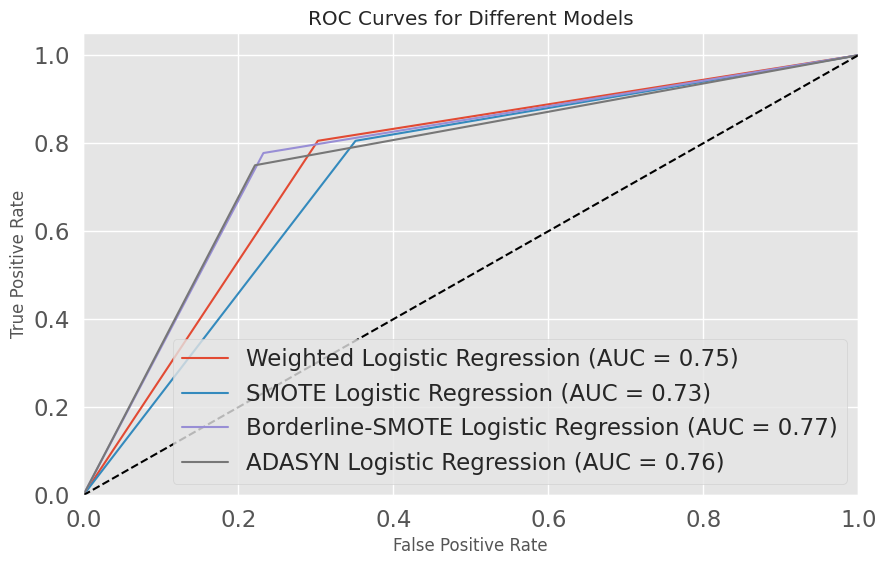

In [177]:
models = {
    'Weighted Logistic Regression': y_pred_optimal_wgt,
    'SMOTE Logistic Regression': y_pred_optimal_smt,
    'Borderline-SMOTE Logistic Regression': y_pred_optimal_bsmt,
    'ADASYN Logistic Regression': y_pred_optimal_ada
}

plt.figure(figsize=(10, 6))

for model_name, y_pred in models.items():
  fpr, tpr, thresholds = roc_curve(y_test, y_pred)
  roc_auc = roc_auc_score(y_test, y_pred)
  plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Different Models')
plt.legend(loc="lower right")
plt.show()

###Model Selection

**Weighted Logistic Regression:**

AUC comparable to SMOTE Logisitc Regression and lower compared to B-SMOTE and ADASYN Logistic Regression, indicates a reasonable ability to distinguish between classes. Precision for the minority class moderately low, indicating a higher rate of false positives compared to other models. Recall is the highest among the models, meaning that false negatives are handled effectively.

**SMOTE Logistic Regression:**

AUC indicates a reasonable ability to distinguish between classes.
Precision for the minority class is moderate and higher than for weighted logisitc regression, resulting in a lower number of false positives. High recall for the minority class, comparably lower than for weighted logistic regression, but still capturing most attrition cases.

**B-SMOTE Logistic Regression:**

AUC slightly higher compared to all other models, indicating slightly better ability to distinguish between classes. Precision is second highest of all models, resulting in a reduction of false positives. Recall is lower compared to SMOTE and Weighted Logistic Regression, still, the model minimizes false negatives effectively.

**ADASYN Logistic Regression:**

AUC is slightly lower compared to B-SMOTE Logistic Regression. Precision is the highest among all models, leading to the lowest number of false positives. Recall is lowest of all models, but identification of attrition cases is still handled effectively.

**Decision:**

For a practical approach that prioritizes the reduction of false negatives (i.e., missing attrition cases), while not producing too many false positives (i.e., misslabeling non-attrition as attrition cases), ADASYN Logistic Regression provides the most favorable trade-offs.

## Random Forest

In [178]:
# Define parameter grid
param_grid = {
    'n_estimators': [100, 200, 500],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2'],
    'class_weight': ['balanced', {0: 1, 1: 3}, {0: 1, 1: 5}]
}

# Initialize Random Forest
rf = RandomForestClassifier(random_state=42)

# Perform Randomized Search
rf_random = RandomizedSearchCV(estimator=rf, param_distributions=param_grid,
                               scoring='f1', n_iter=50, cv=3, random_state=42, n_jobs=-1)
rf_random.fit(X_train, y_train)

# Get best model
best_rf = rf_random.best_estimator_
print("Best Parameters:", rf_random.best_params_)

Best Parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'log2', 'max_depth': None, 'class_weight': 'balanced'}


In [179]:
# Initialize the optimized Random Forest model with the best parameters
best_rf = RandomForestClassifier(
    n_estimators=100,
    min_samples_split=5,
    min_samples_leaf=4,
    max_features='log2',
    max_depth= None,
    class_weight = 'balanced',
    random_state=42
)

### Random Forest

In [180]:
# Fit the model to the training data
best_rf.fit(X_train, y_train)

y_pred_rf = best_rf.predict(X_val)
print("Confusion Matrix:\n", confusion_matrix(y_val, y_pred_rf))
print("\nClassification Report:\n", classification_report(y_val, y_pred_rf))

Confusion Matrix:
 [[174  11]
 [ 25  10]]

Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.94      0.91       185
           1       0.48      0.29      0.36        35

    accuracy                           0.84       220
   macro avg       0.68      0.61      0.63       220
weighted avg       0.81      0.84      0.82       220



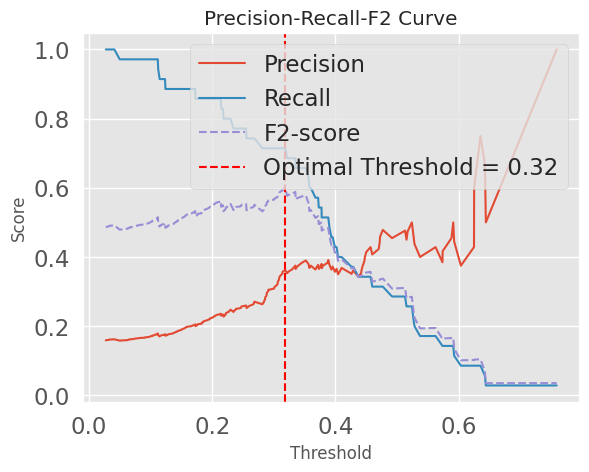

In [181]:
# adjusting the decision threshold
y_proba_rf = best_rf.predict_proba(X_val)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_val, y_proba_rf)

# Plot Precision, Recall, and F2-Score
f2_scores = (1 + 2**2) * (precision[:-1] * recall[:-1]) / (2**2 * precision[:-1] + recall[:-1])
optimal_threshold_rf = thresholds[np.argmax(f2_scores)]

plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.plot(thresholds, f2_scores, label="F2-score", linestyle='--')

plt.axvline(x=optimal_threshold_rf, color='r', linestyle='--', label=f'Optimal Threshold = {optimal_threshold_rf:.2f}')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.legend()
plt.title("Precision-Recall-F2 Curve")
plt.show()

In [182]:
# Get probabilities for the test set
y_proba_test_rf = best_rf.predict_proba(X_test)[:, 1]

# Apply the optimal threshold
y_pred_optimal_rf = (y_proba_test_rf >= optimal_threshold_rf).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_rf))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_rf))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_rf))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_rf))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_rf, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_rf))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_rf))
print(classification_report(y_test, y_pred_optimal_rf))

Accuracy (optimal threshold): 0.7420814479638009
Precision (optimal threshold): 0.352112676056338
Recall (optimal threshold): 0.6944444444444444
F1-score (optimal threshold): 0.4672897196261682
F2-score (optimal threshold): 0.5813953488372093
Area Under Curve (optimal threshold): 0.7228978978978978
Confusion matrix (optimal threshold):
 [[139  46]
 [ 11  25]]
              precision    recall  f1-score   support

           0       0.93      0.75      0.83       185
           1       0.35      0.69      0.47        36

    accuracy                           0.74       221
   macro avg       0.64      0.72      0.65       221
weighted avg       0.83      0.74      0.77       221



In [183]:
# Get probabilities for the test set
y_proba_test_rf = best_rf.predict_proba(X_test)[:, 1]

# Apply the optimal threshold
y_pred_optimal_rf = (y_proba_test_rf >= 0.36).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_rf))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_rf))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_rf))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_rf))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_rf, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_rf))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_rf))
print(classification_report(y_test, y_pred_optimal_rf))

Accuracy (optimal threshold): 0.8009049773755657
Precision (optimal threshold): 0.42592592592592593
Recall (optimal threshold): 0.6388888888888888
F1-score (optimal threshold): 0.5111111111111111
F2-score (optimal threshold): 0.5808080808080808
Area Under Curve (optimal threshold): 0.7356606606606606
Confusion matrix (optimal threshold):
 [[154  31]
 [ 13  23]]
              precision    recall  f1-score   support

           0       0.92      0.83      0.88       185
           1       0.43      0.64      0.51        36

    accuracy                           0.80       221
   macro avg       0.67      0.74      0.69       221
weighted avg       0.84      0.80      0.82       221



### SMOTE Random Forest

In [184]:
# Fit the model to the training data
best_rf_smt = best_rf.fit(X_train_smote, y_train_smote)

y_pred_rf_smote = best_rf_smt.predict(X_val)
print("Confusion Matrix:\n", confusion_matrix(y_val, y_pred_rf_smote))
print("\nClassification Report:\n", classification_report(y_val, y_pred_rf_smote))

Confusion Matrix:
 [[177   8]
 [ 27   8]]

Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.96      0.91       185
           1       0.50      0.23      0.31        35

    accuracy                           0.84       220
   macro avg       0.68      0.59      0.61       220
weighted avg       0.81      0.84      0.82       220



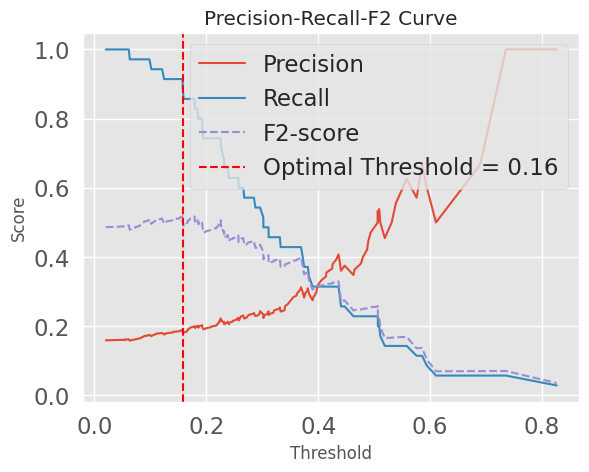

In [185]:
# adjusting the decision threshold
y_proba_rf_smt = best_rf_smt.predict_proba(X_val)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_val, y_proba_rf_smt)

# Plot Precision, Recall, and F2-Score
f2_scores = (1 + 2**2) * (precision[:-1] * recall[:-1]) / (2**2 * precision[:-1] + recall[:-1])
optimal_threshold_rf_smt = thresholds[np.argmax(f2_scores)]

plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.plot(thresholds, f2_scores, label="F2-score", linestyle='--')

plt.axvline(x=optimal_threshold_rf_smt, color='r', linestyle='--', label=f'Optimal Threshold = {optimal_threshold_rf_smt:.2f}')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.legend()
plt.title("Precision-Recall-F2 Curve")
plt.show()

In [186]:
# Get probabilities for the test set
y_proba_test_rf_smt = best_rf_smt.predict_proba(X_test)[:, 1]

# Apply the optimal threshold
y_pred_optimal_rf_smt = (y_proba_test_rf_smt >= optimal_threshold_rf_smt).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_rf_smt))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_rf_smt))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_rf_smt))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_rf_smt))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_rf_smt, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_rf_smt))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_rf_smt))
print(classification_report(y_test, y_pred_optimal_rf_smt))

Accuracy (optimal threshold): 0.4072398190045249
Precision (optimal threshold): 0.20496894409937888
Recall (optimal threshold): 0.9166666666666666
F1-score (optimal threshold): 0.3350253807106599
F2-score (optimal threshold): 0.5409836065573771
Area Under Curve (optimal threshold): 0.6123873873873873
Confusion matrix (optimal threshold):
 [[ 57 128]
 [  3  33]]
              precision    recall  f1-score   support

           0       0.95      0.31      0.47       185
           1       0.20      0.92      0.34        36

    accuracy                           0.41       221
   macro avg       0.58      0.61      0.40       221
weighted avg       0.83      0.41      0.44       221



In [187]:
# Get probabilities for the test set
y_proba_test_rf_smt = best_rf_smt.predict_proba(X_test)[:, 1]

# Apply the optimal threshold
y_pred_optimal_rf_smt = (y_proba_test_rf_smt >= 0.28).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_rf_smt))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_rf_smt))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_rf_smt))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_rf_smt))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_rf_smt, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_rf_smt))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_rf_smt))
print(classification_report(y_test, y_pred_optimal_rf_smt))

Accuracy (optimal threshold): 0.6561085972850679
Precision (optimal threshold): 0.2916666666666667
Recall (optimal threshold): 0.7777777777777778
F1-score (optimal threshold): 0.42424242424242425
F2-score (optimal threshold): 0.5833333333333334
Area Under Curve (optimal threshold): 0.705105105105105
Confusion matrix (optimal threshold):
 [[117  68]
 [  8  28]]
              precision    recall  f1-score   support

           0       0.94      0.63      0.75       185
           1       0.29      0.78      0.42        36

    accuracy                           0.66       221
   macro avg       0.61      0.71      0.59       221
weighted avg       0.83      0.66      0.70       221



### B-SMOTE Random Forest

In [188]:
# Fit the model to the training data
best_rf_bsmt = best_rf.fit(X_train_bsmote, y_train_bsmote)

y_pred_rf_bsmote = best_rf_bsmt.predict(X_test)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rf_bsmote))
print("\nClassification Report:\n", classification_report(y_test, y_pred_rf_bsmote))

Confusion Matrix:
 [[177   8]
 [ 23  13]]

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.96      0.92       185
           1       0.62      0.36      0.46        36

    accuracy                           0.86       221
   macro avg       0.75      0.66      0.69       221
weighted avg       0.84      0.86      0.84       221



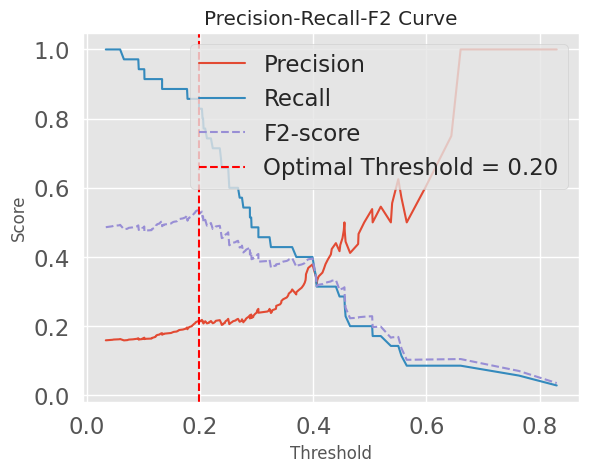

In [189]:
# adjusting the decision threshold
y_proba_rf_bsmt = best_rf_bsmt.predict_proba(X_val)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_val, y_proba_rf_bsmt)

# Plot Precision, Recall, and F2-Score
f2_scores = (1 + 2**2) * (precision[:-1] * recall[:-1]) / (2**2 * precision[:-1] + recall[:-1])
optimal_threshold_rf_bsmt = thresholds[np.argmax(f2_scores)]

plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.plot(thresholds, f2_scores, label="F2-score", linestyle='--')

plt.axvline(x=optimal_threshold_rf_bsmt, color='r', linestyle='--', label=f'Optimal Threshold = {optimal_threshold_rf_bsmt:.2f}')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.legend()
plt.title("Precision-Recall-F2 Curve")
plt.show()

In [190]:
# Get probabilities for the test set
y_proba_test_rf_bsmt = best_rf_bsmt.predict_proba(X_test)[:, 1]

# Apply the optimal threshold
y_pred_optimal_rf_bsmt = (y_proba_test_rf_bsmt >= optimal_threshold_rf_bsmt).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_rf_bsmt))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_rf_bsmt))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_rf_bsmt))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_rf_bsmt))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_rf_bsmt, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_rf_bsmt))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_rf_bsmt))
print(classification_report(y_test, y_pred_optimal_rf_bsmt))

Accuracy (optimal threshold): 0.5294117647058824
Precision (optimal threshold): 0.23846153846153847
Recall (optimal threshold): 0.8611111111111112
F1-score (optimal threshold): 0.37349397590361444
F2-score (optimal threshold): 0.5656934306569343
Area Under Curve (optimal threshold): 0.6629879879879881
Confusion matrix (optimal threshold):
 [[86 99]
 [ 5 31]]
              precision    recall  f1-score   support

           0       0.95      0.46      0.62       185
           1       0.24      0.86      0.37        36

    accuracy                           0.53       221
   macro avg       0.59      0.66      0.50       221
weighted avg       0.83      0.53      0.58       221



In [191]:
# Get probabilities for the test set
y_proba_test_rf_bsmt = best_rf_bsmt.predict_proba(X_test)[:, 1]

# Apply the optimal threshold
y_pred_optimal_rf_bsmt = (y_proba_test_rf_bsmt >= 0.28).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_rf_bsmt))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_rf_bsmt))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_rf_bsmt))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_rf_bsmt))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_rf_bsmt, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_rf_bsmt))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_rf_bsmt))
print(classification_report(y_test, y_pred_optimal_rf_bsmt))

Accuracy (optimal threshold): 0.7058823529411765
Precision (optimal threshold): 0.32941176470588235
Recall (optimal threshold): 0.7777777777777778
F1-score (optimal threshold): 0.4628099173553719
F2-score (optimal threshold): 0.611353711790393
Area Under Curve (optimal threshold): 0.7348348348348348
Confusion matrix (optimal threshold):
 [[128  57]
 [  8  28]]
              precision    recall  f1-score   support

           0       0.94      0.69      0.80       185
           1       0.33      0.78      0.46        36

    accuracy                           0.71       221
   macro avg       0.64      0.73      0.63       221
weighted avg       0.84      0.71      0.74       221



### ADASYN Random Forest

In [192]:
# Fit the model to the training data
best_rf_ada = best_rf.fit(X_train_ada, y_train_ada)

y_pred_rf_ada = best_rf_ada.predict(X_val)
print("Confusion Matrix:\n", confusion_matrix(y_val, y_pred_rf_ada))
print("\nClassification Report:\n", classification_report(y_val, y_pred_rf_ada))

Confusion Matrix:
 [[179   6]
 [ 28   7]]

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.97      0.91       185
           1       0.54      0.20      0.29        35

    accuracy                           0.85       220
   macro avg       0.70      0.58      0.60       220
weighted avg       0.81      0.85      0.81       220



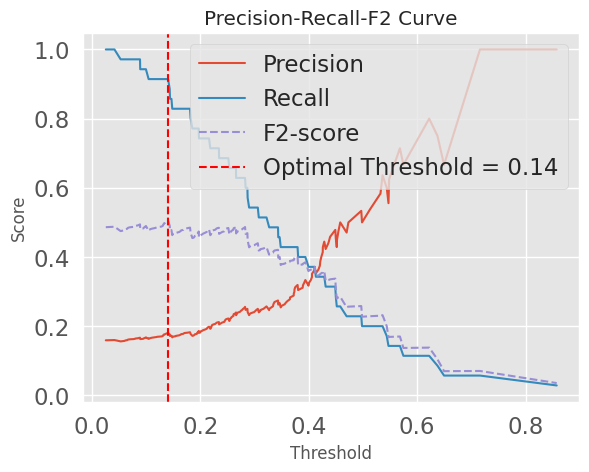

In [193]:
# adjusting the decision threshold
y_proba_rf_ada = best_rf_ada.predict_proba(X_val)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_val, y_proba_rf_ada)

# Plot Precision, Recall, and F2-Score
f2_scores = (1 + 2**2) * (precision[:-1] * recall[:-1]) / (2**2 * precision[:-1] + recall[:-1])
optimal_threshold_rf_ada = thresholds[np.argmax(f2_scores)]

plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.plot(thresholds, f2_scores, label="F2-score", linestyle='--')

plt.axvline(x=optimal_threshold_rf_ada, color='r', linestyle='--', label=f'Optimal Threshold = {optimal_threshold_rf_ada:.2f}')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.legend()
plt.title("Precision-Recall-F2 Curve")
plt.show()

In [194]:
# Get probabilities for the test set
y_proba_test_rf_ada = best_rf_ada.predict_proba(X_test)[:, 1]

# Apply the optimal threshold
y_pred_optimal_rf_ada = (y_proba_test_rf_ada >= optimal_threshold_rf_ada).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_rf_ada))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_rf_ada))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_rf_ada))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_rf_ada))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_rf_ada, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_rf_ada))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_rf_ada))
print(classification_report(y_test, y_pred_optimal_rf_ada))

Accuracy (optimal threshold): 0.34841628959276016
Precision (optimal threshold): 0.19318181818181818
Recall (optimal threshold): 0.9444444444444444
F1-score (optimal threshold): 0.32075471698113206
F2-score (optimal threshold): 0.53125
Area Under Curve (optimal threshold): 0.5884384384384385
Confusion matrix (optimal threshold):
 [[ 43 142]
 [  2  34]]
              precision    recall  f1-score   support

           0       0.96      0.23      0.37       185
           1       0.19      0.94      0.32        36

    accuracy                           0.35       221
   macro avg       0.57      0.59      0.35       221
weighted avg       0.83      0.35      0.37       221



In [195]:
# Get probabilities for the test set
y_proba_test_rf_ada = best_rf_ada.predict_proba(X_test)[:, 1]

# Apply the optimal threshold
y_pred_optimal_rf_ada = (y_proba_test_rf_ada >= .28).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_rf_ada))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_rf_ada))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_rf_ada))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_rf_ada))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_rf_ada, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_rf_ada))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_rf_ada))
print(classification_report(y_test, y_pred_optimal_rf_ada))

Accuracy (optimal threshold): 0.6968325791855203
Precision (optimal threshold): 0.3218390804597701
Recall (optimal threshold): 0.7777777777777778
F1-score (optimal threshold): 0.45528455284552843
F2-score (optimal threshold): 0.6060606060606061
Area Under Curve (optimal threshold): 0.7294294294294293
Confusion matrix (optimal threshold):
 [[126  59]
 [  8  28]]
              precision    recall  f1-score   support

           0       0.94      0.68      0.79       185
           1       0.32      0.78      0.46        36

    accuracy                           0.70       221
   macro avg       0.63      0.73      0.62       221
weighted avg       0.84      0.70      0.74       221



###Comparing Random Forest Models


In [196]:
print('Random Forest',classification_report(y_test, y_pred_optimal_rf))
print('SMOTE Random Forest',classification_report(y_test, y_pred_optimal_rf_smt))
print('B-SMOTE Random Forest',classification_report(y_test, y_pred_optimal_rf_bsmt))
print('ADASYN Random Forest',classification_report(y_test, y_pred_optimal_rf_ada))

Random Forest               precision    recall  f1-score   support

           0       0.92      0.83      0.88       185
           1       0.43      0.64      0.51        36

    accuracy                           0.80       221
   macro avg       0.67      0.74      0.69       221
weighted avg       0.84      0.80      0.82       221

SMOTE Random Forest               precision    recall  f1-score   support

           0       0.94      0.63      0.75       185
           1       0.29      0.78      0.42        36

    accuracy                           0.66       221
   macro avg       0.61      0.71      0.59       221
weighted avg       0.83      0.66      0.70       221

B-SMOTE Random Forest               precision    recall  f1-score   support

           0       0.94      0.69      0.80       185
           1       0.33      0.78      0.46        36

    accuracy                           0.71       221
   macro avg       0.64      0.73      0.63       221
weighted avg      

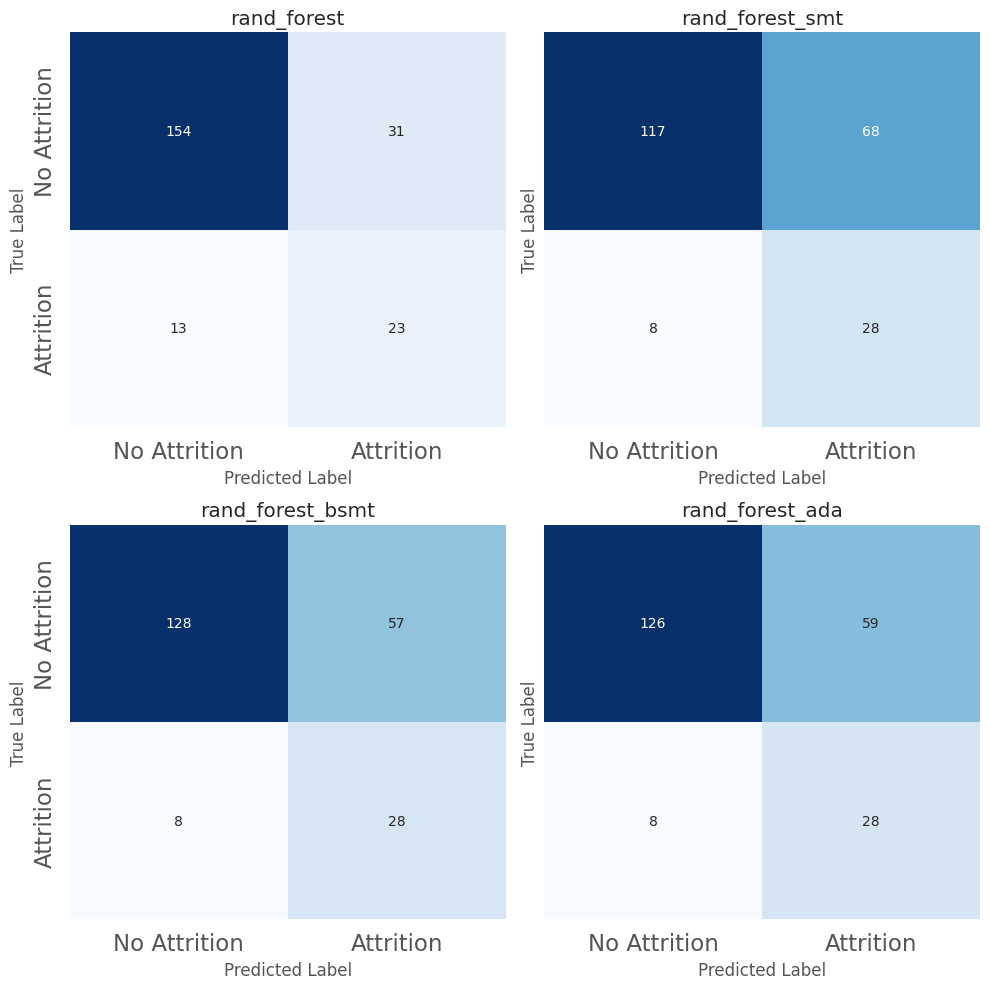

In [197]:
# Store predictions in a dictionary for easier access
predictions = {
    'rand_forest': y_pred_optimal_rf,
    'rand_forest_smt': y_pred_optimal_rf_smt,
    'rand_forest_bsmt': y_pred_optimal_rf_bsmt,
    'rand_forest_ada': y_pred_optimal_rf_ada,
}

# Create figure and axes for the 2x2 facet grid
fig, axes = plt.subplots(2, 2, figsize=(10, 10), sharey=True)  # 2 rows, 2 columns

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate through models and plot confusion matrices
for i, (model_name, y_pred) in enumerate(predictions.items()):
    cm = confusion_matrix(y_test, y_pred)  # Calculate confusion matrix using y_test and current model's predictions
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=axes[i])  # Plot heatmap
    axes[i].set_title(model_name)  # Set subplot title
    axes[i].set_xlabel('Predicted Label')  # Set x-axis label
    axes[i].set_ylabel('True Label')  # Set y-axis label
    axes[i].set_xticklabels(['No Attrition', 'Attrition'])
    axes[i].set_yticklabels(['No Attrition', 'Attrition'])

plt.tight_layout()  # Adjust subplot spacing
plt.show()  # Display the plot

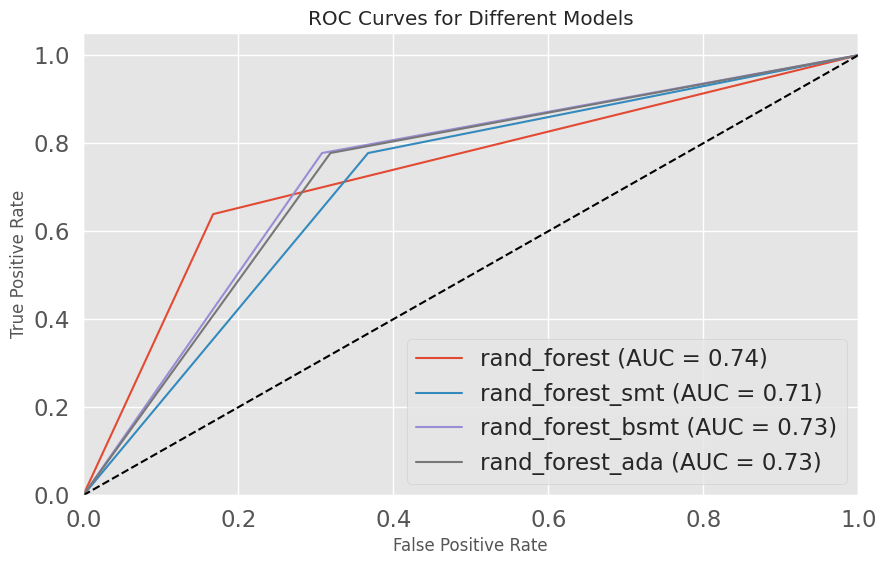

In [198]:
models = {
    'rand_forest': y_pred_optimal_rf,
    'rand_forest_smt': y_pred_optimal_rf_smt,
    'rand_forest_bsmt': y_pred_optimal_rf_bsmt,
    'rand_forest_ada': y_pred_optimal_rf_ada,
}

plt.figure(figsize=(10, 6))

for model_name, y_pred in models.items():
  fpr, tpr, thresholds = roc_curve(y_test, y_pred)
  roc_auc = roc_auc_score(y_test, y_pred)
  plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Different Models')
plt.legend(loc="lower right")
plt.show()

###Model Selection

**Random Forest:**

Highest AUC suggests the best ability to distinguish between attrition and non-attrition cases compared to other random forest models. The model shows highest precision for attrition cases, indicating less false positives in minority class predictions compared to the other models. It achieves a good recall for attrition cases, although lower compared to SMOTE and ADASYN Random Forest, minimizing false negatives less well.

**SMOTE Random Forest:**

Comparable AUC to SMOTE and ADASYN Random Forest and slightly lower compared to the base model, suggesting marginally weaker discrimination power. The minority class precision is slightly lower than the base model, increasing false positives. Recall for attrition cases is slightly better compared to base model, reducing false negatives.

**B-SMOTE Random Forest:**

Same metrics as SMOTE Random Forest.

**ADASYN Random Forest:**

Same metrics as SMOTE Random Forest.

**Decision:**

The SMOTE Random Forest Model offers the most practical solution. It provides a reasonable balance between precision and recall, minimizing false negatives effectively while maintaining a strong overall AUC. Reducing false negatives remains the primary objective, so this model is the best choice while maintaining acceptable performance metrics for generalizability. (Since all oversampling models perform equally well, SMOTE is chosen for its simpler approach to generating synthetic samples.)

## Gradient Boosting

### CatBoost

In [199]:
# Select Key Features
df_boost = df.iloc[:, 0:29]

df_boost = df_boost.drop(columns = ['Attrition','JobLevel','TotalWorkingYears','YearsAtCompany','PerformanceRating', 'YearsInCurrentRole'])

df.info()
df_boost.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 61 columns):
 #   Column                             Non-Null Count  Dtype   
---  ------                             --------------  -----   
 0   Age                                1470 non-null   int64   
 1   Attrition                          1470 non-null   object  
 2   BusinessTravel                     1470 non-null   object  
 3   Department                         1470 non-null   object  
 4   DistanceFromHome                   1470 non-null   int64   
 5   Education                          1470 non-null   int64   
 6   EducationField                     1470 non-null   object  
 7   EnvironmentSatisfaction            1470 non-null   int64   
 8   Gender                             1470 non-null   object  
 9   JobInvolvement                     1470 non-null   int64   
 10  JobLevel                           1470 non-null   int64   
 11  JobRole                            1470 non

In [200]:
!pip install catboost

In [201]:
# features and target
features = [col for col in df_boost.columns if col not in ['AttritionNum']]
X = df_boost[features]

# Target variable
y = df_boost['AttritionNum']

# Split data into train, validation and test sets
X_train, X_temp, y_train, y_temp = train_test_split(x, y, test_size=0.3, random_state=42, stratify=y)  # 70% train, 30% temp
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp) # 15% validation, 15% test


# Identify categorical features by their column indices
categorical_features = [index for index, dtype in enumerate(X.dtypes) if dtype in ['object', 'category']]

print(categorical_features)
print(X.info())

[1, 2, 5, 7, 9, 11, 14]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   BusinessTravel            1470 non-null   object
 2   Department                1470 non-null   object
 3   DistanceFromHome          1470 non-null   int64 
 4   Education                 1470 non-null   int64 
 5   EducationField            1470 non-null   object
 6   EnvironmentSatisfaction   1470 non-null   int64 
 7   Gender                    1470 non-null   object
 8   JobInvolvement            1470 non-null   int64 
 9   JobRole                   1470 non-null   object
 10  JobSatisfaction           1470 non-null   int64 
 11  MaritalStatus             1470 non-null   object
 12  MonthlyIncome             1470 non-null   int64 
 13  NumCompaniesWorked        1470 non-null   int64 
 14  

In [202]:
param_grid = {
    'depth': [4, 6, 8],
    'learning_rate': [0.01, 0.1],
    'iterations': [500, 1000]
}

model = CatBoostClassifier(cat_features=categorical_features, loss_function='Logloss')

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='roc_auc', cv=3)
grid_search.fit(X_train, y_train)
print(grid_search.best_params_)

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
1:	learn: 0.6806490	total: 11.5ms	remaining: 5.74s
2:	learn: 0.6729618	total: 31.4ms	remaining: 10.4s
3:	learn: 0.6664411	total: 35.1ms	remaining: 8.75s
4:	learn: 0.6603151	total: 39.1ms	remaining: 7.79s
5:	learn: 0.6538511	total: 46.4ms	remaining: 7.68s
6:	learn: 0.6467984	total: 53.6ms	remaining: 7.6s
7:	learn: 0.6420680	total: 56.8ms	remaining: 7.04s
8:	learn: 0.6373414	total: 58.8ms	remaining: 6.48s
9:	learn: 0.6310862	total: 63.9ms	remaining: 6.32s
10:	learn: 0.6267043	total: 65.3ms	remaining: 5.87s
11:	learn: 0.6215805	total: 67.7ms	remaining: 5.57s
12:	learn: 0.6172144	total: 72.9ms	remaining: 5.54s
13:	learn: 0.6131271	total: 74.8ms	remaining: 5.27s
14:	learn: 0.6070224	total: 87.3ms	remaining: 5.73s
15:	learn: 0.6028361	total: 92.2ms	remaining: 5.67s
16:	learn: 0.5990137	total: 94.6ms	remaining: 5.47s
17:	learn: 0.5929779	total: 105ms	remaining: 5.74s
18:	learn: 0.5879760	total: 109ms	remaining: 5.64s
19:	learn

In [204]:
# Initialize CatBoostClassifier
model_cat = CatBoostClassifier(
    iterations=1000,                  # Number of trees
    learning_rate=0.1,               # Step size
    depth=6,                         # Depth of trees
    cat_features=categorical_features,  # Specify categorical features
    loss_function='Logloss',         # Loss function for binary classification
    eval_metric='AUC',
    class_weights=[1, 7],  # imbalance_ratio = #negatives / #positives
    random_seed=42,
    verbose=100                      # Log progress every 100 iterations
)

# Train the model
model_cat.fit(X_train, y_train, eval_set=(X_val, y_val), early_stopping_rounds=50)

0:	test: 0.6006178	best: 0.6006178 (0)	total: 14.1ms	remaining: 14.1s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.7386872587
bestIteration = 17

Shrink model to first 18 iterations.


In [205]:
# Predictions
y_pred_cat = model_cat.predict(X_val)
y_proba_cat = model_cat.predict_proba(X_val)[:, 1]

# Evaluate
print("Confusion Matrix:\n", confusion_matrix(y_val, y_pred_cat))
print(classification_report(y_val, y_pred_cat))

Confusion Matrix:
 [[124  61]
 [  8  27]]
              precision    recall  f1-score   support

           0       0.94      0.67      0.78       185
           1       0.31      0.77      0.44        35

    accuracy                           0.69       220
   macro avg       0.62      0.72      0.61       220
weighted avg       0.84      0.69      0.73       220



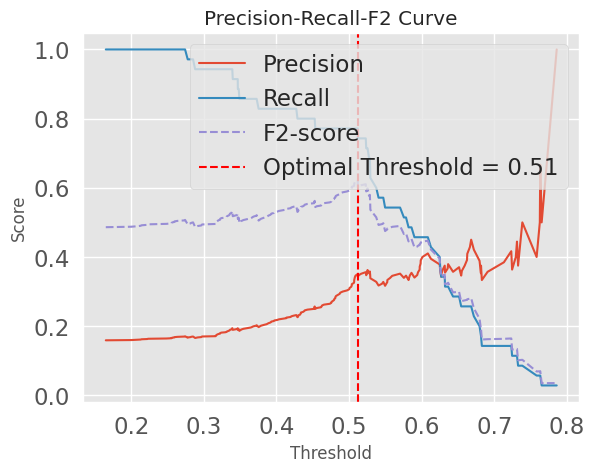

In [206]:
# adjusting the decision threshold
y_proba_cat = model_cat.predict_proba(X_val)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_val, y_proba_cat)

# Plot Precision, Recall, and F2-Score
f2_scores = (1 + 2**2) * (precision[:-1] * recall[:-1]) / (2**2 * precision[:-1] + recall[:-1])
optimal_threshold_cat = thresholds[np.argmax(f2_scores)]

plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.plot(thresholds, f2_scores, label="F2-score", linestyle='--')

plt.axvline(x=optimal_threshold_cat, color='r', linestyle='--', label=f'Optimal Threshold = {optimal_threshold_cat:.2f}')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.legend()
plt.title("Precision-Recall-F2 Curve")
plt.show()

In [207]:
# Get probabilities for the test set
y_proba_test_cat = model_cat.predict_proba(X_test)[:, 1]

# Apply the optimal threshold
y_pred_optimal_cat = (y_proba_test_cat >= optimal_threshold_cat).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_cat))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_cat))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_cat))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_cat))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_cat, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_cat))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_cat))
print(classification_report(y_test, y_pred_optimal_cat))

Accuracy (optimal threshold): 0.7149321266968326
Precision (optimal threshold): 0.3291139240506329
Recall (optimal threshold): 0.7222222222222222
F1-score (optimal threshold): 0.45217391304347826
F2-score (optimal threshold): 0.5829596412556054
Area Under Curve (optimal threshold): 0.7178678678678679
Confusion matrix (optimal threshold):
 [[132  53]
 [ 10  26]]
              precision    recall  f1-score   support

           0       0.93      0.71      0.81       185
           1       0.33      0.72      0.45        36

    accuracy                           0.71       221
   macro avg       0.63      0.72      0.63       221
weighted avg       0.83      0.71      0.75       221



In [208]:
# Get probabilities for the test set
y_proba_test_cat = model_cat.predict_proba(X_test)[:, 1]

# Apply the optimal threshold
y_pred_optimal_cat = (y_proba_test_cat >= 0.524).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_cat))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_cat))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_cat))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_cat))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_cat, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_cat))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_cat))
print(classification_report(y_test, y_pred_optimal_cat))

Accuracy (optimal threshold): 0.7285067873303167
Precision (optimal threshold): 0.34210526315789475
Recall (optimal threshold): 0.7222222222222222
F1-score (optimal threshold): 0.4642857142857143
F2-score (optimal threshold): 0.5909090909090909
Area Under Curve (optimal threshold): 0.725975975975976
Confusion matrix (optimal threshold):
 [[135  50]
 [ 10  26]]
              precision    recall  f1-score   support

           0       0.93      0.73      0.82       185
           1       0.34      0.72      0.46        36

    accuracy                           0.73       221
   macro avg       0.64      0.73      0.64       221
weighted avg       0.84      0.73      0.76       221



### XGBoost

In [209]:
import xgboost
print(xgboost.__version__)  # Should output 2.1.3

2.1.3


In [210]:
# Select features for the model (excluding the target variable and unnecessary columns)
features = [col for col in df_cleaned.columns if col not in ['AttritionNum']]
x = df_cleaned[features]

x.info()

# Target variable
y = df_cleaned['AttritionNum']

# Split data into train, validation and test sets
X_train, X_temp, y_train, y_temp = train_test_split(x, y, test_size=0.3, random_state=42, stratify=y)  # 70% train, 30% temp
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp) # 15% validation, 15% test

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 41 columns):
 #   Column                             Non-Null Count  Dtype
---  ------                             --------------  -----
 0   Age                                1470 non-null   int64
 1   DistanceFromHome                   1470 non-null   int64
 2   Education                          1470 non-null   int64
 3   EnvironmentSatisfaction            1470 non-null   int64
 4   JobInvolvement                     1470 non-null   int64
 5   JobSatisfaction                    1470 non-null   int64
 6   MonthlyIncome                      1470 non-null   int64
 7   NumCompaniesWorked                 1470 non-null   int64
 8   PercentSalaryHike                  1470 non-null   int64
 9   RelationshipSatisfaction           1470 non-null   int64
 10  StockOptionLevel                   1470 non-null   int64
 11  TrainingTimesLastYear              1470 non-null   int64
 12  WorkLifeBalance     

In [212]:
# Calculate class weights
neg, pos = np.bincount(y_train)
scale_pos_weight = neg / pos
print(scale_pos_weight)

5.198795180722891


In [213]:
## Create DMatrix
dtrain = xgboost.DMatrix(X_train, label=y_train)

# Define parameters
params = {
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'max_depth': 6,
    'eta': 0.1,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'scale_pos_weight': scale_pos_weight
}

# Perform cross-validation
cv_results = xgboost.cv(
    params=params,
    dtrain=dtrain,
    num_boost_round=500,
    nfold=3,
    early_stopping_rounds=50,
    metrics="auc",
    seed=42
)

cv_results = cv_results.sort_values(by=['test-auc-mean'])

print(cv_results)

     train-auc-mean  train-auc-std  test-auc-mean  test-auc-std
0          0.894025       0.007060       0.675236      0.024737
1          0.950546       0.004557       0.699887      0.015654
2          0.967078       0.004111       0.714685      0.009175
3          0.977551       0.003289       0.730599      0.024184
4          0.982909       0.002844       0.743814      0.026827
..              ...            ...            ...           ...
256        1.000000       0.000000       0.819890      0.022437
249        1.000000       0.000000       0.819896      0.022277
262        1.000000       0.000000       0.819919      0.021950
263        1.000000       0.000000       0.820147      0.022407
264        1.000000       0.000000       0.820165      0.022584

[265 rows x 4 columns]


In [214]:
# Convert data to DMatrix
dtrain = xgboost.DMatrix(X_train, label=y_train)
dval = xgboost.DMatrix(X_val, label=y_val)

# Define parameters
params = {
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'max_depth': 4,
    'eta': 0.05,  # Lower learning rate
    'subsample': 0.9,
    'colsample_bytree': 0.9,
    'lambda': 1,  # Add L2 regularization
    'alpha': 0.1,  # Add L1 regularization
    'scale_pos_weight': scale_pos_weight
}

# Train the model with early stopping
model_xgb = xgboost.train(
    params,
    dtrain,
    num_boost_round=264,
    evals=[(dval, 'test')],
    early_stopping_rounds=140
)


[0]	test-auc:0.62085
[1]	test-auc:0.61290
[2]	test-auc:0.67552
[3]	test-auc:0.70178
[4]	test-auc:0.71236
[5]	test-auc:0.72023
[6]	test-auc:0.72332
[7]	test-auc:0.73228
[8]	test-auc:0.72687
[9]	test-auc:0.73097
[10]	test-auc:0.73236
[11]	test-auc:0.73668
[12]	test-auc:0.73313
[13]	test-auc:0.74595
[14]	test-auc:0.74502
[15]	test-auc:0.74386
[16]	test-auc:0.73969
[17]	test-auc:0.74232
[18]	test-auc:0.73537
[19]	test-auc:0.73730
[20]	test-auc:0.73853
[21]	test-auc:0.73560
[22]	test-auc:0.73714
[23]	test-auc:0.74008
[24]	test-auc:0.73714
[25]	test-auc:0.73591
[26]	test-auc:0.73977
[27]	test-auc:0.73622
[28]	test-auc:0.73699
[29]	test-auc:0.73946
[30]	test-auc:0.74008
[31]	test-auc:0.73961
[32]	test-auc:0.73900
[33]	test-auc:0.74008
[34]	test-auc:0.73884
[35]	test-auc:0.74116
[36]	test-auc:0.73792
[37]	test-auc:0.73622
[38]	test-auc:0.73699
[39]	test-auc:0.73683
[40]	test-auc:0.73606
[41]	test-auc:0.73544
[42]	test-auc:0.73467
[43]	test-auc:0.73575
[44]	test-auc:0.73390
[45]	test-auc:0.7318

In [215]:
# Save the model
model_xgb.save_model('xgboost_model.json')

# Predict on test data
y_proba_xgb = model_xgb.predict(dval)  # Probabilities for the positive class
y_pred_xgb = (y_proba_xgb >= 0.5).astype(int)  # Threshold = 0.5

# Evaluate predictions
print("Confusion Matrix:\n", confusion_matrix(y_val, y_pred_xgb))
print(classification_report(y_val, y_pred_xgb))

Confusion Matrix:
 [[169  16]
 [ 23  12]]
              precision    recall  f1-score   support

           0       0.88      0.91      0.90       185
           1       0.43      0.34      0.38        35

    accuracy                           0.82       220
   macro avg       0.65      0.63      0.64       220
weighted avg       0.81      0.82      0.81       220



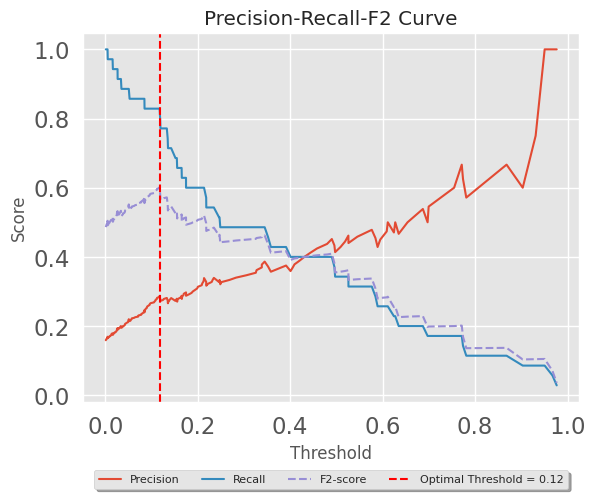

In [216]:
# adjusting the decision threshold
y_proba_xgb = model_xgb.predict(dval)
precision, recall, thresholds = precision_recall_curve(y_val, y_proba_xgb)

# Plot Precision, Recall, and F2-Score
f2_scores = (1 + 2**2) * (precision[:-1] * recall[:-1]) / (2**2 * precision[:-1] + recall[:-1])
optimal_threshold_xgb = thresholds[np.argmax(f2_scores)]

plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.plot(thresholds, f2_scores, label="F2-score", linestyle='--')

plt.axvline(x=optimal_threshold_xgb, color='r', linestyle='--', label=f'Optimal Threshold = {optimal_threshold_xgb:.2f}')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.25),
          fancybox=True, shadow=True, ncol=4, fontsize = 8)
plt.title("Precision-Recall-F2 Curve")

# saving and downloading the file
savefig('prerec_curve.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("prerec_curve.png")

plt.show()

In [217]:
# Get probabilities for the test set
dtest = xgboost.DMatrix(X_test)
y_proba_test_xgb = model_xgb.predict(dtest)
#y_proba_test_xgb = model_xgb.predict_proba(X_test)[:, 1]

# Apply the optimal threshold
y_pred_optimal_xgb = (y_proba_test_xgb >= optimal_threshold_xgb).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_xgb))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_xgb))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_xgb))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_xgb))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_xgb, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_xgb))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_xgb))
print(classification_report(y_test, y_pred_optimal_xgb))

Accuracy (optimal threshold): 0.6289592760180995
Precision (optimal threshold): 0.2830188679245283
Recall (optimal threshold): 0.8333333333333334
F1-score (optimal threshold): 0.4225352112676056
F2-score (optimal threshold): 0.6
Area Under Curve (optimal threshold): 0.7112612612612613
Confusion matrix (optimal threshold):
 [[109  76]
 [  6  30]]
              precision    recall  f1-score   support

           0       0.95      0.59      0.73       185
           1       0.28      0.83      0.42        36

    accuracy                           0.63       221
   macro avg       0.62      0.71      0.57       221
weighted avg       0.84      0.63      0.68       221



In [218]:
# Get probabilities for the test set
dtest = xgboost.DMatrix(X_test)
y_proba_test_xgb = model_xgb.predict(dtest)
#y_proba_test_xgb = model_xgb.predict_proba(X_test)[:, 1]

# Apply the optimal threshold
y_pred_optimal_xgb = (y_proba_test_xgb >= 0.165).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_xgb))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_xgb))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_xgb))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_xgb))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_xgb, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_xgb))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_xgb))
print(classification_report(y_test, y_pred_optimal_xgb))

Accuracy (optimal threshold): 0.7013574660633484
Precision (optimal threshold): 0.3333333333333333
Recall (optimal threshold): 0.8333333333333334
F1-score (optimal threshold): 0.47619047619047616
F2-score (optimal threshold): 0.6410256410256411
Area Under Curve (optimal threshold): 0.7545045045045045
Confusion matrix (optimal threshold):
 [[125  60]
 [  6  30]]
              precision    recall  f1-score   support

           0       0.95      0.68      0.79       185
           1       0.33      0.83      0.48        36

    accuracy                           0.70       221
   macro avg       0.64      0.75      0.63       221
weighted avg       0.85      0.70      0.74       221



### LightGBM

In [219]:
import lightgbm
print(lightgbm.__version__)

4.5.0


In [220]:
# features and target
features = [col for col in df_boost.columns if col not in ['AttritionNum']]
x = df_boost[features]

# Target variable
y = df_boost['AttritionNum']

# Split data into train, validation and test sets
X_train, X_temp, y_train, y_temp = train_test_split(x, y, test_size=0.3, random_state=42, stratify=y)  # 70% train, 30% temp
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp) # 15% validation, 15% test

# specifiy categorical data (for column indices check catboost) categorical_features = [1, 2, 5, 7, 9, 11, 14]
object_features = ['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']

# Convert categorical columns to category dtype
for col in object_features:
    X_train[col] = X_train[col].astype('category')
    X_test[col] = X_test[col].astype('category')
    X_val[col] = X_val[col].astype('category')

In [221]:
# Initialize the LightGBM model
model_LGBM = LGBMClassifier(
    objective='binary',
    boosting_type='gbdt',  # Gradient Boosting Decision Trees
    learning_rate=0.1,
    n_estimators=500,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

In [222]:
# Define the parameter grid
param_grid = {
    'learning_rate': [0.05, 0.01, 0.1],
    'n_estimators': [50, 100, 500],
    'max_depth': [2, 4, 6, 8],
    'num_leaves': [20, 31, 40, 45],
    'subsample': [0.6, 0.7, 0.8, 0.9],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9],
    'scale_pos_weight': [4, scale_pos_weight, 6]  # Balance the classes
}

# Perform Grid Search
grid_search = GridSearchCV(
    estimator=model_LGBM,
    param_grid=param_grid,
    scoring='roc_auc',
    cv=3,
    verbose=1,
    n_jobs=-1
)

grid_search.fit(X_train, y_train, categorical_feature=categorical_features)
print("Best Parameters:", grid_search.best_params_)

Fitting 3 folds for each of 6912 candidates, totalling 20736 fits
[LightGBM] [Info] Number of positive: 166, number of negative: 863
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 465
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.161322 -> initscore=-1.648427
[LightGBM] [Info] Start training from score -1.648427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

In [223]:
# Create LightGBM Datasets
train_data = lightgbm.Dataset(X_train, label=y_train)
val_data = lightgbm.Dataset(X_val, label=y_val, reference=train_data)

callbacks = [
    log_evaluation(period=100)#,
    #early_stopping(stopping_rounds=50) #diabled after poor minority recall
]

# Define parameters with the correct objective and metric
params = {
    'objective': 'binary',  # Specify 'binary' as the objective
    'metric': 'binary_logloss',  # Use 'binary_logloss' or another suitable metric
    'learning_rate': 0.01, # lowered from 0.1 after poor minority recall
    'max_depth': 8,
    'n_estimators': 500,
    'num_leaves': 31,
    'colsample_bytree': 0.6,
    'subsample': 0.6,
    'random_state': 42,
    'scale_pos_weight': scale_pos_weight  # Balance the classes
}

model_LGBM = lightgbm.train(
    params,
    train_data,
    num_boost_round=500,
    valid_sets=[train_data, val_data],
    valid_names=['train', 'valid'],
    callbacks=callbacks
)

[LightGBM] [Info] Number of positive: 166, number of negative: 863
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 465
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.161322 -> initscore=-1.648427
[LightGBM] [Info] Start training from score -1.648427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	train's binary_logloss: 0.289652	valid's binary_logloss: 0.414168
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

In [224]:
# Predictions
y_proba_LGBM = model_LGBM.predict(X_val)  # Returns probabilities for the positive class
threshold = 0.5  # Default threshold
y_pred_LGBM = (y_proba_LGBM >= threshold).astype(int)

# Evaluate performance
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_val, y_pred_LGBM))
print("Classification Report:", classification_report(y_val, y_pred_LGBM))

Confusion matrix (optimal threshold):
 [[169  16]
 [ 23  12]]
Classification Report:               precision    recall  f1-score   support

           0       0.88      0.91      0.90       185
           1       0.43      0.34      0.38        35

    accuracy                           0.82       220
   macro avg       0.65      0.63      0.64       220
weighted avg       0.81      0.82      0.81       220



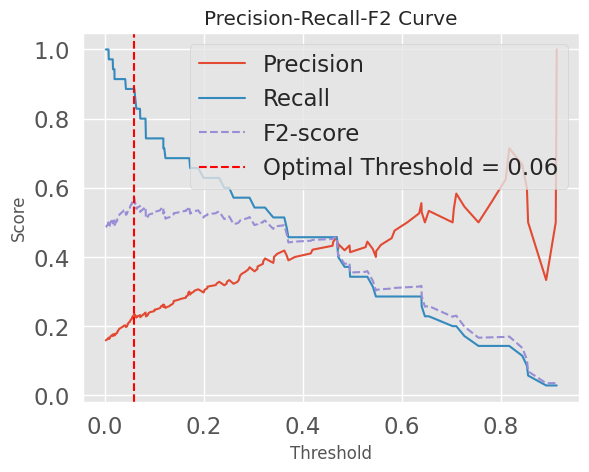

In [225]:
# adjusting the decision threshold
y_proba_lgbm = model_LGBM.predict(X_val)
precision, recall, thresholds = precision_recall_curve(y_val, y_proba_lgbm)

# Plot Precision, Recall, and F2-Score
f2_scores = (1 + 2**2) * (precision[:-1] * recall[:-1]) / (2**2 * precision[:-1] + recall[:-1])
optimal_threshold_lgbm = thresholds[np.argmax(f2_scores)]

plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.plot(thresholds, f2_scores, label="F2-score", linestyle='--')

plt.axvline(x=optimal_threshold_lgbm, color='r', linestyle='--', label=f'Optimal Threshold = {optimal_threshold_lgbm:.2f}')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.legend()
plt.title("Precision-Recall-F2 Curve")
plt.show()

In [226]:
# Get probabilities for the test set
y_proba_test_lgbm = model_LGBM.predict(X_test)

# Apply the optimal threshold
y_pred_optimal_lgbm = (y_proba_test_lgbm >= optimal_threshold_lgbm).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_lgbm))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_lgbm))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_lgbm))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_lgbm))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_lgbm, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_lgbm))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_lgbm))
print(classification_report(y_test, y_pred_optimal_lgbm))

Accuracy (optimal threshold): 0.502262443438914
Precision (optimal threshold): 0.22794117647058823
Recall (optimal threshold): 0.8611111111111112
F1-score (optimal threshold): 0.36046511627906974
F2-score (optimal threshold): 0.5535714285714286
Area Under Curve (optimal threshold): 0.6467717717717718
Confusion matrix (optimal threshold):
 [[ 80 105]
 [  5  31]]
              precision    recall  f1-score   support

           0       0.94      0.43      0.59       185
           1       0.23      0.86      0.36        36

    accuracy                           0.50       221
   macro avg       0.58      0.65      0.48       221
weighted avg       0.82      0.50      0.55       221



In [227]:
# Get probabilities for the test set
y_proba_test_lgbm = model_LGBM.predict(X_test)

# Apply the optimal threshold
#y_pred_optimal_lgbm = (y_proba_test_lgbm >= optimal_threshold_lgbm).astype(int)
y_pred_optimal_lgbm = (y_proba_test_lgbm >= 0.15).astype(int)

# Evaluate the model with the optimal threshold
print("Accuracy (optimal threshold):", accuracy_score(y_test, y_pred_optimal_lgbm))
print("Precision (optimal threshold):", precision_score(y_test, y_pred_optimal_lgbm))
print("Recall (optimal threshold):", recall_score(y_test, y_pred_optimal_lgbm))
print("F1-score (optimal threshold):", f1_score(y_test, y_pred_optimal_lgbm))
print("F2-score (optimal threshold):", fbeta_score(y_test, y_pred_optimal_lgbm, beta=2))
print('Area Under Curve (optimal threshold):', roc_auc_score(y_test, y_pred_optimal_lgbm))
print("Confusion matrix (optimal threshold):\n", confusion_matrix(y_test, y_pred_optimal_lgbm))
print(classification_report(y_test, y_pred_optimal_lgbm))

Accuracy (optimal threshold): 0.7104072398190046
Precision (optimal threshold): 0.3333333333333333
Recall (optimal threshold): 0.7777777777777778
F1-score (optimal threshold): 0.4666666666666667
F2-score (optimal threshold): 0.6140350877192983
Area Under Curve (optimal threshold): 0.7375375375375376
Confusion matrix (optimal threshold):
 [[129  56]
 [  8  28]]
              precision    recall  f1-score   support

           0       0.94      0.70      0.80       185
           1       0.33      0.78      0.47        36

    accuracy                           0.71       221
   macro avg       0.64      0.74      0.63       221
weighted avg       0.84      0.71      0.75       221



### Comparing Gradient Boosting Models

In [228]:
print('CatBoost',classification_report(y_test, y_pred_optimal_cat))
print('XGBoost',classification_report(y_test, y_pred_optimal_xgb))
print('LightGBM',classification_report(y_test, y_pred_optimal_lgbm))

CatBoost               precision    recall  f1-score   support

           0       0.93      0.73      0.82       185
           1       0.34      0.72      0.46        36

    accuracy                           0.73       221
   macro avg       0.64      0.73      0.64       221
weighted avg       0.84      0.73      0.76       221

XGBoost               precision    recall  f1-score   support

           0       0.95      0.68      0.79       185
           1       0.33      0.83      0.48        36

    accuracy                           0.70       221
   macro avg       0.64      0.75      0.63       221
weighted avg       0.85      0.70      0.74       221

LightGBM               precision    recall  f1-score   support

           0       0.94      0.70      0.80       185
           1       0.33      0.78      0.47        36

    accuracy                           0.71       221
   macro avg       0.64      0.74      0.63       221
weighted avg       0.84      0.71      0.75     

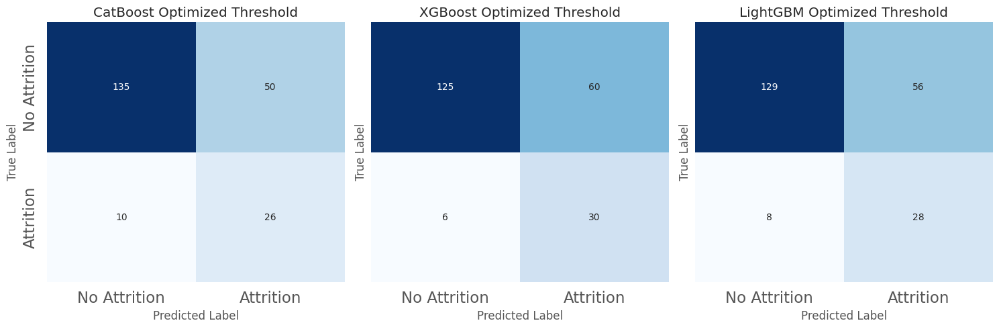

In [229]:
# Store predictions in a dictionary for easier access
predictions = {
    'CatBoost Optimized Threshold': y_pred_optimal_cat,
    'XGBoost Optimized Threshold': y_pred_optimal_xgb,
    'LightGBM Optimized Threshold': y_pred_optimal_lgbm,
}

# Create figure and axes for the 2x2 facet grid
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)  # 1 row, 3 columns

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate through models and plot confusion matrices
for i, (model_name, y_pred) in enumerate(predictions.items()):
    cm = confusion_matrix(y_test, y_pred)  # Calculate confusion matrix using y_test and current model's predictions
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=axes[i])  # Plot heatmap
    axes[i].set_title(model_name)  # Set subplot title
    axes[i].set_xlabel('Predicted Label')  # Set x-axis label
    axes[i].set_ylabel('True Label')  # Set y-axis label
    axes[i].set_xticklabels(['No Attrition', 'Attrition'])
    axes[i].set_yticklabels(['No Attrition', 'Attrition'])

plt.tight_layout()  # Adjust subplot spacing
plt.show()  # Display the plot

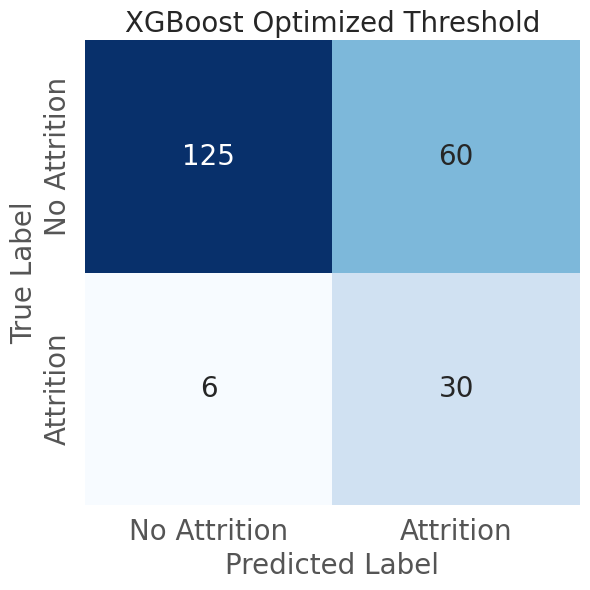

In [230]:
# Assuming y_pred_optimal_xgb is a 1D array of predicted labels
y_pred_optimal_xgb = y_pred_optimal_xgb.reshape(-1, 1)  # Reshape to a single column matrix

# Create figure and axes for the plot (adjust size as needed)
fig, ax = plt.subplots(figsize=(6, 6))

# Plot the confusion matrix as a heatmap
sns.heatmap(confusion_matrix(y_test, y_pred_optimal_xgb),
            annot=True, fmt='d', cmap='Blues', cbar=False, ax=ax,
            annot_kws={"size": 20})

# Set title and labels
ax.set_title('XGBoost Optimized Threshold', fontsize = 20)
ax.set_xlabel('Predicted Label', fontsize = 20)
ax.set_ylabel('True Label', fontsize = 20)
ax.set_xticklabels(['No Attrition', 'Attrition'], fontsize = 20)
ax.set_yticklabels(['No Attrition', 'Attrition'], fontsize = 20)

plt.tight_layout()

# saving and downloading the file
savefig('heat_class.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("heat_class.png")

plt.show()

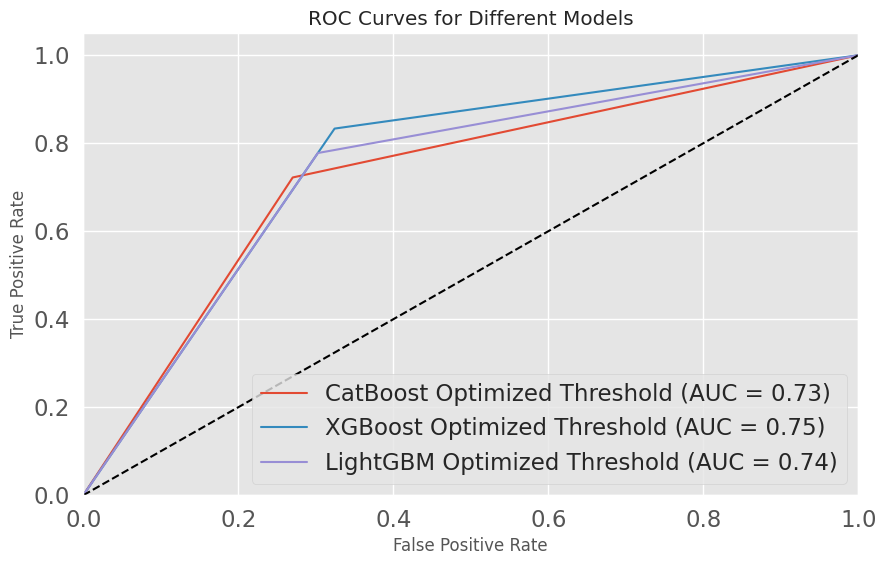

In [231]:
models = {
    'CatBoost Optimized Threshold': y_pred_optimal_cat,
    'XGBoost Optimized Threshold': y_pred_optimal_xgb,
    'LightGBM Optimized Threshold': y_pred_optimal_lgbm,
}

plt.figure(figsize=(10, 6))

for model_name, y_pred in models.items():
  fpr, tpr, thresholds = roc_curve(y_test, y_pred)
  roc_auc = roc_auc_score(y_test, y_pred)
  plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Different Models')
plt.legend(loc="lower right")
plt.show()

###Model Selection

**CatBoost (Optimized Threshold):**

The AUC suggests the model performs reasonably well at distinguishing between classes. Precision for the minnority class is higher compared to other models, resulting in a moderate amount of false positives. Recall is lower compared to other boosting models, resulting in more false negative cases.

**XGBoost (Optimized Threshold):**

The AUC is highest compared to the other two models, indicating better ability to distinguish between classes. Precision for the minority class is lower compared to CatBoost and similar for LightGBM, resulting in more false positives. Recall for the minority class slightly outperforms both CatBoost and LightGBM, which means that it produces less false negatives.

**LightGBM (Optimized Threshold):**

LightGBM prodcues a slightly lower AUC compared to XGBoost, but overall indicating satisfactory ability to distinguish between classes. Precision for the minority class is equal to XGBoost, recall is comparably poorer, resulting in a higher amount of false negatives.

**Decision:**

XGBoost emerges as the best model, with the highest recall for attrition cases and the best AUC. This means it minimizes missed attrition cases more effectively than CatBoost or LightGBM, albeit at a slight cost to precision.

# Modeling Techniques: Comparison and Selection

In [232]:
print('ADASYN Logistic Regression')
print(classification_report(y_test, y_pred_optimal_ada))
print('SMOTE Random Forest')
print(classification_report(y_test, y_pred_optimal_rf_smt))
print('XGBoost')
print(classification_report(y_test, y_pred_optimal_xgb))

ADASYN Logistic Regression
              precision    recall  f1-score   support

           0       0.94      0.78      0.85       185
           1       0.40      0.75      0.52        36

    accuracy                           0.77       221
   macro avg       0.67      0.76      0.69       221
weighted avg       0.85      0.77      0.80       221

SMOTE Random Forest
              precision    recall  f1-score   support

           0       0.94      0.63      0.75       185
           1       0.29      0.78      0.42        36

    accuracy                           0.66       221
   macro avg       0.61      0.71      0.59       221
weighted avg       0.83      0.66      0.70       221

XGBoost
              precision    recall  f1-score   support

           0       0.95      0.68      0.79       185
           1       0.33      0.83      0.48        36

    accuracy                           0.70       221
   macro avg       0.64      0.75      0.63       221
weighted avg       

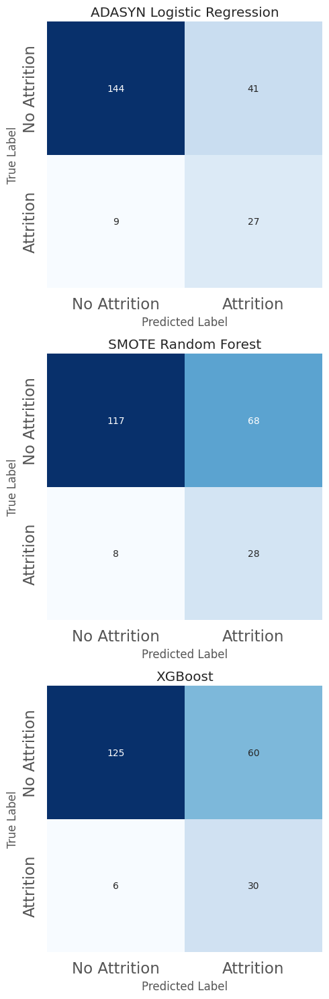

In [233]:
# Store predictions in a dictionary for easier access
predictions = {
    'ADASYN Logistic Regression': y_pred_optimal_ada,
    'SMOTE Random Forest': y_pred_optimal_rf_smt,
    'XGBoost': y_pred_optimal_xgb,
}

# Create figure and axes for the 2x2 facet grid
fig, axes = plt.subplots(3, 1, figsize=(5, 15), sharey=True)  # 1 row, 3 columns

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate through models and plot confusion matrices
for i, (model_name, y_pred) in enumerate(predictions.items()):
    cm = confusion_matrix(y_test, y_pred)  # Calculate confusion matrix using y_test and current model's predictions
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=axes[i])  # Plot heatmap
    axes[i].set_title(model_name)  # Set subplot title
    axes[i].set_xlabel('Predicted Label')  # Set x-axis label
    axes[i].set_ylabel('True Label')  # Set y-axis label
    axes[i].set_xticklabels(['No Attrition', 'Attrition'])
    axes[i].set_yticklabels(['No Attrition', 'Attrition'])

plt.tight_layout()  # Adjust subplot spacing

# saving and downloading the file
savefig('matrix_selection.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("matrix_selection.png")

plt.show()  # Display the plot

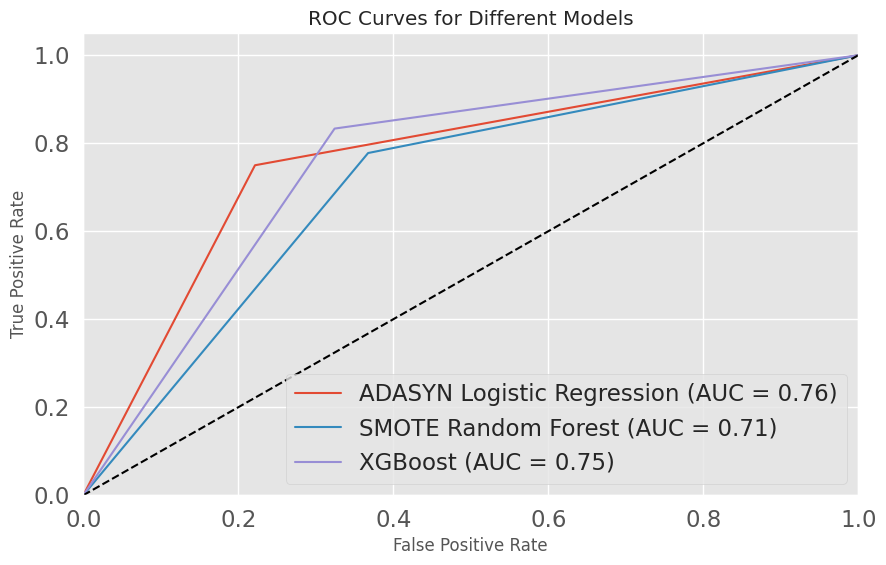

In [234]:
models = {
    'ADASYN Logistic Regression': y_pred_optimal_ada,
    'SMOTE Random Forest': y_pred_optimal_rf_smt,
    'XGBoost': y_pred_optimal_xgb,
}

plt.figure(figsize=(10, 6))

for model_name, y_pred in models.items():
  fpr, tpr, thresholds = roc_curve(y_test, y_pred)
  roc_auc = roc_auc_score(y_test, y_pred)
  plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Different Models')
plt.legend(loc="lower right")

# saving and downloading the file
savefig('ROC_AUC.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("ROC_AUC.png")

plt.show()

## Decision For Final Model

**ADASYN Logistic Regression:**

Best AUC among the models, indicating strong performance in distinguishing between the two classes. Precision for the minority class is moderate, indicating relatively fewer false positives compared to others. Recall for the minority class is high, effectively identifying attrition cases.

Trade-off: Achieves the highest recall while maintaining moderate precision and overall strong performance.

**SMOTE Random Forest:**

Slightly lower AUC than ADASYN. Precision is lower than ADASYN, indicating more false positives. Recall matches ADASYN, effectively identifying attrition cases.

Trade-off: Similar recall to ADASYN but struggles with precision.

**XGBoost:**

AUC is close to ADASYN and better than SMOTE Random Forest. Precision is moderate, similar to SMOTE Random Forest. Recall is the highest among all models, effectively identifying attrition cases.

Trade-off: Best recall but lower precision, resulting in more false positives.

**Decision:**

Since reducing false negatives is the priority (i.e., missing attrition cases is more costly than misslabeling non-attrition cases), XGBoost is slightly better because it achieves the highest recall, ensuring most attrition cases are identified. However, it comes at the cost of more false positives (lower precision).

## XGBoost: Cross Validation

In [235]:
skf = StratifiedKFold(n_splits=5)
for train_idx, valid_idx in skf.split(X_train, y_train):
    model_cat.fit(X_train.iloc[train_idx], y_train.iloc[train_idx])
    # Use predict and calculate accuracy instead of score
    y_pred = model_cat.predict(X_train.iloc[valid_idx])  # Get predictions
    accuracy = (y_pred == y_train.iloc[valid_idx]).mean()  # Calculate accuracy
    print("Validation Score:", accuracy)

0:	total: 5.81ms	remaining: 5.8s
100:	total: 399ms	remaining: 3.55s
200:	total: 830ms	remaining: 3.3s
300:	total: 1.24s	remaining: 2.87s
400:	total: 1.66s	remaining: 2.48s
500:	total: 2.09s	remaining: 2.08s
600:	total: 2.49s	remaining: 1.65s
700:	total: 2.9s	remaining: 1.24s
800:	total: 3.3s	remaining: 819ms
900:	total: 3.7s	remaining: 406ms
999:	total: 4.08s	remaining: 0us
Validation Score: 0.8592233009708737
0:	total: 4.48ms	remaining: 4.47s
100:	total: 394ms	remaining: 3.51s
200:	total: 883ms	remaining: 3.51s
300:	total: 1.29s	remaining: 3s
400:	total: 1.75s	remaining: 2.61s
500:	total: 2.15s	remaining: 2.14s
600:	total: 2.6s	remaining: 1.73s
700:	total: 3.44s	remaining: 1.47s
800:	total: 4.27s	remaining: 1.06s
900:	total: 4.94s	remaining: 543ms
999:	total: 5.64s	remaining: 0us
Validation Score: 0.8883495145631068
0:	total: 7.33ms	remaining: 7.32s
100:	total: 918ms	remaining: 8.17s
200:	total: 1.87s	remaining: 7.44s
300:	total: 2.34s	remaining: 5.44s
400:	total: 2.76s	remaining: 4.1

The model performs well across different folds, with validation scores consistently above 0.88. The highest validation score is 0.91, which demonstrates strong performance. The variance between folds is small (around 0.03), suggesting stable behavior (no overfitting to any particular fold of the training data).

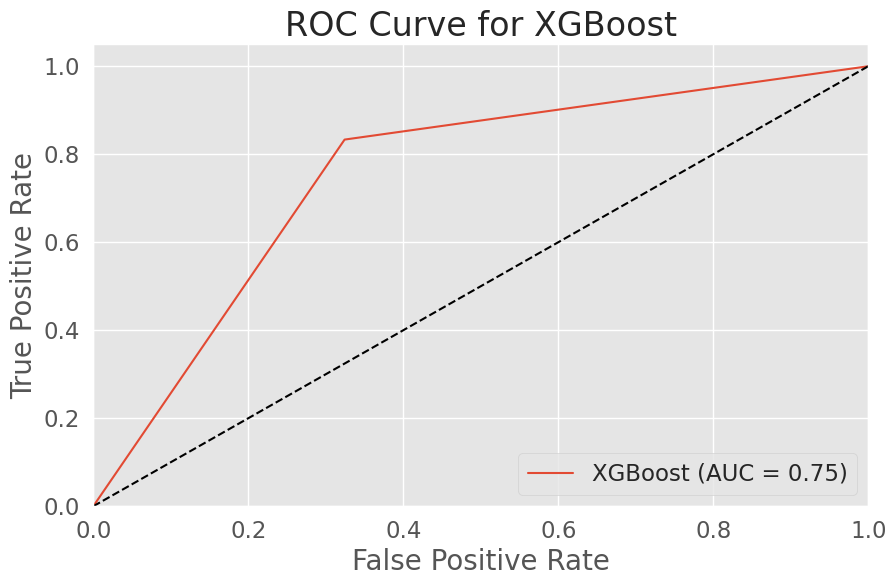

In [236]:
models = {
    'XGBoost': y_pred_optimal_xgb,
}

plt.figure(figsize=(10, 6))

for model_name, y_pred in models.items():
  fpr, tpr, thresholds = roc_curve(y_test, y_pred)
  roc_auc = roc_auc_score(y_test, y_pred)
  plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize = 20)
plt.ylabel('True Positive Rate', fontsize = 20)
plt.title('ROC Curve for XGBoost', fontsize = 24)
plt.legend(loc="lower right")

# saving and downloading the file
savefig('ROC_AUC_XGB.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("ROC_AUC_XGB.png")

plt.show()

## Saving the Model

In [237]:
import os
# Specify the folder where the model will be saved
file_path = '/content/drive/MyDrive/HR_Employee_Attrition_DataScience/Data'
os.makedirs(file_path, exist_ok=True)  # Create the folder if it doesn't exist

# Specify the full path for saving the model
model_path = os.path.join(file_path, "xgboost_model.json")

# Save the trained model to the specified folder
model_xgb.save_model(model_path)

# Print confirmation
print(f"Model saved to {model_path}")

Model saved to /content/drive/MyDrive/HR_Employee_Attrition_DataScience/Data/xgboost_model.json


# SHAP: Investigating Most Impactful Features

SHAP (SHapley Additive exPlanations) analysis assigns each feature a contribution value that quantifies its impact on the model’s output for individual predictions. By ranking features based on their average impact across all predictions, decisions about which features should be prioritized can be made. The primary goal is to use SHAP to interpret the predictions of the final selected model (XGBoost) and provide actionable insights into the key drivers of employee attrition.

## Reloading the Model & Data Preparation

In [238]:
# re-import if you start here
import os
import xgboost
from xgboost import XGBClassifier

# Specify the folder where the model will be saved
file_path = '/content/drive/MyDrive/HR_Employee_Attrition_DataScience/Data'
os.makedirs(file_path, exist_ok=True)  # Create the folder if it doesn't exist

# Specify the full path for saving the model
model_path = os.path.join(file_path, "xgboost_model.json")

# Initialize a new Booster object (if not already done during training)
model_xgb = xgboost.Booster()

model_xgb.load_model(model_path)
print("Model loaded successfully.")

Model loaded successfully.


In [239]:
import pandas as pd

# specify file path of cleaned data used for modelling
file_path = '/content/drive/MyDrive/HR_Employee_Attrition_DataScience/Data/IBM_HR_Employee_Attrition_cleaned.csv'

# load data
df_cleaned = pd.read_csv(file_path)

In [240]:
from sklearn.model_selection import train_test_split

# Select features for the model (excluding the target variable and unnecessary columns)
features = [col for col in df_cleaned.columns if col not in ['AttritionNum']]
x = df_cleaned[features]

# Target variable
y = df_cleaned['AttritionNum']

# Split data into train, validation and test sets
X_train, X_temp, y_train, y_temp = train_test_split(x, y, test_size=0.3, random_state=42, stratify=y)  # 70% train, 30% temp
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp) # 15% validation, 15% test

## SHAP Analysis

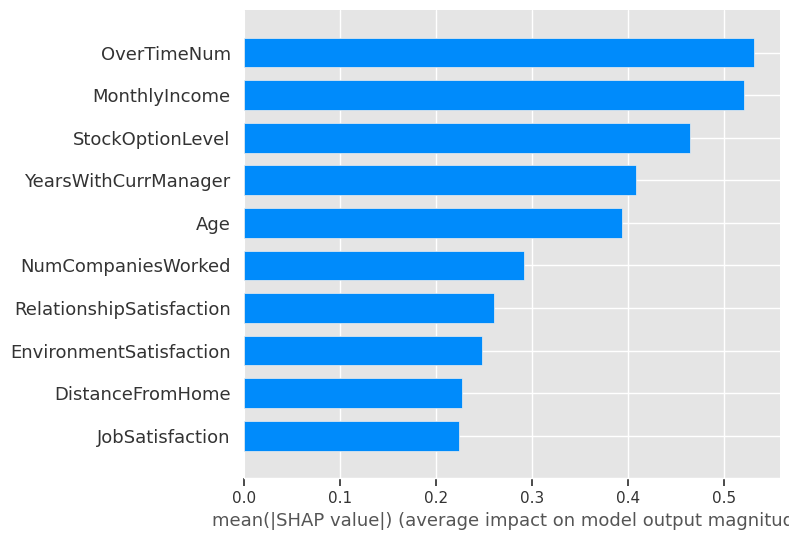

In [241]:
explainer = shap.TreeExplainer(model_xgb)
shap_values = explainer(X_val)

# Create a Matplotlib figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Generate the SHAP summary plot
shap.summary_plot(shap_values, X_val, plot_type="bar", max_display=10, show=False)

# Access the current figure and axes using plt.gcf() and plt.gca()
fig = plt.gcf()  # Get current figure
ax = plt.gca()  # Get current axes

# Save, download, and display
plt.tight_layout()
fig.savefig("SHAP.png", transparent=True, bbox_inches='tight', dpi=300)
#files.download("SHAP.png")
plt.show()

**The SHAP summary bar plot** illustrates the global importance of the top 10 features in the model's predictions. Each bar represents the mean absolute SHAP value for a given feature, indicating its average contribution to the model’s output across all predictions. Features with taller bars exert a greater influence on the predictions, meaning they are more critical in determining the model's decisions.

For example:

+ Overtime has the highest mean SHAP value, showing it is the most impactful feature in predicting attrition, followed closely by monthly income and stock option level.
+ Features such as job satisfaction and distance from home, while still important, contribute less significantly to the model's predictions compared to the top-ranking features.


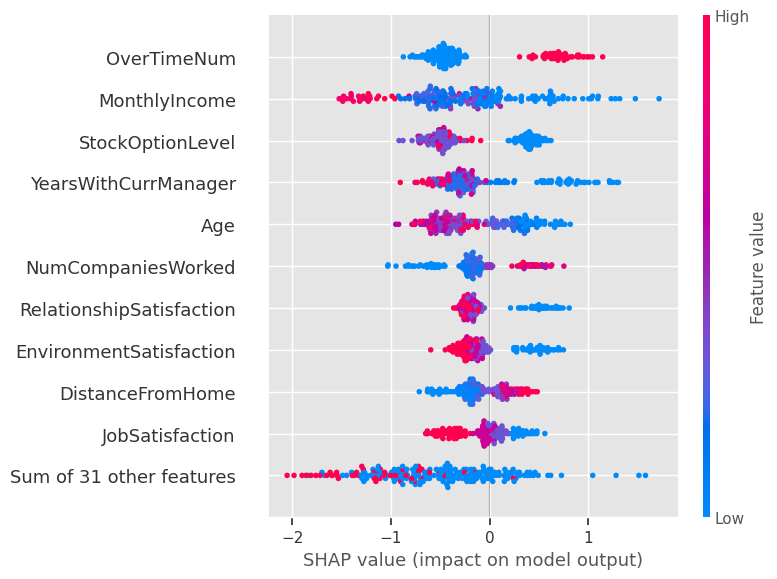

In [242]:
# Create a Matplotlib figure and axes
fig, ax = plt.subplots(figsize=(10, 14))

# Generate the SHAP summary plot
shap.plots.beeswarm(shap_values, max_display = 11, show=False)

# Access the current figure and axes using plt.gcf() and plt.gca()
fig = plt.gcf()  # Get current figure
ax = plt.gca()  # Get current axes

# Save, download, and display
plt.tight_layout()
fig.savefig("SHAP_2.png", transparent=True, bbox_inches='tight', dpi=300)
#files.download("SHAP_2.png")
plt.show()

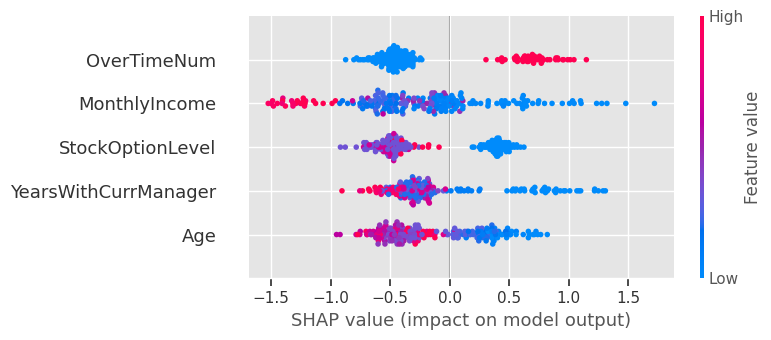

In [243]:
# Create a Matplotlib figure and axes
fig, ax = plt.subplots(figsize=(10, 14))

# Get the indices of the top 10 features based on mean absolute SHAP values
feature_order = np.argsort(np.abs(shap_values.values).mean(0))
top_10_features_indices = feature_order[-10:]

# Select features 6 to 10 from the top 10 features
selected_features_indices =top_10_features_indices[5:10]   # Indices 5 to 9 (inclusive)
selected_shap_values = shap_values[:, selected_features_indices]

# Plot the beeswarm plot with the selected features
shap.plots.beeswarm(selected_shap_values, max_display=6, show=False)

# Access the current figure and axes using plt.gcf() and plt.gca()
fig = plt.gcf()  # Get current figure
ax = plt.gca()  # Get current axes

# Save, download, and display
plt.tight_layout()
fig.savefig("SHAP_3.png", transparent=True, bbox_inches='tight', dpi=300)
#files.download("SHAP_3.png")
plt.show()

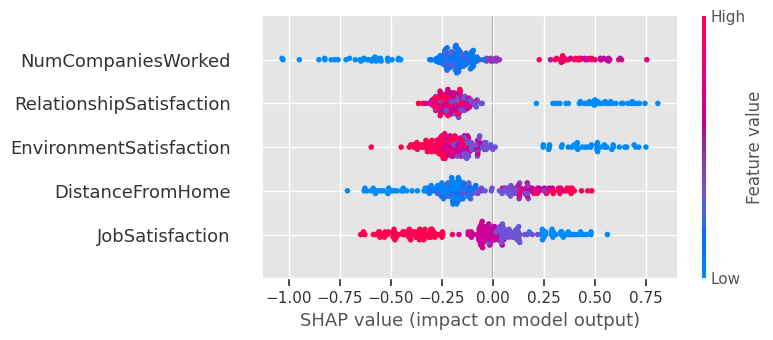

In [244]:
# Create a Matplotlib figure and axes
fig, ax = plt.subplots(figsize=(10, 14))

# Get the indices of the top 10 features based on mean absolute SHAP values
feature_order = np.argsort(np.abs(shap_values.values).mean(0))
top_10_features_indices = feature_order[-10:]

# Select features 6 to 10 from the top 10 features
selected_features_indices =top_10_features_indices[0:5]   # Indices 5 to 9 (inclusive)
selected_shap_values = shap_values[:, selected_features_indices]

# Plot the beeswarm plot with the selected features
shap.plots.beeswarm(selected_shap_values, max_display=6, show=False)

# Access the current figure and axes using plt.gcf() and plt.gca()
fig = plt.gcf()  # Get current figure
ax = plt.gca()  # Get current axes

# Save, download, and display
plt.tight_layout()
fig.savefig("SHAP_4.png", transparent=True, bbox_inches='tight', dpi=300)
#files.download("SHAP_4.png")
plt.show()

**The SHAP beeswarm plot** provides a visualization of how the top 10 features contribute to model predictions. The features are ranked by their impact on the model's predictions from high to low.

**SHAP values** are displayed on the x-axis and quantify the contribution of a feature to the model's prediction for a specific observation.
+ Negative SHAP values: the feature pushes the prediction towards a lower value (decreasing the likehood of attrition).
+ Positive SHAP values: the feature pushes the prediction towards a higher value (increasing the likelihood of attrition).

**Feature Values** are signified by a color scale.
+ Low feature values are displayed in blue color.
+ Average feature values are displayed in lilac.
+ High feature values are displayed in red.

**The predictive power of a feature** can be visually inspected by how tightly associated feature's values are with specific SHAP value ranges. For example, if a features high values consistently correspond to positive SHAP values, while low values correspond to negative values, this distinct spead suggest that this is a highly predictive feature.
+ Gradient Consistency: A smooth transition in the color gradient (e.g., blue to pink/red) across the SHAP value range shows that the feature captures an underlying pattern in the data.
+ Range of SHAP values: Features with a wider spread of SHAP values exert more influence on the model’s predictions, implying higher predictive power.
+ Overlap: If different feature values (e.g., red and blue dots) share similar SHAP values, it indicates the feature might not be strongly predictive.

## Interpretation of Key Features

#### Overtime:
+ Working overtime (red dots) significantly increases the likelihood of attrition (positive SHAP values).
+ Not working overtime numbers (blue dots) decreases the likelihood of attrition (negative SHAP values).

#### Monthly Income:

+ Lower income (blue dots) is associated with higher attrition (positive SHAP values).
+ Higher income (red dots) reduces attrition (negative SHAP values).

#### Stock Option Level:

+ Employees with no stock option (blue dots) are more likely to leave.
+ Higher stock option levels (lilac to red dots) decrease attrition likelihood.

#### Years With Current Manager:

+ Employees with fewer years under their current manager (blue dots) are more likely to leave.
+ Longer tenures with their manager (lilac to red dots) reduce attrition likelihood.

#### Age:

+ Younger employees (blue dots) have higher attrition rates (positive SHAP values).
+ Older employees (lilac to red dots) are less likely to leave (negative SHAP values).

#### Number of Companies Worked for:

+ Employees who have worked for more companies (lilac to red dots) are more likely to leave.
+ Employees who have worked for less companies (blue dots) have a lower attrition likelihood.

#### Relationship Satisfaction

+ Employees with low relationship satisfaction (blue dots) are more likely to leave.
+ Employees with average to high relationship satisfaction (lilac to red dots) have a reduced risk of attrition.

#### Environment Satisfaction:

+ Employees with low environment satisfaction (blue dots) are more likely to leave.
+ Average to very high satisfaction (red dots) reduces attrition.

#### Distance From Home:

+ Shorter commutes (blue dots) tend to reduce attrition.
+ Longer commutes (red dots) slightly increase the risk of attrition.

#### Job Satisfaction:

+ Medium to very high job satisfaction (lilac to red dots) reduces attrition.
+ Dissatisfied employees (blue dots) are more likely to leave.

## Detailed Inspection of Top 10 Features

### Overtime

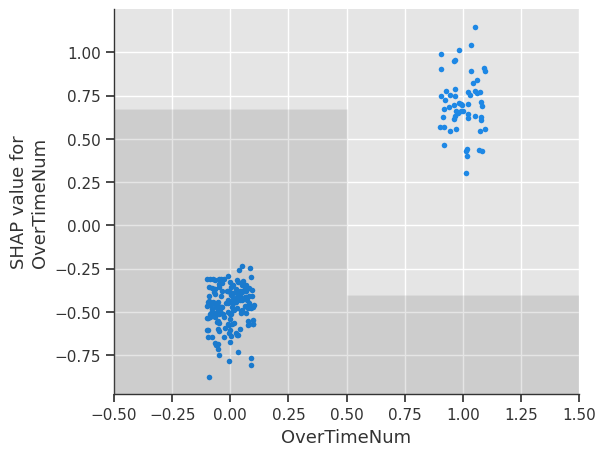

In [245]:
shap.plots.scatter(shap_values[:, "OverTimeNum"])

No overtime reduces the likelihood of attrition, as indicated by the clustering of datapoints for employees not working overtime around negative SHAP values. In comparison, working overtime increases attrition risk significantly, as shown by the positive SHAP values.

Inspecting the distribution of overtime (grey bars), most employees do not work overtime, while a smaller proportion do. The unequal distribution of overtime in the dataset makes it essential to interpret the importance of overtime cautiously. While XGBoost can generally handle imbalanced features, they will be evaluated as more important in metrics like SHAP.


### Monthly Income

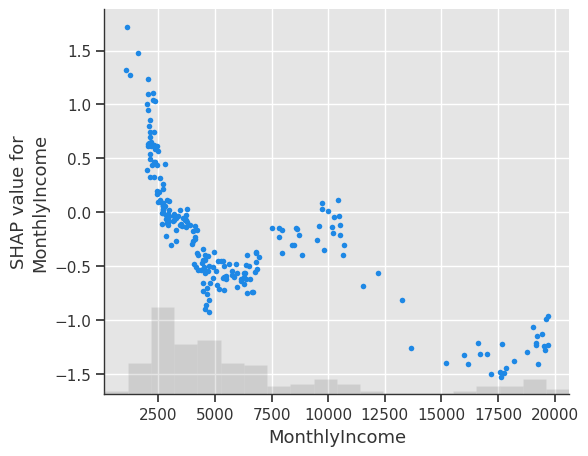

In [246]:
shap.plots.scatter(shap_values[:, "MonthlyIncome"])

Employees earning less than 5000 are at significantly higher risk of attrition, as indicated by the steep rise in SHAP values. Incomes in the 5000–10,000 range do not strongly influence attrition, with datapoints being clustered around 0. Employees with monthly incomes above 10,000 are less likely to leave, indicating that higher compensation likely increases retention. However, the sparse data in this range makes it important to validate these insights further.

### Stock Option Level

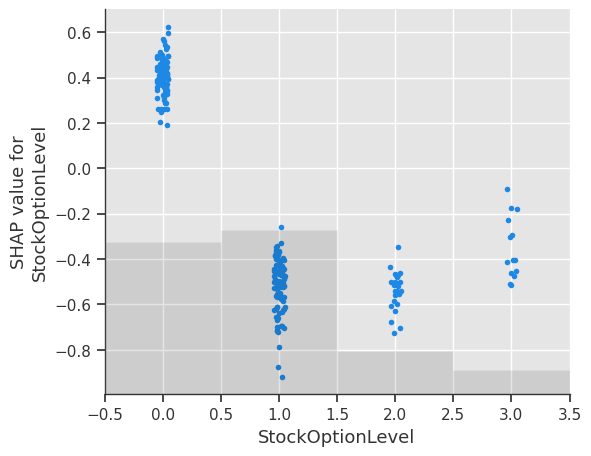

In [247]:
shap.plots.scatter(shap_values[:, "StockOptionLevel"])

Employees with no stock options are at the highest risk of leaving, while in comparison even moderate stock options significantly reduce attrition, suggesting that they are an effective retention strategy. Most employees are concentrated in the lower stock option levels (0 and 1), while higher levels (2 and 3) are rare. This could amplify the perceived feature importance of stock options.

### Years With Current Manager

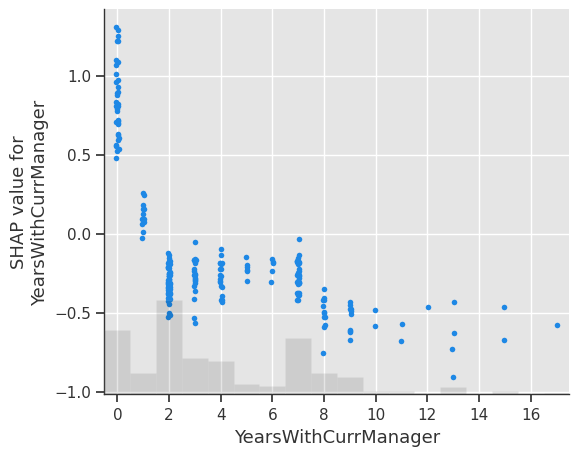

In [248]:
shap.plots.scatter(shap_values[:, "YearsWithCurrManager"])

The sharp increase in SHAP values for employees with less than 1 year under their current manager highlights a critical risk period for attrition. Employees with 3–7 years of managerial tenure have the lowest attrition risk, as indicated by SHAP values close to zero or slightly negative. Long-standing relationships with managers (8+ years) contribute significantly to retention as well, however, less data is available and further validation is necessary.

### Age

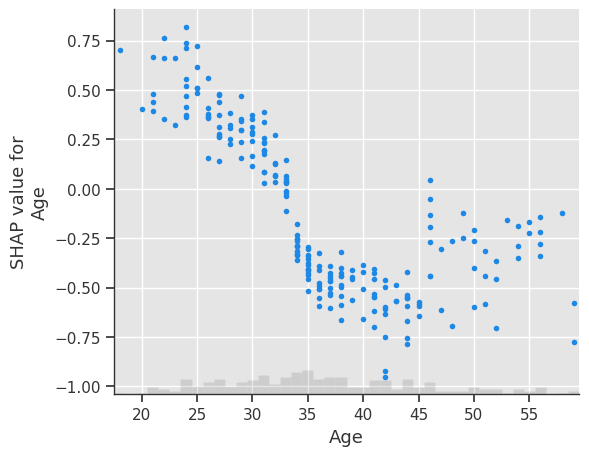

In [249]:
shap.plots.scatter(shap_values[:, "Age"])

Younger employees (20–30) are at the highest risk of attrition. The positive SHAP values show a clear trend that younger workers are more likely to leave. Attrition risk decreases significantly for employees in their 30s and 40s, as indicated by the decline in SHAP values. Older employees (40+) are generally less likely to leave. The slight increase in SHAP values for employees near 60 likely suggests some attrition due to retirement.

### Number of Companies Worked At

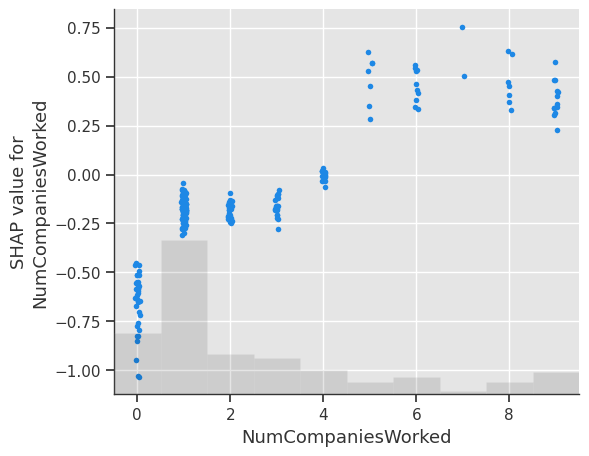

In [250]:
shap.plots.scatter(shap_values[:, "NumCompaniesWorked"])

Employees with fewer prior companies (0–2) are less likely to leave, shown by negative SHAP values. Employees with as least 5 prior companies are at a moderate risk of attrition.

### Relationship Satisfaction

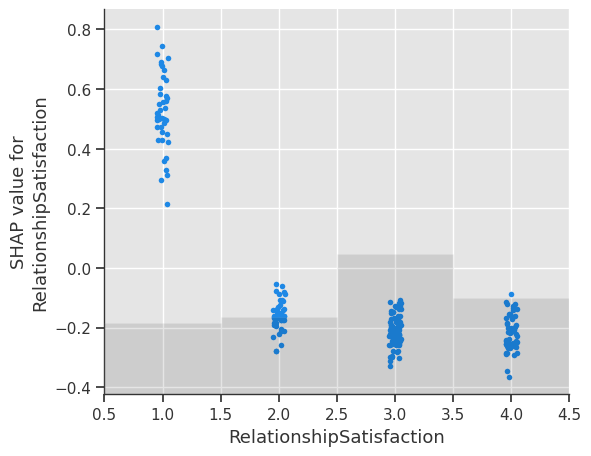

In [251]:
shap.plots.scatter(shap_values[:, "RelationshipSatisfaction"])

Low relationship satisfaction (1) significantly increases the likelihood of attrition, as shown by the high SHAP values. A moderate to very high relationship satisfaction level decreses risk of attrition.

### Environment Satisfaction

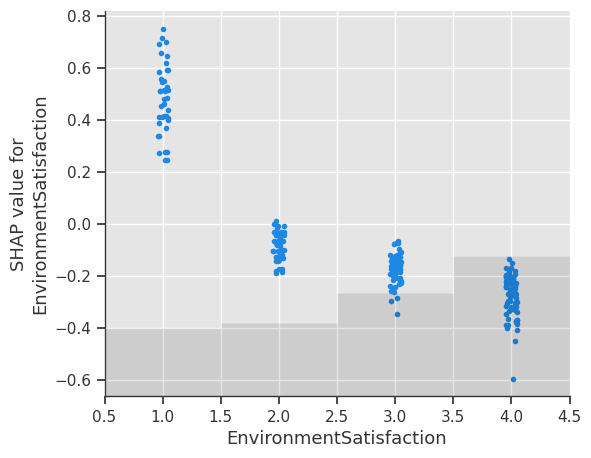

In [252]:
shap.plots.scatter(shap_values[:, "EnvironmentSatisfaction"])

Low environment satisfaction (1) is a clear driver of attrition, as shown by the high SHAP values. Employees with moderate environment satisfaction levels (2) are less predictable in their attrition risk, with datapoints being distributed across slightly positive as well as negative SHAP values. Many employees rate their environment satisfaction as high (3–4), which correlates with lower attrition risk.

### Distance From Home

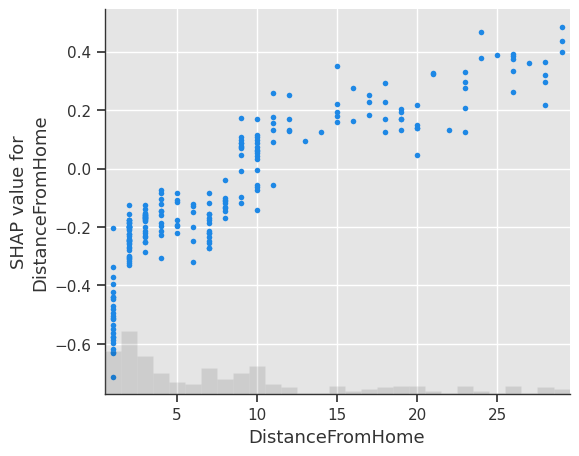

In [253]:
shap.plots.scatter(shap_values[:, "DistanceFromHome"])

Employees who live closer to work (0–5 miles) are less likely to leave, as indicated by negative SHAP values. Employees with moderate commutes (5–15 miles) are neither strongly inclined to stay nor leave based solely on commuting distance. Employees with long commutes (15+ miles) are at higher risk of attrition, as indicated by the steep rise in SHAP values. The distance of an employees place of work from home thus shows a clear and consistent relationship with attrition: the farther employees live from work, the more likely they are to leave.

### Job Satisfaction

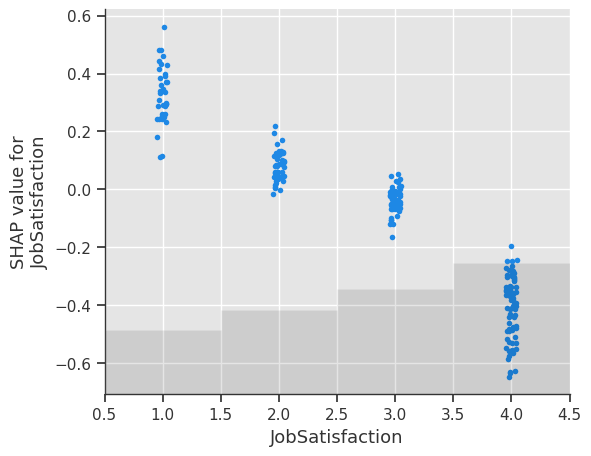

In [254]:
shap.plots.scatter(shap_values[:, "JobSatisfaction"])

Employees with low job satisfaction (1) are at the highest risk of leaving. The high positive SHAP values in this range highlight dissatisfaction as a major driver of attrition. As job satisfaction improves (2–3), the likelihood of attrition decreases. Employees with high job satisfaction (4) are the least likely to leave. The negative SHAP values indicate a strong retention effect for this group.

## Interactions

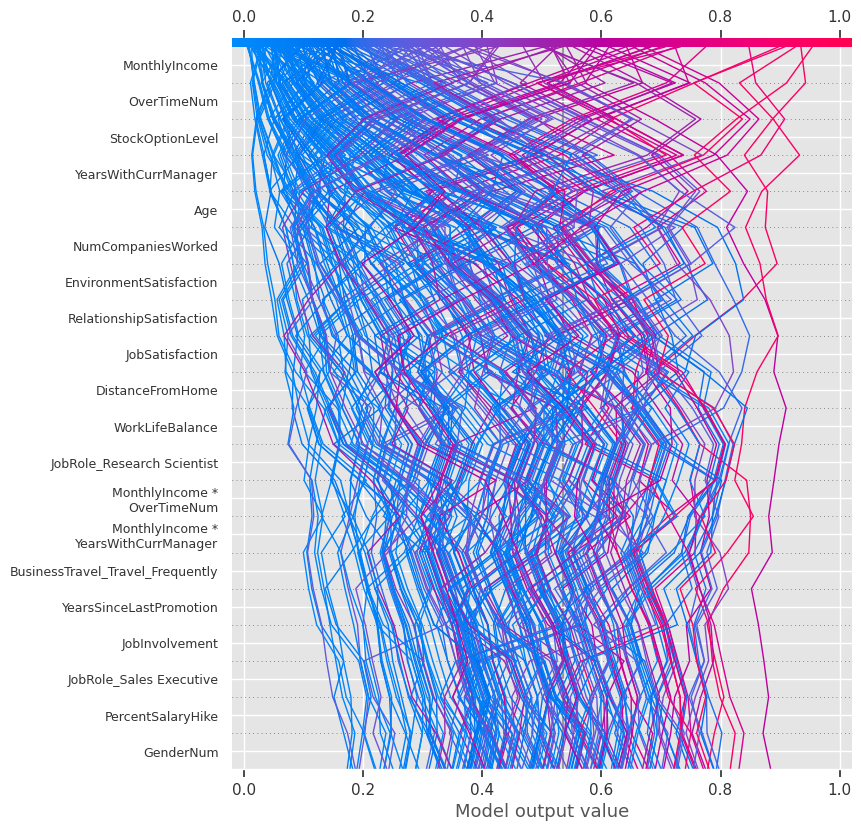

In [255]:
# extract expected values
expected_value = explainer.expected_value

# extract interactions
shap_interaction_values = explainer.shap_interaction_values(X_val)

# Select features
features = [col for col in df_cleaned.columns if col not in ['AttritionNum']]
x = df_cleaned[features]

# create SHAP decision plot for interactions
shap.decision_plot(expected_value, shap_interaction_values, features, link="logit")

### Monthy Income and Overtime

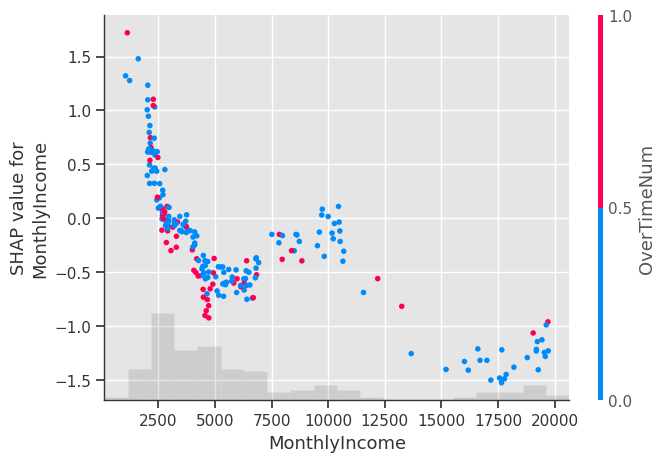

In [256]:
shap.plots.scatter(shap_values[:, "MonthlyIncome"], x_jitter=1, color=shap_values[:, "OverTimeNum"])

The separation between high (red) and low (blue) overtime points is not consistent across the income spectrum.
 + For low-income employees, there is some indication that high overtime contributes to higher attrition risk.
 + However, for middle- and high-income employees, the SHAP values are less differentiated by overtime.

### Monthly Income and Years with Current Manager

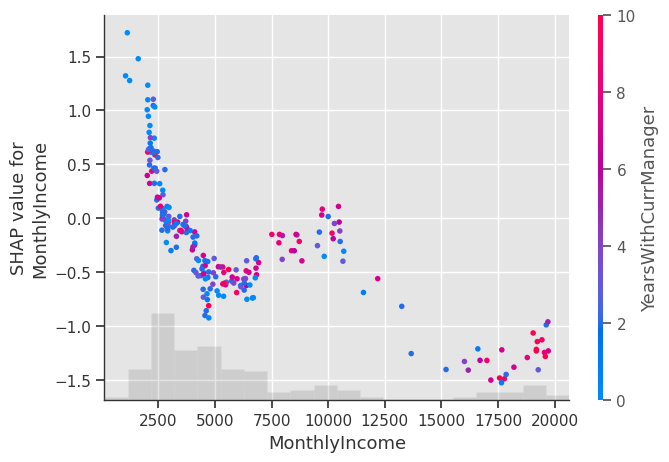

In [257]:
shap.plots.scatter(shap_values[:, "MonthlyIncome"], x_jitter=1, color=shap_values[:, "YearsWithCurrManager"])

+ Low-income employees with short tenures are at higher risk of attrition.
+ High-income employees with long tenures are more stable.

This suggests that the combination of these features captures some critical retention dynamics. However, this trend might be moderated by third variables such as that employees at the beginning of their career (at a company) will naturally have spend less years with their current manager and are also more likely to receive a lower salary, while employees who work longer for the same company are more likely to have longer managerial tenures as well as higher monthly salary. Relatedly, in the middle-income range, neither income nor managerial tenure shows a clear trend.


# Short Summary of The Results

SHAP analysis provided insights into the drivers of employee attrition, enabling targeted and effective interventions. The key implications are:

### Prioritization of Retention Efforts:

Features like overtime and monthly income were identified as critical drivers of attrition. HR teams can focus retention strategies on targeting employees with specific profiles.

### Work-Life Balance and Job Demands:

Employees working overtime are significantly more likely to leave. Reviewing workload distribution and ensuring work-life balance can mitigate this risk. Longer commutes contribute to higher attrition. Flexible work arrangements or location-based recruitment strategies may mitigate this risk.

### Financial and Career Incentives:
Monthly Income and Stock Option Levels emerged as critical factors affecting attrition likelihood. Lower-income employees are more likely to leave, indicating the need for competitive compensation packages, particularly for high-risk roles. Employees with stock options, particularly at moderate levels, exhibit lower attrition. Expanding stock options or other financial incentives could enhance retention. Employees with a history of job-hopping are at greater risk of attrition, suggesting a need for tailored engagement strategies to improve retention.

### Improving Employee Satisfaction and Well-Being:

Low levels of relationship as well as environment satisfaction and job satisfaction were significant predictors of attrition, emphasizing the need for initiatives to enhance workplace conditions, job satisfaction, and overall employee contentedness.

### Supporting Early-Career Employees:

Younger employees and those in early-career stages are more likely to leave, reflecting higher mobility. Mentorship programs and clear career progression pathways can help retain these employees. Relatedly, shorter tenures with the current manager correlated with higher attrition, highlighting the importance of strong managerial relationships. Leadership training and communication improvements could address this.


# Business Impact of Good Retention Strategies

## Overall Impact of Reducing Attrition

In [258]:
avg_salary = df_cleaned["MonthlyIncome"].mean() * 12  # Convert monthly income to annual salary
print(f"Average Annual Salary: ${avg_salary:,.2f}")

Average Annual Salary: $78,035.18


In [259]:
direct_cost = avg_salary * 0.60
total_cost_min = avg_salary * 0.90
total_cost_max = avg_salary * 2.00

print(f"Direct Cost per Employee Lost: ${direct_cost:,.2f}")
print(f"Total Cost per Employee Lost (Min): ${total_cost_min:,.2f}")
print(f"Total Cost per Employee Lost (Max): ${total_cost_max:,.2f}")

Direct Cost per Employee Lost: $46,821.11
Total Cost per Employee Lost (Min): $70,231.66
Total Cost per Employee Lost (Max): $156,070.35


In [260]:
attrition_rate = df_cleaned['AttritionNum'].mean()  # Proportion of employees who leave
total_employees = len(df_cleaned)  # Number of employees in test set
annual_attrition = total_employees * attrition_rate

print(f"Estimated Number of Employees Leaving Annually: {annual_attrition:.0f}")

Estimated Number of Employees Leaving Annually: 237


In [261]:
annual_loss_min = round((annual_attrition * total_cost_min),2)
annual_loss_max = round((annual_attrition * total_cost_max),2)

print(f"Annual Cost of Attrition (Min): ${annual_loss_min:,.2f}")
print(f"Annual Cost of Attrition (Max): ${annual_loss_max:,.2f}")

Annual Cost of Attrition (Min): $16,644,902.94
Annual Cost of Attrition (Max): $36,988,673.19


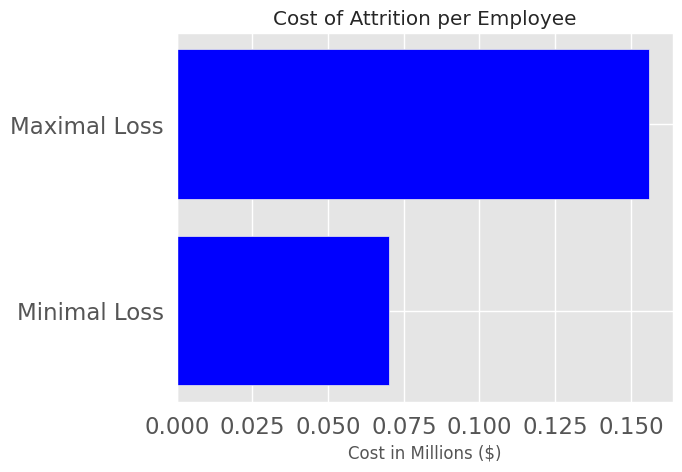

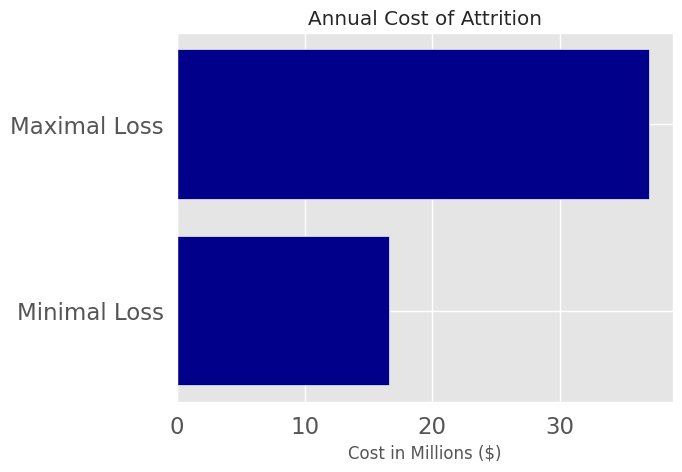

In [262]:
df_losses_emp = pd.DataFrame(dict(graph =['Minimal Loss', 'Maximal Loss'],
                              emp = [total_cost_min, total_cost_max]))

df_losses_ann = pd.DataFrame(dict(graph =['Minimal Loss', 'Maximal Loss'],
                              total = [annual_loss_min, annual_loss_max]))

# Convert annual cost to millions of dollars
df_losses_emp['emp_millions'] = df_losses_emp['emp'] / 1_000_000
df_losses_ann['total_millions'] = df_losses_ann['total'] / 1_000_000

plt.barh(y=df_losses_emp['graph'], width=df_losses_emp['emp_millions'], color='blue', label='Per Employee')
plt.title('Cost of Attrition per Employee')
plt.xlabel('Cost in Millions ($)')
plt.show()

plt.barh(y=df_losses_ann['graph'], width=df_losses_ann['total_millions'], color='darkblue', label='Annually')
plt.title('Annual Cost of Attrition')
plt.xlabel('Cost in Millions ($)')

# saving and downloading the file
savefig('bar_loss.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("bar_loss.png")
plt.show()



In [263]:
retention_improvement = [0.20, 0.30, 0.40, 0.50, 0.60, 0.70] # % reduction in attrition
# Create an empty dictionary to store the data for the DataFrame
data = {
    'Retention Improvement': [],
    'Retained Employees': [],
    'Savings in Millions (Min)': [],
    'Savings in Millions (Max)': []
}

for i in retention_improvement:
    retained_employees = annual_attrition * i
    savings_min = retained_employees * total_cost_min
    savings_max = retained_employees * total_cost_max

    # Append values to the corresponding lists in the dictionary
    data['Retention Improvement'].append(i * 100)
    data['Retained Employees'].append(round(retained_employees))
    data['Savings in Millions (Min)'].append(savings_min/ 1_000_000)
    data['Savings in Millions (Max)'].append(savings_max/ 1_000_000)

# Create the DataFrame after the loop
df_predictions = pd.DataFrame(data)

# Print the DataFrame (optional)
print(df_predictions)

   Retention Improvement  Retained Employees  Savings in Millions (Min)  \
0                   20.0                  47                   3.328981   
1                   30.0                  71                   4.993471   
2                   40.0                  95                   6.657961   
3                   50.0                 118                   8.322451   
4                   60.0                 142                   9.986942   
5                   70.0                 166                  11.651432   

   Savings in Millions (Max)  
0                   7.397735  
1                  11.096602  
2                  14.795469  
3                  18.494337  
4                  22.193204  
5                  25.892071  


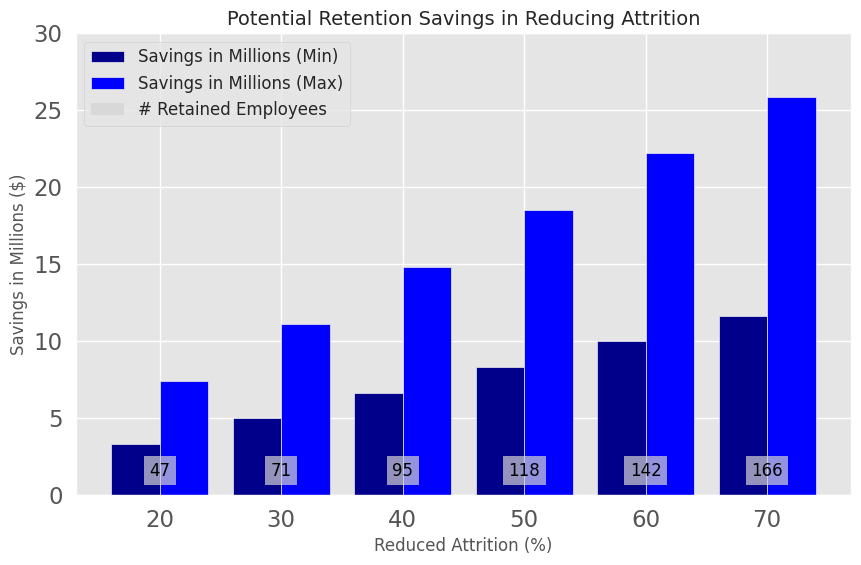

In [265]:
import matplotlib.patches as mpatches # Import the mpatches module

# Create the bar plot
fig, ax = plt.subplots(figsize=(10, 6))

# Define bar width
bar_width = 4

# Plot "Min Savings" as the first set of bars
ax.bar(x=df_predictions['Retention Improvement'] - bar_width / 2,
       height=df_predictions['Savings in Millions (Min)'],
       width=bar_width, label='Savings in Millions (Min)', color='darkblue')

# Plot "Max Savings" as the second set of bars, shifted to the right
ax.bar(x=df_predictions['Retention Improvement'] + bar_width / 2,
       height=df_predictions['Savings in Millions (Max)'],
       width=bar_width, label='Savings in Millions (Max)', color='blue')

# Add retained employee labels above the "Max Savings" bars
for i, retained_employees in enumerate(df_predictions['Retained Employees']):
    x = df_predictions['Retention Improvement'].iloc[i] + (bar_width - 4)  # Align between bars
    y = 1  # Slightly above the x-axis

    ax.text(x, y, f'{retained_employees}',
            ha='center', va='bottom',
            color='black', fontsize=12,
            bbox=dict(facecolor='lightgrey', edgecolor='none', alpha=0.7))

# Add legend for bars and employee labels
handles, labels = ax.get_legend_handles_labels()
rect = mpatches.Rectangle((0, 0), 1, 1, fc="lightgrey", edgecolor="none", alpha=0.7)
handles.append(rect)
labels.append('# Retained Employees')
ax.legend(handles=handles, labels=labels, fontsize=12)

# Customize the plot
ax.set_xlabel('Reduced Attrition (%)', fontsize=12)
ax.set_ylabel('Savings in Millions ($)', fontsize=12)
ax.set_title('Potential Retention Savings in Reducing Attrition', fontsize=14)
ax.set_ylim(0,30)

# saving and downloading the file
savefig('bar_savings.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("bar_savings.png")

# Show the plot
plt.show()

## Example: Reducing Overtime for Employee Retention

In [266]:
# Calculate average salary for employees who work overtime vs. those who don't
overtime_salaries = df_cleaned.groupby("OverTimeNum")["MonthlyIncome"].mean() * 12  # Convert to annual salary

# Print results
print(f"Average Annual Salary for Employees Working Overtime: ${overtime_salaries[1]:,.2f}")
print(f"Average Annual Salary for Employees Not Working Overtime: ${overtime_salaries[0]:,.2f}")

Average Annual Salary for Employees Working Overtime: $78,582.58
Average Annual Salary for Employees Not Working Overtime: $77,819.12


As salaries are roughly the same for employees with and without overtime, we keep the below estimates based on the overall average.

In [267]:
# Group by Overtime and calculate attrition rates
overtime_attrition_rates = df_cleaned.groupby("OverTimeNum")["AttritionNum"].mean()

# Print attrition rates
print(f"Attrition Rate for Employees Working Overtime: ${overtime_attrition_rates[1]:,.2f}")
print(f"Attrition Rate for Employees Not Working Overtime: ${overtime_attrition_rates[0]:,.2f}")

Attrition Rate for Employees Working Overtime: $0.31
Attrition Rate for Employees Not Working Overtime: $0.10


In [268]:
# Define intervention scenario: Reduce overtime workers by 30%
reduction_percentage = 0.30  # Change this for different scenarios

# Estimate number of employees moving from "Overtime" to "No Overtime"
overtime_employees = df_cleaned["OverTimeNum"][df_cleaned["OverTimeNum"] == 1].sum() # Correct line to count employees with OvertimeNum == 1
employees_shifted = int(overtime_employees * reduction_percentage) # Using int to get whole numbers of shifted employees

# Attrition rates
attrition_overtime = overtime_attrition_rates[1]
attrition_no_overtime = overtime_attrition_rates[0]

# Calculate new estimated attrition rate
attrition_saved = employees_shifted * (attrition_overtime - attrition_no_overtime)

# Display results
print(f"Estimated Employees Retained by Reducing Overtime by {reduction_percentage*100:.0f}%: {attrition_saved:.0f}")

Estimated Employees Retained by Reducing Overtime by 30%: 25


In [269]:
# Estimate cost savings
savings_min = attrition_saved * avg_salary * 0.90
savings_max = attrition_saved * avg_salary * 2.00

print(f"Estimated Cost Savings from Retention (Min): ${savings_min:,.2f}")
print(f"Estimated Cost Savings from Retention (Max): ${savings_max:,.2f}")

Estimated Cost Savings from Retention (Min): $1,749,793.16
Estimated Cost Savings from Retention (Max): $3,888,429.24


In [270]:
reduction_percentage = [0.20, 0.30, 0.40, 0.50, 0.60, 0.70] # % reduction in employees working overtime

# Estimate number of employees moving from "Overtime" to "No Overtime"
overtime_employees = df_cleaned["OverTimeNum"][df_cleaned["OverTimeNum"] == 1].sum() # Correct line to count employees with OvertimeNum == 1
# Attrition rates
attrition_overtime = overtime_attrition_rates[1]
attrition_no_overtime = overtime_attrition_rates[0]

# Create an empty dictionary to store the data for the DataFrame
data = {
    'Reduction in Overtime Employees': [],
    'Reduction in Overtime Attrition': [],
    'Savings in Millions (Min)': [],
    'Savings in Millions (Max)': []
}

for i in reduction_percentage:
    employees_shifted = int(overtime_employees * i)
    attrition_saved = employees_shifted * (attrition_overtime - attrition_no_overtime)
    savings_min = attrition_saved * avg_salary * 0.90
    savings_max = attrition_saved * avg_salary * 2.00

    # Append values to the corresponding lists in the dictionary
    data['Reduction in Overtime Employees'].append(i)
    data['Reduction in Overtime Attrition'].append(round(attrition_saved,2))
    data['Savings in Millions (Min)'].append(savings_min/ 1_000_000)
    data['Savings in Millions (Max)'].append(savings_max/ 1_000_000)

# Create the DataFrame after the loop
df_redOvertime = pd.DataFrame(data)

# Print the DataFrame (optional)
print(df_redOvertime)

   Reduction in Overtime Employees  Reduction in Overtime Attrition  \
0                              0.2                            16.68   
1                              0.3                            24.91   
2                              0.4                            33.35   
3                              0.5                            41.79   
4                              0.6                            50.03   
5                              0.7                            58.47   

   Savings in Millions (Min)  Savings in Millions (Max)  
0                   1.171233                   2.602739  
1                   1.749793                   3.888429  
2                   2.342465                   5.205478  
3                   2.935137                   6.522526  
4                   3.513698                   7.808217  
5                   4.106369                   9.125265  


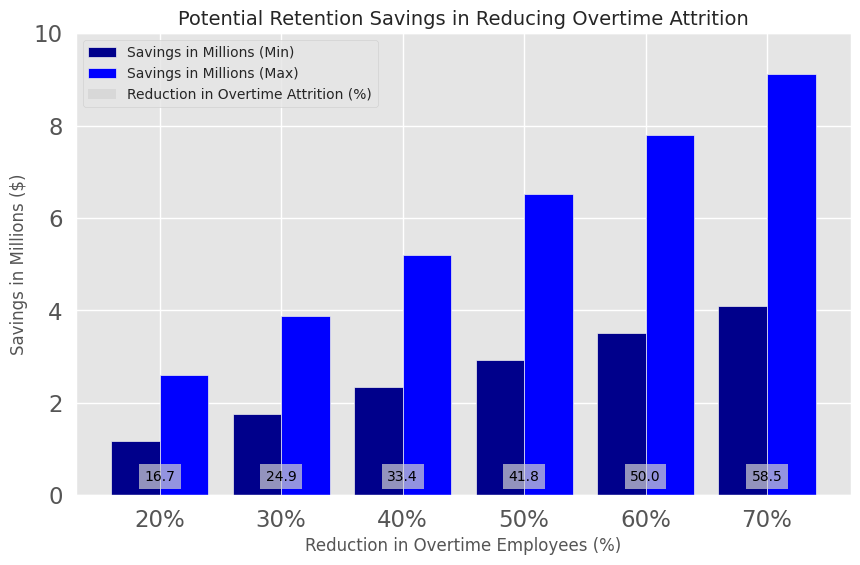

In [271]:
# Create the bar plot
fig, ax = plt.subplots(figsize=(10, 6))

# Define bar width as a fraction of the x-axis range
bar_width = 0.04  # Adjust to control spacing between bars

# Scale x-axis positions for "Min Savings" and "Max Savings"
x = df_redOvertime['Reduction in Overtime Employees']

# Plot "Min Savings" as the first set of bars
ax.bar(x - bar_width / 2,  # Shift left by half the bar width
       df_redOvertime['Savings in Millions (Min)'],
       width=bar_width, label='Savings in Millions (Min)', color='darkblue')

# Plot "Max Savings" as the second set of bars
ax.bar(x + bar_width / 2,  # Shift right by half the bar width
       df_redOvertime['Savings in Millions (Max)'],
       width=bar_width, label='Savings in Millions (Max)', color='blue')

# Add reduction in attrition labels above the "Max Savings" bars
for i, reduction in enumerate(df_redOvertime['Reduction in Overtime Attrition']):
    x_pos = x.iloc[i]  # Centered above grouped bars
    y_pos = 0.25  # Slightly above the x-axis

    ax.text(x_pos, y_pos, f'{reduction:.1f}',
            ha='center', va='bottom',
            color='black', fontsize=10,
            bbox=dict(facecolor='lightgrey', edgecolor='none', alpha=0.7))

# Add legend for bars and attrition labels
handles, labels = ax.get_legend_handles_labels()
rect = mpatches.Rectangle((0, 0), 1, 1, fc="lightgrey", edgecolor="none", alpha=0.7)
handles.append(rect)
labels.append('Reduction in Overtime Attrition (%)')
ax.legend(handles=handles, labels=labels, fontsize=10)

# Customize the plot
ax.set_xlabel('Reduction in Overtime Employees (%)', fontsize=12)
ax.set_ylabel('Savings in Millions ($)', fontsize=12)
ax.set_title('Potential Retention Savings in Reducing Overtime Attrition', fontsize=14)
ax.set_xticks(x)  # Set x-ticks to match the data
ax.set_xticklabels([f'{v*100:.0f}%' for v in x])  # Format x-tick labels as percentages
ax.set_ylim(0, 10)  # Adjust y-axis limit for better visualization

# saving and downloading the file
savefig('bar_savings_overt.png', transparent=True, bbox_inches='tight', dpi=300)
#files.download("bar_savings_overt.png")

# Show the plot
plt.show()